
<center> <h1><b>Jigsaw Unintended Bias in Toxicity Classification</b></h1> </center>

# **1. Business Problem**

## **1.1 Problem Description**

**The Conversation AI team** (it is research initiated by **Jigsaw** and **Google**) build a toxicity model, they found that the model [incorrectly learned to associate](https://medium.com/the-false-positive/unintended-bias-and-names-of-frequently-targeted-groups-8e0b81f80a23) the names of frequently attacked identities with toxicity. So model predicted high toxicity for those comments which contains word like **gay**, **black**, **muslim**, **white**, **lesbian** etc, even when comments were not actually toxic (e.g. I am a gay women.). This happened because the dataset was collected from the sources where such words (or identities) are considered as highly offensive. A model is need to be build which can find the toxicity in the comments and minimize the **unintended bias** with respect to some **identities**.

* A ***toxic comment*** is that comments which are offensive and sometimes they makes some people leave the discussion (on public forums). 
* ***unintended bias*** is related to unplanned bias which happend because the data was collected from such sources which considered some words (or identities) very offensive.
> credit: https://www.kaggle.com/c/jigsaw-unintended-bias-in-toxicity-classification/overview   

## **1.2 Problem Statement**

The model which was built by **The Conversation AI team** has the problem of **unintended bias** and this has to be removed (or minimized) because of this the comments which are not actually toxic will be predicted as toxic and this is not good for our business.

## **1.3 Sources**

* **Data:** https://www.kaggle.com/c/jigsaw-unintended-bias-in-toxicity-classification/data
* **Blog:**https://medium.com/the-false-positive/unintended-bias-and-names-of-frequently-targeted-groups-8e0b81f80a23
* https://twitter.com/jessamyn/status/901476036956782593
* **Research Paper:** https://arxiv.org/abs/1903.04561

## **1.4 Objective and Constraint**

**Objective**
* Predicting whether a comment is toxic or not.
* Minimize the unintended bias. 

**Constraint**
* No strict latency requirements 

# **2. Machine Learning Problem**

## **2.1 Data**

> **Disclaimer:** The dataset for this competition contains text that may be considered profane, vulgar, or offensive.

### **2.1.1 Data Overview**

**Data Files**
* **Train Data**
    * There is only one file for training and there are 45 columns in the train.csv data. But out of these 45 columns only, a few columns are important for this case study. 
* **Test data**
    * Test data (***test.csv***) has only two columns (***id*** and ***comment_text***).

So we'll be making our model using this **common_text** feature which will predict the **target** (whether a comment is toxic or not).

* **comment_text:** The text data of individual comment is in **comment_text** column.
* **target:** In trian data **target** column shows the toxicity level of corresponding comment. Attributes other than **id** and **comment_text** are fractional value and these values are given by humans. The target value which is greater than or equal to 0.5 (i.e.`target >= 0.5`) will be considered as toxic comment.
* Train data has toxicity subtype attributes, but model don't need to predict these attributes. These attributes are: **severe_toxicity, obscene, threat insult, identity_attack** and **sexual_explicit**.
* Each comments has been labeled with a variety of **identity** attributes. There are many attributes but we only need to consider few of them which are - 
    * male
    * female
    * homosexual_gay_or_lesbian
    * christian
    * jewish
    * muslim
    * black
    * white
    * psychiatric_or_mental_illness

* These **identity** atributes will be used to get the final metric of this case study.

**NOTE:** Note that the data contains different comments that can have the exact same text. Different comments that have the same text may have been labeled with different targets or subgroups.

**Examples**

* **Comment:** *i'm a white woman in my late 60's and believe me, they are not too crazy about me either!!*
    * **Toxicity Labels:** All 0.0
    * **Identity Mention Labels:** female: 1.0, white: 1.0 (all others 0.0)
* **Comment:** *Why would you assume that the nurses in this story were women?*
    * **Toxicity Labels:** All 0.0
    * **Identity Mention Labels:** female: 0.8 (all others 0.0)

We're going to keep only 12 columns of train data which are important to build our model and these 12 columns (or attributes) are - 
1. **id**
2. **comment_text**
3. **male**
4. **female**
5. **homosexual_gay_or_lesbian**
6. **christian**
7. **jewish**
8. **muslim**
9. **black**
10. **white**
11. **psychiatric_or_mental_illness**
12. **target**

> **Credit:**https://www.kaggle.com/c/jigsaw-unintended-bias-in-toxicity-classification/data

## **2.2 Mapping the real world problem to a Machine Learning Problem**

### **2.2.1 Type of Machine Learning Problem**

This is two class classification task. Target label `0` means non-toxic comments and target label `1` means toxic comment. 

### **2.2.2 Performance metric**

**Primary Metric**
* It's basic performance metric is **`AUC`** (area under the curve).
* But we'll be one more metric which combine the overall-AUC and bias-AUC. Go through [this](https://www.kaggle.com/c/jigsaw-unintended-bias-in-toxicity-classification/overview/evaluation) and [this](https://www.kaggle.com/dborkan/benchmark-kernel) link to understand it much better.

**Secondary Metric:**
* Confusion Matrix for whole data and then confusion matrix for each subgroup/identity, individually.

Let's see what will be overall-AUC.

**Overall AUC $\mathbf {(AUC)_{overall}}$**
* This is the ROC-AUC for the full evaluation set.

**Bias AUCs**

Most of the metrics for unintended bias divides the test data based on identity or demographic subrgroups and then calculate the metric for each subgroup individually. For our **Bias-AUC** metrics, we'll also divides the data by subgroup (or identity). However, instead of calculating the metrics for subgroups individually, our metric compare the subgroup to the rest of the data, which we call the **“background”** data.

Let's define some parameters to define what our three **Bias-AUC** metrices will be:
* $\large \mathbf {D^{-}}$: **negative** examples in the **background**
* $\large \mathbf {D^{+}}$: **positive** examples in the **background**
* $\large \mathbf {D^{-}_{g}}$: **negative** examples in the **indentity subgroup**
* $\large \mathbf {D^{+}_{g}}$: **positive** examples in the **indentity subgroup**

**NOTE:** Here **background** data means that it is a subset of whole data which does not include a **subgroup**. When we'll be calculating our AUC we'll use the union of this **background** data and this **subgroup** (or not).

* **Subgroup AUC:**
    * $ (SUB)_{AUC} =  AUC( D^{-}_{g} + D^{+}_{g}) $
    * This will calculate AUC only on the subgroups. Make two subset of the dataset, one will have the corresponding subgroup with **target** label as **1** and second subset will have corresponding subgroup with **target** label as **0**. Then take the union of these two subsets and then calculate the AUC on this set. In more simple word get all examples (positve and negative) for a subgroup and then calculate the AUC. 

* **BPSN (Background Positive, Subgroup Negative) AUC:**
    * $ (BPSN)_{AUC} = AUC(D^{+} + D^{-}_{g}) $
    * This will calculate the AUC on the ***positive examples in the background*** and ***negative examples in the subgroup***. Make two subsets from the dataset, the first subset will have the data points where the target label is 1 and given subgroup is False, the second subset will have the data points where target label is 0 for the given subgroup/identity. Now take the union of these two subsets and calculate the AUC value.
    * This value would be reduced when scores for negative examples in the subgroup are higher than scores for other positive
example. These examples would likely appear as ***false positives*** within the subgroup at many thresholds.
    * In other words, low value for this means model is confusing non-toxic examples that mention the identity/subgroup (where actual target label is **"0"** for given identity/subgroup) with toxic examples.
    * So model will be predicting higher toxicity score for non-toxic examples mentioning the identity (if this value is low).
    * * If this value is low, then we can also say that our model is not doing good on this $D^{-}_{g}$ subset.

* **BNSP (Background Negative, Subgroup Positive) AUC:**
    * $ (BNSP)_{AUC} = AUC(D^{-} + D^{+}_{g}) $
    * This will calculate the AUC on the ***negative examples in the background** and **positive examples in the subgroup/identity***. Make two subsets from the dataset, the first subset will have the data points where the target label is 0 and given subgroup is False, the second subset will have the data points where target label is 1 for the given subgroup/identity. Now take the union of these two subsets and calculate the AUC value.
    * This value would be reduced when scores for positive examples in the subgroup are lower than scores for other negative examples. The examples would likely appear as **false negatives** within the  subgroup at many thresholds.
    * In other words, low value for this means that model is confusing toxic examples that mention the identiy/subgroup with non-toxic examples.
    * So the mode is predicting lower toxicity score than it should for the toxic examples mentioning the identity (if the value is low).
    * If this value is low, then we can also say that our model is not doing good on this $\mathbf {D^{+}_{g}}$ subset.

**Generalized Mean of Bias AUCs**

To combine the per-identity Bias AUCs into one overall measure, we calculate their generalized mean as defined below:

\begin{equation}
\mathbf {M_{p}(m_{s}) = \left (\frac {1}{N} \sum_{s=1}^{N} m_{s}^{p}\right)^{\frac {1}{p}}}
\end{equation}

where:
* $\mathbf M_{p}=$ the pth power-mean function
* $\mathbf m_{s}=$ the bias metric $\mathbf m$ calulated for subgroup $\mathbf s$
* $\mathbf N=$ number of identity subgroups

**NOTE:** We'll be using $\mathbf p=-5$


**Final Metric**

We combine the overall AUC with the generalized mean of the Bias AUCs to calculate the final model score:

\begin{equation}
\large \mathbf {score = w_{0}(AUC)_{overall} + \sum_{a=1}^{A} w_{a}M_{p}(m_{s,a})}
\end{equation}

where:
* $\mathbf A=$ number of submatrices (3)
* $\mathbf m_{s,a}=$ bias metric for identity subgroup $\mathbf s$ using submetric $\mathbf a$ 
* $\mathbf w_{0}$ and $\mathbf w_{a}=$ are the relative importance of each submetric. (**Use all $\mathbf {w = 0.25}$**, i.e. equal importance to all submatrics).


> credit1: https://www.kaggle.com/c/jigsaw-unintended-bias-in-toxicity-classification/overview/evaluation

> credit2: https://arxiv.org/abs/1903.04561 (Section 3.1) 

### **2.2.3 Machine Learning Objective and Constraints**

* Maximizing the final **score** defined in above section.
* It'll be better if model can provide the interpretability.

# **3. Exploratory Data Analysis**

## **3.1 Data Loading and Pre-Processing**

### **3.1.1 Data Reading**

In [0]:
import os, time, re

import numpy as np
from numpy import asarray
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
import pickle

from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from prettytable import PrettyTable

# https://stackoverflow.com/a/14463362/12005970
import warnings
warnings.filterwarnings("ignore")

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [9]:
d = "/content/drive/My Drive/Colab Notebooks/Datasets/Personal Case Study/\
Jigsaw Unintended Bias in Toxicity Classification/Dataset/"
df = pd.read_csv(d+"Raw Dataset/Train/train.csv")
print("Shape of dataset is: ", df.shape)
df.head(2)

Shape of dataset is:  (1804874, 45)


,id,target,comment_text,severe_toxicity,obscene,identity_attack,insult,threat,asian,atheist,bisexual,black,buddhist,christian,female,heterosexual,hindu,homosexual_gay_or_lesbian,intellectual_or_learning_disability,jewish,latino,male,muslim,other_disability,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,created_date,publication_id,parent_id,article_id,rating,funny,wow,sad,likes,disagree,sexual_explicit,identity_annotator_count,toxicity_annotator_count
0,59848,0.0,"This is so cool. It's like, 'would you want yo...",0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-29 10:50:41.987077+00,2,NaN,2006,rejected,0,0,0,0,0,0.0,0,4
1,59849,0.0,Thank you!! This would make my life a lot less...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-29 10:50:42.870083+00,2,NaN,2006,rejected,0,0,0,0,0,0.0,0,4


In [10]:
#keep only those columns which are required
identity_columns = ['male', 'female', 'homosexual_gay_or_lesbian',
                    'christian', 'jewish','muslim', 'black', 'white',
                    'psychiatric_or_mental_illness']

cols = ["id","comment_text"] + identity_columns + ["target"]
df = df[cols]
print("Now shape of the data: ", df.shape)
df.head(2)

Now shape of the data:  (1804874, 12)


,id,comment_text,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness,target
0,59848,"This is so cool. It's like, 'would you want yo...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,59849,Thank you!! This would make my life a lot less...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


* Converting *target* and *identities* into boolean (1 and 0).
* Many values of identies are **NaN**. This entry was labled by humans and most of time we don't put a number if (comment_text) does not belong to the corresponding identity. So here **NaN** means **False** or **0**.
* Make `comment_text`  as string.

In [11]:
def convert_to_bool(data, cols):
    """
    function to convert values into boolean
    """
    for col in cols:
        data[col] = np.where(data[col] >= 0.5, True, False)
    return data

# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.astype.html
# df = df.astype({"comment_text":"str"})
print(df.dtypes)

df = convert_to_bool(df, identity_columns)

# converting  target feature to 0 and 1
df["target"] = df["target"].apply(lambda x: 1 if x >= 0.5 else 0)
print("\n\n")
df.head()

id                                 int64
comment_text                      object
male                             float64
female                           float64
homosexual_gay_or_lesbian        float64
christian                        float64
jewish                           float64
muslim                           float64
black                            float64
white                            float64
psychiatric_or_mental_illness    float64
target                           float64
dtype: object





,id,comment_text,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness,target
0,59848,"This is so cool. It's like, 'would you want yo...",False,False,False,False,False,False,False,False,False,0
1,59849,Thank you!! This would make my life a lot less...,False,False,False,False,False,False,False,False,False,0
2,59852,This is such an urgent design problem; kudos t...,False,False,False,False,False,False,False,False,False,0
3,59855,Is this something I'll be able to install on m...,False,False,False,False,False,False,False,False,False,0
4,59856,haha you guys are a bunch of losers.,False,False,False,False,False,False,False,False,False,1


### **3.1.2 Hand Crfted Features & Text Processing**

#### **3.1.2.1 Hand Crafted Features**

* In this section I'll create some hand crafted features.
>**Reference:**https://towardsdatascience.com/how-i-improved-my-text-classification-model-with-feature-engineering-98fbe6c13ef3



**Hand Crafted Feature are:-**
1. **`word_count`**: Total Number of words in the sentence
2. **`char_count`**: total number of characters in the sentence (**`word_count`** <= **`char_count`**)
3. **`word_density`**: Density of words in the sentence $\mathbf {word\_density = \frac{word\_count}{char\_count}}$

4. **`total_length`**: total length of the sentence (it includes extra spaces, special character etc.)
5. **`capitals`**: Number of capital character in the senetence
6. **`caps_vs_length`**: ratio of number of capital words to total lenght of sentence. $\mathbf{caps\_vs\_lenght = \frac{capitals}{total\_lenght}}$

7. **`punc_count`**: Number of punctuation in the sentence
8. **`num_exclamation_marks`**: Number of exclamation marks (**!**)
9. **`exlamation_vs_punc_count`**:ratio of number of exlamation marks to total number of punctuation. $\mathbf {exlamation\_vs\_punc\_count = \frac {num\_exclamation\_marks}{punc\_count}}$
10. **`num_question_marks`**: Number of question marks (**?**)
11. **`question_vs_punc_count`**: ratio of number of question marks to total number of punctuation. $\mathbf {question\_vs\_punc\_count = \frac {num\_question\_marks}{punc\_count}}$

12. **`num_symbols`**: Number of symbols (**@, #, $, %, ^, &, *, ~**)

13. **`num_unique_words`**: Number of unique word in senetence
14. **`words_vs_unique`**: ratio of unique words to total word $\mathbf {words\_vs\_unique=\frac{num\_unique\_word}{word\_count}}$

* There are total 14 hand crafted features.
* I'm going to number punctuation from [here](https://grammar.yourdictionary.com/punctuation/what/fourteen-punctuation-marks.html).

``` Python
# list of punctuations
punc = [".", "?", "!", ",", ";", ":", "-", "--", "(", ")", "[", "]", "{", "}", "'", '"', "..."]

# symbols list
symbols = ["@", "#", "$", "%", "^", "&", "*", "~"]
```

In [0]:
# list of punctuations
punc = [".", "?", "!", ",", ";", ":", "-", "--", "(", ")", "[", "]", "{", "}", "'", '"', "..."]
# symbols list
symbols = ["@", "#", "$", "%", "^", "&", "*", "~"]


def feature(data):
    """
    this created the designed features
    """
    print("Creating hand crafted features...")
    start = time.time()
    data_df = data.copy()
    # 1.
    print(" For 'word_count' feature...")
    data_df['word_count'] = data_df['comment_text'].apply(lambda x : len(x.split()))

    # 2.
    print(" For 'char_count' feature...")
    data_df['char_count'] = data_df['comment_text'].apply(lambda x : len(x.replace(" ","")))

    # 3.
    print(" For 'word_density' feature...")
    data_df['word_density'] = data_df['word_count'] / (data_df['char_count'] + 1)

    # 4.
    print(" For 'total_length' feature...")
    data_df['total_length'] = data_df['comment_text'].apply(len)

    # 5.
    print(" For 'capitals' feature...")
    data_df['capitals'] = data_df['comment_text'].apply(lambda comment: sum(1 for c in comment if c.isupper()))

    # 6.
    print(" For 'caps_vs_length' feature...") 
    data_df['caps_vs_length'] = data_df.apply(lambda row: float(row['capitals'])/float(row['total_length']),axis=1)

    # 7.
    print(" For 'punc_count' feature...")
    data_df['punc_count'] = data_df['comment_text'].apply(lambda x : len([a for a in x if a in punc]))

    # 8.
    print(" For 'num_exclamation_marks' feature...")     
    data_df['num_exclamation_marks'] =data_df['comment_text'].apply(lambda x: x.count('!'))

    # 9.
    print(" For 'exlamation_vs_punc_count' feature...")     
    data_df['exlamation_vs_punc_count'] = data_df['num_exclamation_marks']/data_df['punc_count']

    # 10.
    print(" For 'num_question_marks' feature...")
    data_df['num_question_marks'] = data_df['comment_text'].apply(lambda x: x.count('?'))

    # 11.
    print(" For 'question_vs_punc_count' feature...")     
    data_df['question_vs_punc_count'] = data_df['num_question_marks']/data_df['punc_count']

    # 12.
    print(" For 'num_symbols' feature...")
    data_df['num_symbols'] = data_df['comment_text'].apply(lambda x: sum(x.count(w) for w in '*&$%'))

    # 13.
    print(" For 'num_unique_words' feature...")  
    data_df['num_unique_words'] = data_df['comment_text'].apply(lambda x: len(set(w for w in x.split())))
    
    # 14.
    print(" For 'words_vs_unique' feature...") 
    data_df['words_vs_unique'] = data_df['num_unique_words'] / data_df['word_count']

    data_df.fillna(0, inplace = True)
    print("\nALL Done!\nTime take for this is {:.4f} seconds".format(time.time() - start))
    return data_df

In [13]:
df = feature(df)
print(df.shape)
df.head(2)

Creating hand crafted features...
 For 'word_count' feature...
 For 'char_count' feature...
 For 'word_density' feature...
 For 'total_length' feature...
 For 'capitals' feature...
 For 'caps_vs_length' feature...
 For 'punc_count' feature...
 For 'num_exclamation_marks' feature...
 For 'exlamation_vs_punc_count' feature...
 For 'num_question_marks' feature...
 For 'question_vs_punc_count' feature...
 For 'num_symbols' feature...
 For 'num_unique_words' feature...
 For 'words_vs_unique' feature...

ALL Done!
Time take for this is 209.0674 seconds
(1804874, 26)


,id,comment_text,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness,target,word_count,char_count,word_density,total_length,capitals,caps_vs_length,punc_count,num_exclamation_marks,exlamation_vs_punc_count,num_question_marks,question_vs_punc_count,num_symbols,num_unique_words,words_vs_unique
0,59848,"This is so cool. It's like, 'would you want yo...",False,False,False,False,False,False,False,False,False,0,19,83,0.226190,101,3,0.029703,9,1,0.111111,2,0.222222,0,19,1.0
1,59849,Thank you!! This would make my life a lot less...,False,False,False,False,False,False,False,False,False,0,22,93,0.234043,114,3,0.026316,7,3,0.428571,0,0.000000,0,22,1.0


#### **3.1.2.2 Text Proecssing**

* I'll remove any special character, emoji, links etc.
* I'll stemm the words using **PorterStemmer**

* Let's see the some comment text.

In [0]:
df.loc[999:1002,"comment_text"]

999                                          Test comment
1000    I feel as if Oregon could make itself known to...
1001    More desperately needed housing for whom? Peop...
1002    If we don't want Portland to become San Franci...
Name: comment_text, dtype: object

In [0]:
comments = df["comment_text"].values
print(comments[0])
print("="*100)
print(comments[50])
print("="*100)
print(comments[100])
print("="*100)
print(comments[1000])
print("="*100)
print(comments[5000])
print("="*100)
print(comments[10000])
print("="*100)
print(comments[50000])
print("="*100)
print(comments[100000])
print("="*100)
print(comments[500000])
print("="*100)
print(comments[1000000])

This is so cool. It's like, 'would you want your mother to read this??' Really great idea, well done!
The system is set up so if traffic is slow, an algorithm takes over until it picks up.
Loving this collection. Cant wait till Season 2 is released. Should be any day now according to http://yeezy-season2.com/
I feel as if Oregon could make itself known to the world for other things, like becoming a leader on carbon pricing or other climate policies. But maybe that's hopelessly idealistic.
Those most concerned and knowledgeable about global warming still can't quantify what it will take to fix it or whether it is actually capable of being fixed.   You can't 'rationally choose a future' when there are so many unknown variables in your equations.  Our knowledge of climate is so sketchy that the most recent El Nino predictions from sixteen (16) organizations including Scripps, NASA etc. vary as to water temperature changes by as much as 1- 4 degrees Celsius.   El Nino has been studied for 

**After looking at these sentences**
 * I'll do **stopword** removal (except **NOT**)
 * I'll remove html tag
 * I'll remove extrac spaces and special symbals, emojis.
 * I'll expand words  like **I'll to I will**, **"I'm to I am"** etc.
 * I'll remove tags if it exist.


In [14]:
import nltk
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
try:
    stop_words = set(stopwords.words("english"))
except:
    nltk.download('stopwords')
    stop_words = set(stopwords.words("english"))

#removing "not" stop word from stop_words
stop_words = stop_words - {"not"}

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [0]:
def text_process(row):
    try:
        text = row["comment_text"]
        text = str(text).lower()
        porter = PorterStemmer()

        #expansion
        text = text.replace("won't", "will not").replace("cannot", "can not").replace("can't", "can not")\
        .replace("n't", " not").replace("what's", "what is").replace("it's", "itis")\
        .replace("'ve", " have").replace("i'm", "i am").replace("'re", " are")\
        .replace("he's", "he is").replace("she's", "she is").replace("'s", " own")\
        .replace("%", " percent ").replace("₹", " rupee ").replace("$", " dollar")\
        .replace("€", " euro ").replace("'ll", " will")

        text = re.sub(r"<.*?>","", text) # removes the htmltags: https://stackoverflow.com/a/12982689

        #special character removal
        text = re.sub('[^a-zA-Z0-9\n]', ' ', text)
        #extra space removal
        text = re.sub('\s+',' ', text)

        # stopword removal
        text_to_words = []
        for word in text.split():
            if word not in stop_words:
                text_to_words.append(word)
            else:
                continue
        text = " ".join(text_to_words)
        
        # stemming the words
        text = porter.stem(text)

        return text

    except:
        print("There is no value in comment_text, so returnin 'nan'")
        
        return np.nan

In [16]:
tic = time.time()
print("processing train data...")
df.loc[:,"comment_text"] = df.apply(text_process, axis = 1)
print("Time take to process the text data: {:.2f} seconds".format(time.time()-tic))

processing train data...
Time take to process the text data: 198.15 seconds


### **3.1.3 Splitting Train Data**

**Split the data into trian, CV and test (80-10-10)**
* There will be **180k** (approx) datapoints in CV and test dataset. So this is good value to tune the hyper-parameter and validate the model.
* I'll do **stratified** splitting of the data. 

In [17]:
X = df[[col for col in df.columns]]
Y = df[["target"]]

X_train, X_test, y_train, Y_test = model_selection.train_test_split(X, Y, 
                                                                    train_size = 0.8,
                                                                    stratify = Y, 
                                                                    random_state = 42)
X_test, X_cv, y_test, y_cv = model_selection.train_test_split(X_test, Y_test,
                                                              train_size = 0.5,
                                                              stratify = Y_test,
                                                              random_state = 42)

print("Number of datapoints in train data: {:,}\n\
Number of datapoints in CV data: {:,}\n\
Number of datapoints in test data: {:,}".format(X_train.shape[0],
                                              X_cv.shape[0],
                                              X_test.shape[0]))

Number of datapoints in train data: 1,443,899
Number of datapoints in CV data: 180,488
Number of datapoints in test data: 180,487


## **3.2 EDA on Hand Crafted Features**

### **3.2.1 Univariate Analysis**

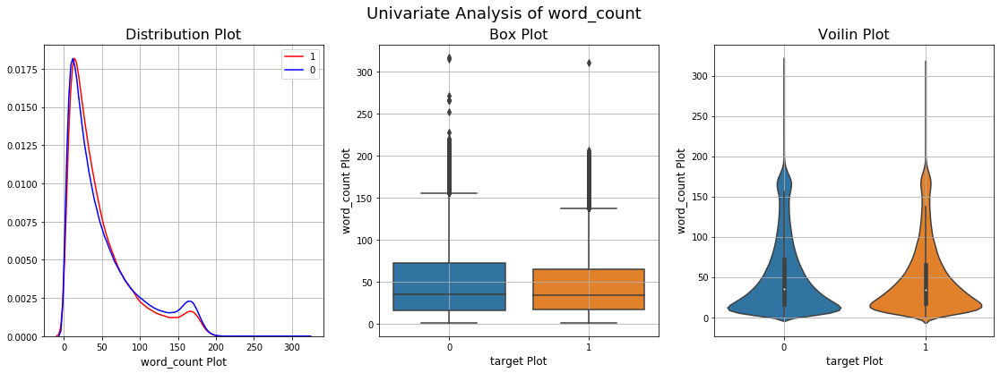

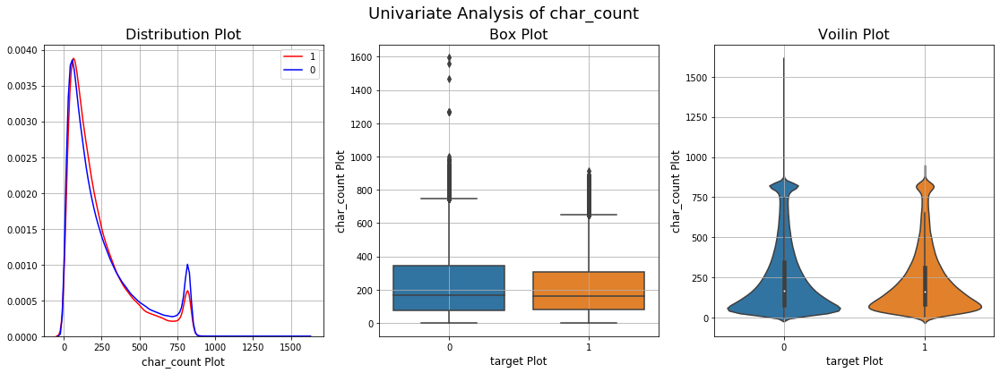

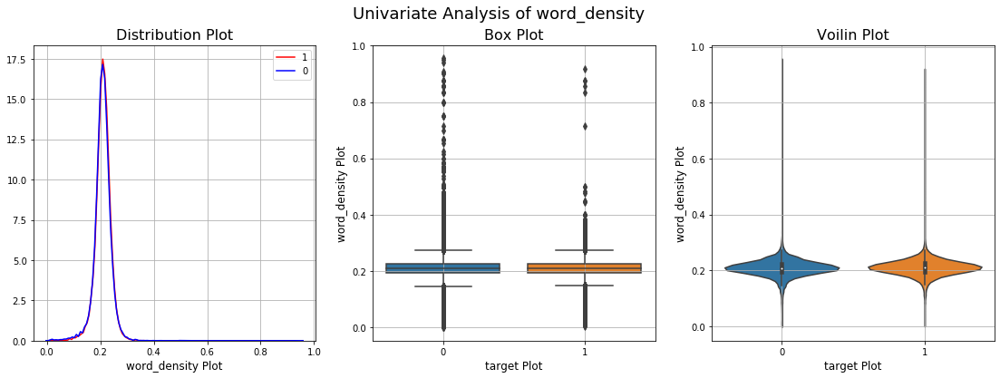

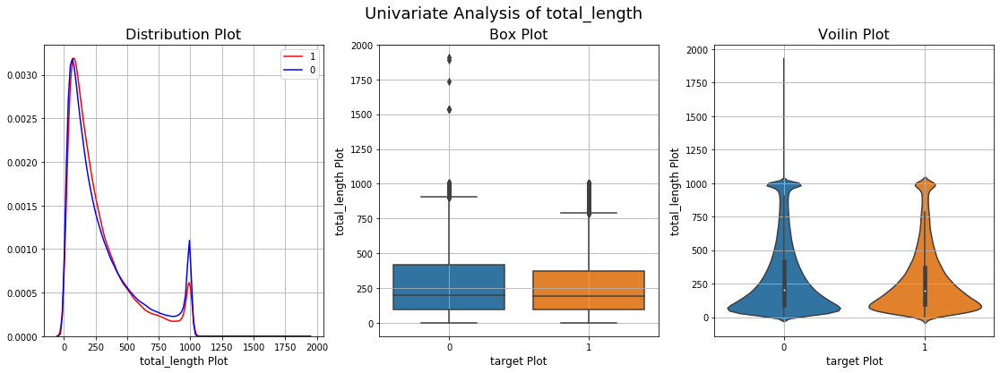

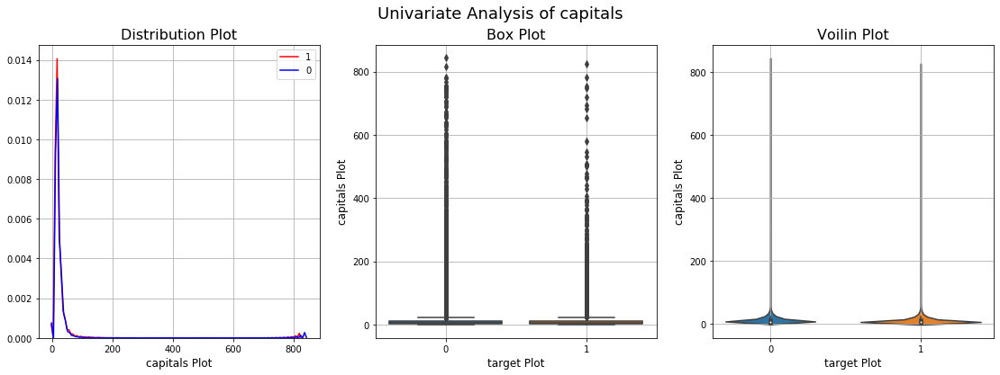

...

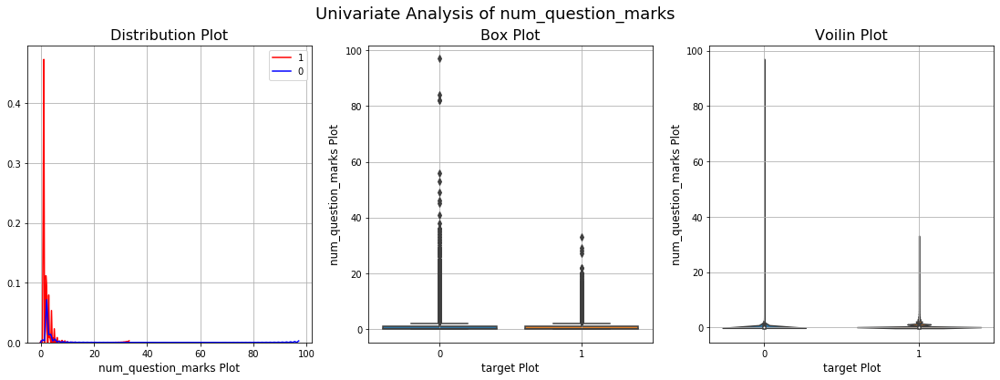

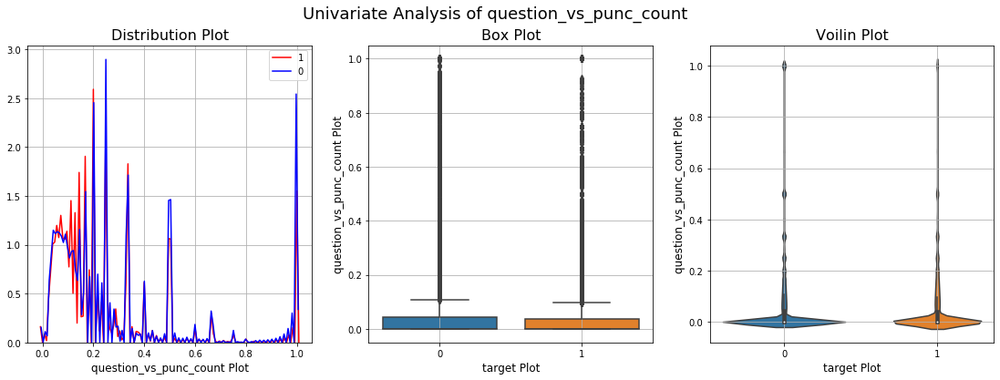

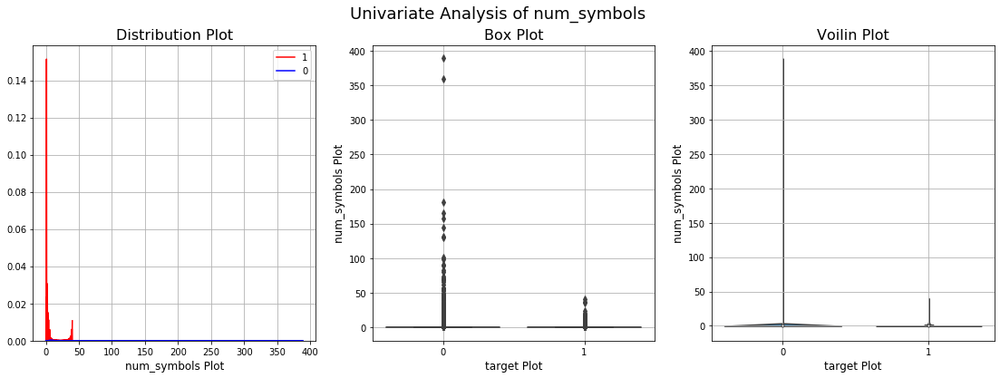

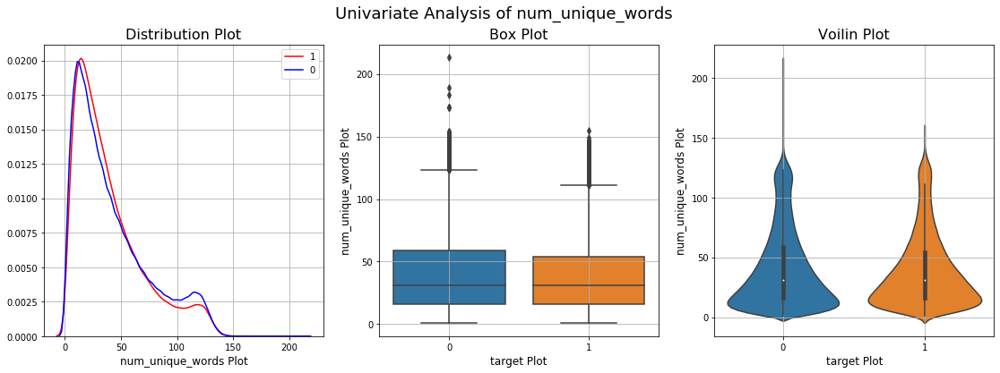

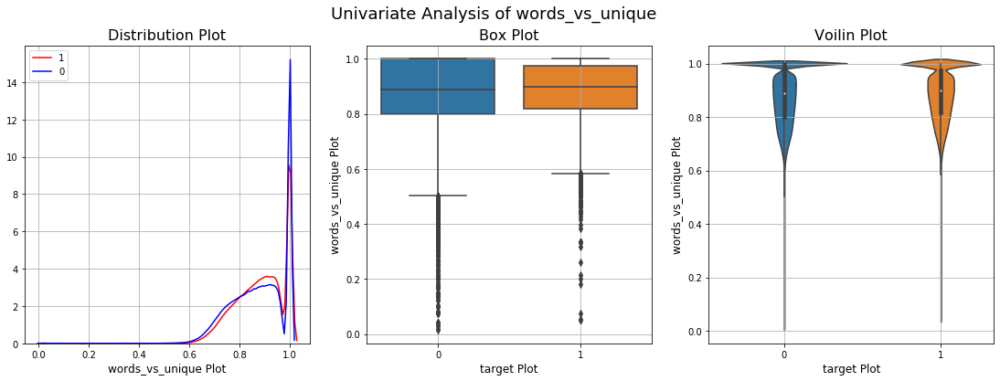

In [0]:
hand_crafted_features = list(df.columns[-14:])

for hand_crafted_feature in hand_crafted_features:
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (19, 6))

    # subplot main title and sub title: https://stackoverflow.com/a/35676071/12005970
    fig.suptitle("Univariate Analysis of {}".format(hand_crafted_feature), fontsize=18)

    # https://seaborn.pydata.org/generated/seaborn.distplot.html
    sns.distplot(df[df["target"] == 1][hand_crafted_feature], label = "1", color = 'red', hist = False, ax = ax1)
    sns.distplot(df[df["target"] == 0][hand_crafted_feature], label = "0", color = 'blue', hist = False, ax = ax1)
    ax1.set_title("Distribution Plot", fontsize = 16)
    ax1.set_xlabel("{} Plot".format(hand_crafted_feature), fontsize = 12)
    ax1.grid(1)

    # https://seaborn.pydata.org/generated/seaborn.boxplot.html
    sns.boxplot(x = "target", y = hand_crafted_feature, data = df, ax = ax2)
    ax2.set_title("Box Plot", fontsize = 16)
    ax2.set_xlabel("{} Plot".format("target"), fontsize = 12)
    ax2.set_ylabel("{} Plot".format(hand_crafted_feature), fontsize = 12)
    ax2.grid(1)

    # https://seaborn.pydata.org/generated/seaborn.violinplot.html
    sns.violinplot(x = "target", y = hand_crafted_feature, data = df, ax = ax3)
    ax3.set_title("Voilin Plot", fontsize = 16)
    ax3.set_xlabel("{} Plot".format("target"), fontsize = 12)
    ax3.set_ylabel("{} Plot".format(hand_crafted_feature), fontsize = 12)
    ax3.grid(1)

    plt.plot()

After looking at above, it can be seen that almost all handa crafted features are not very good to classify the classes becuase distribution of both class is almost overlapping. So they may not play very important role in classification.

But I'm going to keep them to train my models.

### **3.2.2 Multi-Variate Analysis**

**t-SNE Plot**
 * Using only first **5k** datapoints for this.

In [0]:
tsne_X = df[df.columns[-14:]].loc[0:5000,:]
tsne_Y = df[["target"]].loc[0:5000]

from sklearn.preprocessing import StandardScaler
data = StandardScaler().fit_transform(tsne_X)
# https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
from sklearn.manifold import TSNE

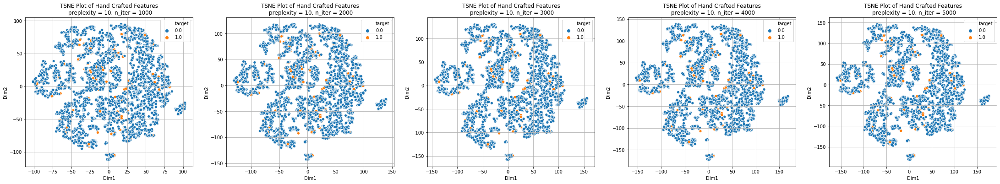

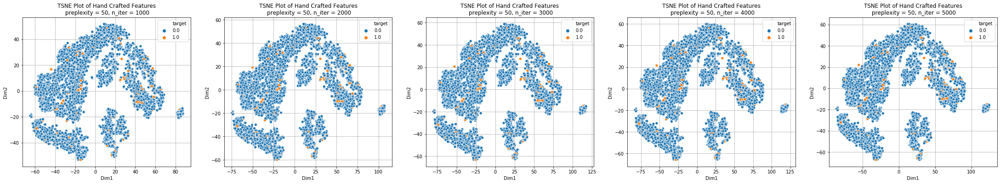

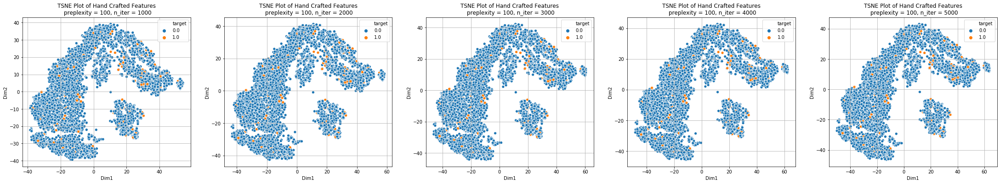

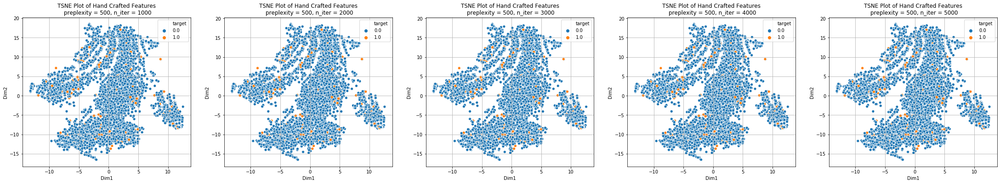

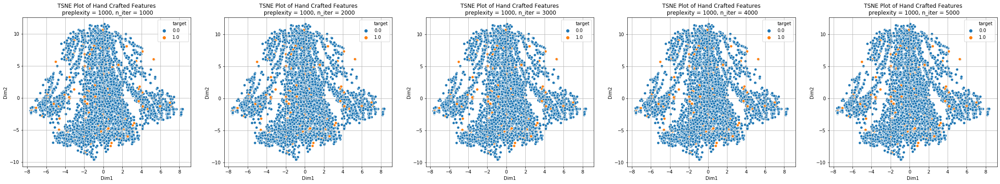

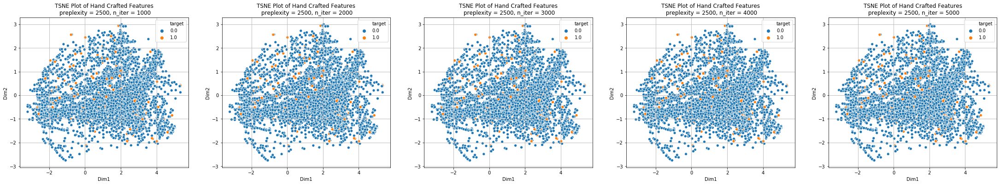

In [0]:
perplexities = [10, 50, 100, 500, 1000, 2500]
iterations = [1000, 2000, 3000, 4000, 5000]
for perp in perplexities:
    fig, axs = plt.subplots(1, len(iterations), figsize = (38, 6))
    for i, iteration in enumerate(iterations):
        model = TSNE(n_components = 2, random_state = 0, perplexity = perp, n_iter = iteration)
        tsne_data = model.fit_transform(data)
        tsne_data = np.vstack((tsne_data.T, tsne_Y.values.flatten())).T

        #https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.html
        tsne_data = pd.DataFrame(data = tsne_data, columns = ('Dim1', 'Dim2', 'target'))
        #seaborn facetgrid plot: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
        sns.scatterplot(x="Dim1", y="Dim2", hue="target", data = tsne_data, ax = axs[i])
        axs[i].grid('on')
        axs[i].set_title('TSNE Plot of Hand Crafted Features\n preplexity = {}, n_iter = {}'.format(perp, iteration))
    plt.show()

* Various combination of **n_iteration** and **perplexity** has been tried becasue **t-SNE** is probabilistic algorithm. So different models has been tried to come to some conclusion.
* As I've taken only **5k** datapoints to visualize the hand crafted features. But after looking at above plots it can be seen that these features are not going to play very important role in classification.

## **3.3 Duplicates Comments in data**

In [0]:
comment_texts = df["comment_text"].values
unique_comments = len(np.unique(comment_texts))
print("Total number of comments: {:,}".format(len(comment_texts)))
print("Number of unique comments: {:,} i.e. {:.2f}%".format(unique_comments, 100*unique_comments/len(comment_texts)))
print("Number of duplicate comments: {:,} i.e. {:.2f}%".format(len(comment_texts) - unique_comments,
                                                               100*(len(comment_texts) - unique_comments)/len(comment_texts)))

Total number of comments: 1,804,874
Number of unique comments: 1,756,631 i.e. 97.33%
Number of duplicate comments: 48,243 i.e. 2.67%


* There are around 2.67% duplicate comments. But we can not drop in this case because there is possibility that different comments with same text may have been labeled with different target or subgroup.

## **3.4 Null value in `comment_text` feature**

* There are two features which has "Null" values and these values are 

In [0]:
print("there are totat {} NaN or empty value in commet_text".format(df["comment_text"].isnull().sum()))

there are totat 0 NaN or empty value in commet_text


## **3.5 Word-Cloud Plot for data**

* Taking out the toxic and non-toxic comments from train data and then converting them into one big sentence.

In [0]:
toxic_comments = df.loc[df["target"] == 1, :]["comment_text"].values
non_toxic_comments = df.loc[df["target"] == 0, :]["comment_text"].values

### **3.4.1 For toxic comments****

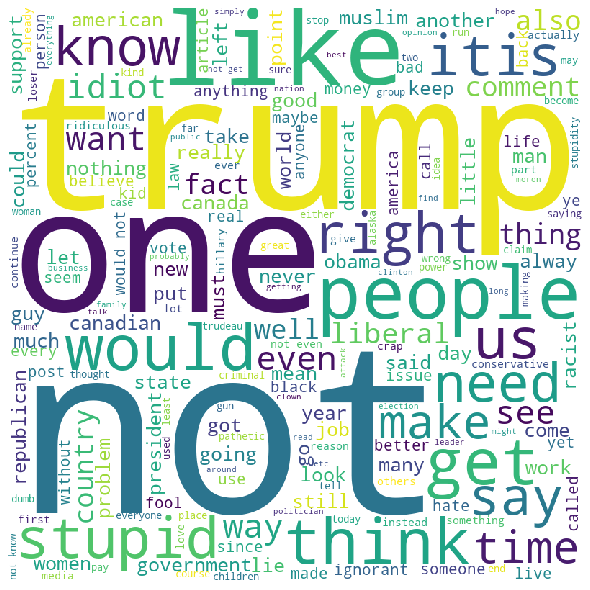

In [0]:
# https://www.geeksforgeeks.org/generating-word-cloud-python/
from wordcloud import WordCloud

big_toxic_sen = ""
big_non_toxic_sen = ""

for comment in toxic_comments:
    big_toxic_sen += comment

wordcloud = WordCloud(width = 800, height = 800, background_color ='white',
                      stopwords = stop_words, min_font_size = 10).generate(big_toxic_sen)
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)  
plt.show() 

### **3.4.2 For non-toxic commets**

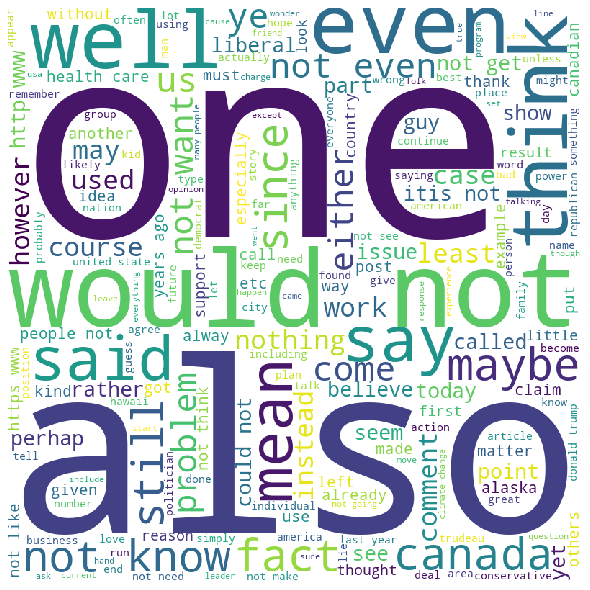

In [0]:
for comment in non_toxic_comments:
    big_non_toxic_sen += comment
    
wordcloud = WordCloud(width = 800, height = 800, background_color ='white',
                      stopwords = stop_words, min_font_size = 10).generate(big_non_toxic_sen)
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show() 

## **3.6 Distribution of `target` feature over train/CV/test dataset**

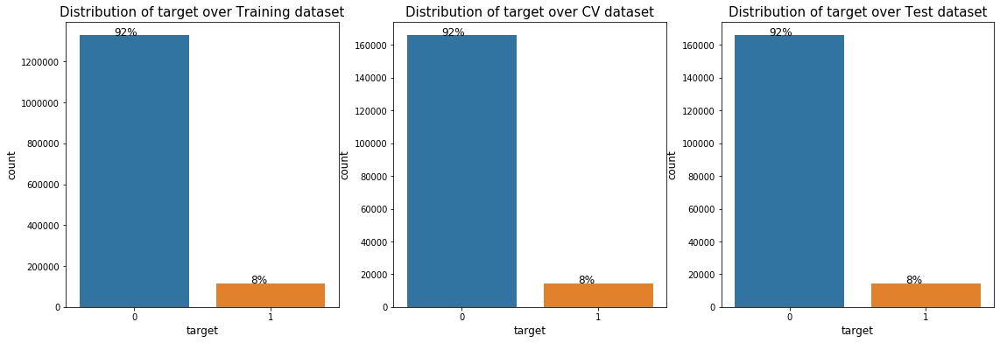

In [0]:
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize =(19,6))
    ax1.set_title('Distribution of target over Training dataset', fontsize=15)
    sns.countplot(y_train["target"], ax = ax1)
    ax1.set_xlabel("target", fontsize = 12)
    ax1.set_ylabel("count", fontsize = 12)

    ax2.set_title('Distribution of target over CV dataset', fontsize=15)
    sns.countplot(y_cv["target"], ax = ax2)
    ax2.set_xlabel("target", fontsize = 12)
    ax2.set_ylabel("count", fontsize = 12)

    ax3.set_title('Distribution of target over Test dataset', fontsize=15)
    sns.countplot(y_test["target"], ax = ax3)
    ax3.set_xlabel("target", fontsize = 12)
    ax3.set_ylabel("count", fontsize = 12)

    for ax, lenght in zip([ax1, ax2, ax3], [len(y_train), len(y_cv), len(y_test)]):
        for p in ax.patches:
            ax.annotate('{:.0f}%'.format(p.get_height()*100/lenght), 
                        (p.get_x()+0.25, p.get_height()+1), fontsize=12)
            # to chnage the annotate font size:  https://matplotlib.org/3.1.1/tutorials/text/text_intro.html

* Distribution of `target` feature is same for all three datasets (train, CV and test dataset). So the proportion of both class in `target` feature is same in train, CV and test dataset. 
* I've done the **stratified sampling** splitting that's the main reason behind this.

## **3.7 Stability of `comment_text` feature in train/CV/test dataset after splitting**

In [0]:
def return_set_words(data_frame):
    """This will return set of words"""
    corpus = data_frame["comment_text"].values
    big_text = ""
    for sen in corpus:
        big_text += sen
    return set(big_text.split())

In [0]:
train_commet_words_set = return_set_words(X_train)
cv_commet_words_set    = return_set_words(X_cv)
test_commet_words_set  = return_set_words(X_test)

In [0]:
print("There are total unique words in-\n Train: {:,}\
\n CV: {:,}\n Test: {:,}".format(len(train_commet_words_set), len(cv_commet_words_set),len(test_commet_words_set)))
print("\nNumber of common words in train and CV are: {:,}\
\n(i.e. Out of {:,} words of CV data {:,} words are in train data which is equal to {:.4f}%)\
\nThere are {:,} words of CV dataset which are not present in train data ({:.4f}%)".format(
    len(train_commet_words_set.intersection(cv_commet_words_set)),
    len(cv_commet_words_set), len(train_commet_words_set.intersection(cv_commet_words_set)),
    100*len(train_commet_words_set.intersection(cv_commet_words_set))/len(cv_commet_words_set),
    len(cv_commet_words_set - train_commet_words_set), 
    100*len(cv_commet_words_set - train_commet_words_set)/len(cv_commet_words_set)))

print("\nNumber of common words in train and TEST are: {:,}\
\n(i.e. Out of {:,} words of TEST data {:,} words are in train data which is equal to {:.4f}%)\
\nThere are {:,} words of TEST dataset which are not present in train data ({:.4f}%)".format(
    len(train_commet_words_set.intersection(test_commet_words_set)),
    len(test_commet_words_set), len(train_commet_words_set.intersection(test_commet_words_set)),
    100*len(train_commet_words_set.intersection(test_commet_words_set))/len(test_commet_words_set),
    len(test_commet_words_set - train_commet_words_set), 
    100*len(test_commet_words_set - train_commet_words_set)/len(test_commet_words_set)))

There are total unique words in-
 Train: 1,256,784
 CV: 253,251
 Test: 252,812

Number of common words in train and CV are: 131,576
(i.e. Out of 253,251 words of CV data 131,576 words are in train data which is equal to 51.9548%)
There are 121,675 words of CV dataset which are not present in train data (48.0452%)

Number of common words in train and TEST are: 131,633
(i.e. Out of 252,812 words of TEST data 131,633 words are in train data which is equal to 52.0675%)
There are 121,179 words of TEST dataset which are not present in train data (47.9325%)


**Visualize it using Venn Diagram**

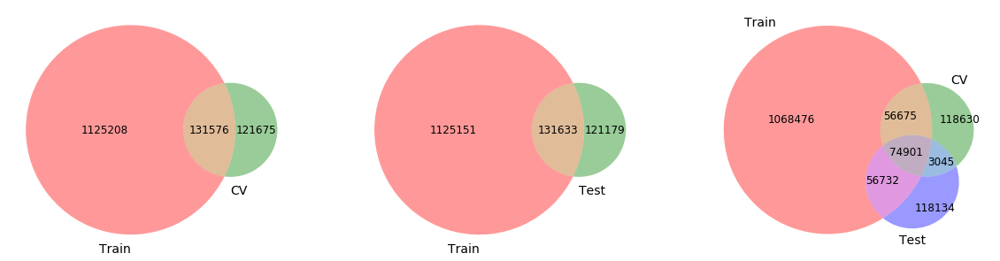

In [0]:
# https://pypi.org/project/matplotlib-venn/
from matplotlib_venn import venn3, venn2
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize = (20,7))

out1 = venn2([train_commet_words_set, cv_commet_words_set], set_labels = (['Train', 'CV']), ax = ax1)
out2 = venn2([train_commet_words_set, test_commet_words_set], set_labels = (['Train', 'Test']), ax = ax2)
out3 = venn3([train_commet_words_set, cv_commet_words_set, test_commet_words_set], set_labels = (['Train', 'CV',
'Test']), ax = ax3)

# toc chnage the font size: https://stackoverflow.com/a/29426251/12005970

for out in [out1, out2, out3]:
    for text in out.set_labels:
         text.set_fontsize(14)
    for text in out.subset_labels:
        text.set_fontsize(12)

plt.show()

* From here we can say that almost 50% of word of test/CV dataset is not present in train data.
* So for training the model, we need to conver text data into vector form and there are various methods to do it but pretrained model (i.e. **W2V**) will be better choice than **Bow** and **TF-IDF**.
* But we'll choose two vectorization method to compare the performance. One will be **W2V** and second will be selected from **Bow** and **TF-IDF** after some analyis.

# **4. Machine Learning Models**

## **4.1 Some Important Functions**

In [0]:
print("Number of datapoints in:\nTrain: {:,}\nCV: {:,}\nTest: {:,}".format(len(y_train),
                                                                           len(y_cv),
                                                                           len(y_test)))

# creating class weight dictionary
a = y_train["target"].value_counts()
cl_wt = {0: a[1], 1: a[0]}
print("\n\n",cl_wt)

subgroups    = identity_columns
actual_label = "target" 
pred_label   = "pred_target"

Number of datapoints in:
Train: 1,443,899
CV: 180,488
Test: 180,487


 {0: 115467, 1: 1328432}


### **4.1.1 For final metric**

In [0]:
from sklearn.metrics import roc_auc_score

########################################################################################
#######################     function to calculate the AUC        #######################
########################################################################################

def cal_auc(y_true, y_pred):
    "returns the auc value"
    return roc_auc_score(y_true, y_pred)

########################################################################################
#######################  function to calculate the Subgroup AUC  #######################
########################################################################################

def cal_subgroup_auc(data, subgroup, actual_label, pred_label):
    subgroup_examples = data[data[subgroup]]
    return cal_auc(subgroup_examples[actual_label], subgroup_examples[pred_label])

########################################################################################
#######################   function to calculate the BPSN AUC     #######################
########################################################################################

def cal_bpsn_auc(data, subgroup, actual_label, pred_label):
    """This will calculate the BPSN auc"""
    # subset where subgroup is True and target label is 0
    subgroup_negative_examples = data[data[subgroup] & ~data[actual_label]]

    # subset where subgroup is False and target label is 1
    background_positive_examples = data[~data[subgroup] & data[actual_label]]

    # combine above tow sets
    bpsn_examples = subgroup_negative_examples.append(background_positive_examples)

    return cal_auc(bpsn_examples[actual_label], bpsn_examples[pred_label])


########################################################################################
#######################   function to calculate the BNSP AUC     #######################
########################################################################################
def cal_bnsp_auc(data, subgroup, actual_label, pred_label):
    """This will calculate the BNSP auc"""
    # subset where subgroup is True and target label is 1
    subgroup_positive_examples = data[data[subgroup] & data[actual_label]]

    # subset where subgroup is False and target label is 0
    background_negative_examples = data[~data[subgroup] & ~data[actual_label]]

    # combine above tow sets
    bnsp_examples = subgroup_positive_examples.append(background_negative_examples)

    return cal_auc(bnsp_examples[actual_label], bnsp_examples[pred_label])

########################################################################################
#######################    function to calculate Bias metric     #######################
########################################################################################
def cal_bias_metric(data, subgroups, actual_label, pred_label):
    """Computes per-subgroup metrics for all subgroups and one model
    and returns the dataframe which will have all three Bias metrices
    and number of exmaples for each subgroup"""
    records = []
    for subgroup in subgroups:
        record = {"subgroup": subgroup, "subgroup_size": len(data[data[subgroup]])}
        record["subgroup_auc"] = cal_subgroup_auc(data, subgroup, actual_label, pred_label)
        record["bpsn_auc"]     = cal_bpsn_auc(data, subgroup, actual_label, pred_label)
        record["bnsp_auc"]     = cal_bnsp_auc(data, subgroup, actual_label, pred_label)

        records.append(record)
    submetric_df = pd.DataFrame(records).sort_values("subgroup_auc", ascending = True)

    return submetric_df

########################################################################################
#######################   function to calculate Overall metric   #######################
########################################################################################
def cal_overall_auc(data, actual_label, pred_label):
    return roc_auc_score(data[actual_label], data[pred_label])

########################################################################################
#######################    function to calculate final metric    #######################
########################################################################################
def power_mean(series, p):
    total_sum = np.sum(np.power(series, p))
    return np.power(total_sum/len(series), 1/p)

def final_metric(submetric_df, overall_auc, p = -5, w = 0.25):
    generalized_subgroup_auc = power_mean(submetric_df["subgroup_auc"], p)
    generalized_bpsn_auc = power_mean(submetric_df["bpsn_auc"], p)
    generalized_bnsp_auc = power_mean(submetric_df["bnsp_auc"], p)
    
    overall_metric = w*overall_auc + w*(generalized_subgroup_auc
                                        + generalized_bpsn_auc
                                        + generalized_bnsp_auc)
    return overall_metric


########################################################################################
#######################   function all above function into one   #######################
########################################################################################

def return_final_metric(data, subgroups,actual_label, pred_label, verbose = False):
    """Data is dataframe which include whole data 
    and it also has the predicted target column"""
    submetric_df = cal_bias_metric(data, subgroups, actual_label, pred_label)

    if verbose:
        print("printing the submetric table for each identity or subgroup")
        print(submetric_df)

    overall_auc =  cal_overall_auc(data, actual_label, pred_label)
    overall_metric = final_metric(submetric_df, overall_auc, p = -5, w = 0.25)

    return overall_metric, submetric_df

> **Credit:** https://www.kaggle.com/dborkan/benchmark-kernel

### **4.1.2 For Confusion Matrix & AUC Plot**

**Confusion Matrix**

In [0]:
from sklearn.metrics import confusion_matrix

########################################################################################
#######################    function to plot Confusion matrix     #######################
########################################################################################
def plot_confusion_matrix(train, cv, test):
    tr_pred = np.where(train["pred_target"] >= 0.5, 1, 0)
    cv_pred = np.where(cv["pred_target"] >= 0.5, 1, 0)
    te_pred = np.where(test["pred_target"] >= 0.5, 1, 0)   

    tr_con_mat = confusion_matrix(train["target"], tr_pred)
    cv_con_mat = confusion_matrix(cv["target"], cv_pred)
    te_con_mat = confusion_matrix(test["target"], te_pred)

    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(19,4))
    sns.heatmap(tr_con_mat, annot=True, fmt="d", annot_kws={"size":15}, ax = ax1)
    ax1.set_title("For Train data", fontsize = 15)
    ax1.set_xlabel("Pridicted target", fontsize = 12)
    ax1.set_ylabel("Actual target", fontsize = 12)

    sns.heatmap(cv_con_mat, annot=True, fmt="d", annot_kws={"size":15}, ax = ax2)
    ax2.set_title("For CV data", fontsize = 15)
    ax2.set_xlabel("Pridicted target", fontsize = 12)
    ax2.set_ylabel("Actual target", fontsize = 12)
    
    sns.heatmap(te_con_mat, annot=True, fmt="d", annot_kws={"size":15}, ax = ax3)
    ax3.set_title("For Test data", fontsize = 15)
    ax3.set_xlabel("Pridicted target", fontsize = 12)
    ax3.set_ylabel("Actual target", fontsize = 12)

    plt.show()

########################################################################################
##############    function to plot Confusion matrix for each identity   ################
########################################################################################
def plot_confusion_for_each_identity(train, cv, test, subgroups):
    for subgroup in subgroups:
        print("{}{} for '{}' identity {}".format(" "*40, "*"*15, subgroup, "*"*15))
        TR, CV, TE = train[train[subgroup]], cv[cv[subgroup]], test[test[subgroup]]
        plot_confusion_matrix(TR, CV, TE)
        print("\n\n")

**AUC Plot**

In [0]:
def plot_auc(params, train_auc, cv_auc, hyp_name):
    plt.figure(figsize = (12,8))
    plt.plot(params, train_auc, "bo-", label = "Train")
    plt.plot(params, cv_auc, "ro-", label = "CV")
    plt.title("Final Metric (AUC) Plot", fontsize = 18)
    plt.xlabel("Hyperparameter '{}'".format(hyp_name), fontsize = 14)
    plt.ylabel("Modified AUC (Final Metric)", fontsize = 14)
    plt.legend(fontsize = 14)
    plt.grid(1)
    plt.show()

### **4.1.3 Tunning Function**

#### **4.1.3.1 Logistic Regression**

In [0]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html

########################################################################################################
############################  function to tune the logistic regression #################################
########################################################################################################

def tune_log_reg(tr_df, cv_df, train_x, train_y, CV_x, 
                 subgroups, actual_label, pred_label):
    print("Tunning the parameter...")
    params = [10**i for i in range(-8, 4)]
    tic = time.time()
    train_auc = [] 
    cv_auc    = []
    for param in params:
        log_reg_sgd = SGDClassifier(loss = "log", penalty="l2", alpha = param,
                                    class_weight = cl_wt, random_state = 42)
        log_reg_sgd.fit(train_x, train_y)

        tr_df["pred_target"] = log_reg_sgd.predict(train_x)
        cv_df["pred_target"] = log_reg_sgd.predict(CV_x)

        final_train_auc, _ = return_final_metric(tr_df, subgroups, actual_label, pred_label, verbose = False)
        final_cv_auc, _ = return_final_metric(cv_df, subgroups, actual_label, pred_label, verbose = False)

        train_auc.append(final_train_auc)
        cv_auc.append(final_cv_auc)

    print("Tunning Done!\nTime taken to tune: {:,}".format(time.time()-tic))

    best_param = params[np.argmax(cv_auc)]
    print("best value of hyper parameter 'alpha' = {}.\n".format(best_param))
    plot_auc(np.log10(params), train_auc, cv_auc, hyp_name = 'np.log10(alpha)')

    best_model = SGDClassifier(loss = "log", penalty="l2", alpha = best_param,
                               class_weight = cl_wt, random_state = 42)

    return best_model

#### **4.1.3.2 Decision Tree**

In [0]:
# https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

########################################################################################################
############################  function to tune the logistic regression #################################
########################################################################################################

def tune_DT(tr_df, cv_df, train_x, train_y, CV_x, 
                 subgroups, actual_label, pred_label):  
    print("Tunning the parameter...")
    depths = [4, 8, 10, 15, 25, 50, 75, 100]
    tic = time.time()
    train_auc = [] 
    cv_auc    = []
    for depth in depths:
        dt_clf = DecisionTreeClassifier(criterion = "gini", 
                                        max_depth = depth, 
                                        class_weight = cl_wt,
                                        random_state = 42)
        dt_clf.fit(train_x, train_y)

        tr_df["pred_target"] = dt_clf.predict(train_x)
        cv_df["pred_target"] = dt_clf.predict(CV_x)

        final_train_auc, _ = return_final_metric(tr_df, subgroups, actual_label, pred_label, verbose = False)
        final_cv_auc, _ = return_final_metric(cv_df, subgroups, actual_label, pred_label, verbose = False)

        train_auc.append(final_train_auc)
        cv_auc.append(final_cv_auc)

    print("Tunning Done!\nTime taken to tune: {:,}".format(time.time()-tic))

    best_depth = depths[np.argmax(cv_auc)]
    print("best value of hyper parameter max_depth = {}.\n".format(best_depth))
    plot_auc(depths, train_auc, cv_auc, hyp_name = 'max_depth')

    best_model = DecisionTreeClassifier(criterion = "gini", 
                                        max_depth = best_depth, 
                                        class_weight = cl_wt,
                                        random_state = 42)

    return best_model

#### **4.1.3.3 GBDT**

* Using **Lightgbm library** for GBDT because with **XGBoost** it is taking too much time.
* For **Lightgbm** large dataset is required (to avoid overfitting) and our dataset is quite big.

In [0]:
# https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMClassifier.html#lightgbm-lgbmclassifier

########################################################################################################
############################          function to tune the GBDT        #################################
########################################################################################################

def tune_GBDT(tr_df, cv_df, train_x, train_y, CV_x,
                 subgroups, actual_label, pred_label):

    record_final_auc_cv = {}

    start = time.time()
    print('Tunning the parameters...')

    for depth in [2, 5, 8, 10, 15, 25, 50]:
        print("\n")
        for estimator in [50, 100, 200, 400, 500, 800, 1000]:
            gbdt_clf   = LGBMClassifier(boosting_type = "gbdt",
                                        max_depth = depth,
                                        n_estimators = estimator,
                                        learning_rate = 0.1,
                                        class_weight = cl_wt,
                                        random_state = 42, n_jobs = -1)
            gbdt_clf.fit(train_x, train_y)

            # prediting values
            tr_df["pred_target"] = gbdt_clf.predict(train_x)
            cv_df["pred_target"] = gbdt_clf.predict(CV_x)

            final_train_auc, _ = return_final_metric(tr_df, subgroups, actual_label, pred_label, verbose = False)
            final_cv_auc, _ = return_final_metric(cv_df, subgroups, actual_label, pred_label, verbose = False)
            print("Tunning for depth = {} and n_estimators = {},\
             final train AUC = {:.5f} and CV AUC = {:.5f}".format(depth, estimator, final_train_auc, final_cv_auc))
            record_final_auc_cv[(depth, estimator)]  = final_cv_auc


    print("Done!\nTime take to tune the hyper-parameters: {:.4f} seconds.\n".format(time.time()-start))

    best_parameters = max(record_final_auc_cv)
    print("Best parameters of tunned model is:\nmax_depth = {}\
     and n_estimators = {}".format(best_parameters[0], best_parameters[1]))
    print("\nBest Final AUC score of tunned model is: {:.4f}\n".format(record_final_auc_cv[best_parameters]))

    best_model = LGBMClassifier(boosting_type = "gbdt",
                                max_depth = best_parameters[0],
                                n_estimators = best_parameters[1],
                                learning_rate = 0.1,
                                class_weight = cl_wt,
                                random_state = 42, n_jobs = -1)
    print("Best model is:\n", best_model)
    return best_model


#### **4.1.3.4 Random Forest**

**Note:** 
* I'm using RandomizedSearchCV to tune the hyperparameters of Random Forest and GBDT model. In scoring option instead if using final metric of this case study, I'm going to use the overall AUC (`roc_auc`).
* RandomizedSearchCV and GridSearchCV use internal splitting of train data to validate the results (**cross-fold**, CV=3). So, I'll not be using the our CV dataset in this case.
* RandomizedSearchCV is much faster than brute-search and often yield same good result.

> https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html

In [0]:
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

########################################################################################################
############################     function to tune the Random Forest    #################################
########################################################################################################

def tune_RF(train_x, train_y):
    params = {"n_estimators":[25, 50, 100, 200, 300, 500, 1000],
            "max_depth": [2, 6, 10, 15, 20, 25, 50]}

    rf_clf   = RandomForestClassifier(n_jobs = -1, class_weight = cl_wt, random_state = 42)
    rf_model = RandomizedSearchCV(rf_clf, params,cv = 3, scoring = "roc_auc", n_jobs = -1)
    start = time.time()
    print('Tunning the parameters...')
    rf_model.fit(train_x, train_y)
    print("Done!\nTime take to tune the parameter: {:.4f} seconds.\n".format(time.time()-start))

    print("Best parameters of tunned model is:\n", rf_model.best_params_)
    print("\nBest score of of tunned model is: {}\n".format(rf_model.best_score_))

    best_model = rf_model.best_estimator_
    print("Best model is:\n", best_model)
    return best_model

### **4.1.4 Model Train & Report Function**

In [0]:
########################################################################################################
############################      function to train the best model     #################################
########################################################################################################

def return_best_model(tr_df, cv_df, train_x, train_y, CV_x, 
                      subgroups, actual_label, pred_label, model_name, path, gram):
    """retruns trained model and save it given path"""
    if model_name == "log_reg":
        best_model = tune_log_reg(tr_df, cv_df, train_x, train_y, CV_x, subgroups, actual_label, pred_label)
    elif model_name == "DT":
        best_model = tune_DT(tr_df, cv_df, train_x, train_y, CV_x, subgroups, actual_label, pred_label)
    elif model_name == "RF":
        best_model = tune_RF(train_x, train_y)
    elif model_name == "GBDT":
        # it accepts training data as float32 or float64 only.
        #so don't give it integers value
        train_x = train_x.astype("float64")
        CV_x = CV_x.astype("float64")
        best_model = tune_GBDT(tr_df, cv_df, train_x, train_y, CV_x, subgroups, actual_label, pred_label)

    print("\n\nTraining the best model...")
    best_model.fit(train_x, train_y)

    file = path + model_name+str(gram) + ".pkl"
    print("Saving the model in path...")
    with open(file, 'wb') as f:
        pickle.dump(best_model, f)

    return best_model

########################################################################################################
############################     function to report the best model     #################################
########################################################################################################

def report_model1(model, tr_df, cv_df, te_df, train_x, cv_x, test_x,
                 subgroups, actual_label, pred_label, CV_bool = True, batch_size = 8192):
    tr_df["pred_target"] = model.predict(train_x, batch_size = batch_size, verbose=1)
    cv_df["pred_target"]  = model.predict(cv_x, batch_size = batch_size, verbose=1)
    te_df["pred_target"]  = model.predict(test_x, batch_size = batch_size, verbose=1)

    final_train_auc, _ = return_final_metric(tr_df, subgroups, actual_label, pred_label, verbose = False)
    final_cv_auc, _ = return_final_metric(cv_df, subgroups, actual_label, pred_label, verbose = False)
    final_test_auc, _ = return_final_metric(te_df, subgroups, actual_label, pred_label, verbose = False)

    print("Final metric for:\nTrain: {:.5f}\nCV: {:.5f}\nTest: {:.5f}".format(final_train_auc,
                                                                              final_cv_auc,
                                                                              final_test_auc))
    print("\n\nPloting Confusion matrix for whole data....\n")
    plot_confusion_matrix(tr_df, cv_df, te_df)
    
    print("\n\nPlotting confusion matrix indentity-wise ...\n")
    plot_confusion_for_each_identity(tr_df, cv_df, te_df, subgroups)

    return final_train_auc, final_cv_auc, final_test_auc

########################################################################################################
############################     function to report the best model     #################################
########################################################################################################

def report_model(model, tr_df, cv_df, te_df, train_x, cv_x, test_x,
                 subgroups, actual_label, pred_label, CV_bool = True):
    tr_df["pred_target"] = model.predict(train_x)
    cv_df["pred_target"]  = model.predict(cv_x)
    te_df["pred_target"]  = model.predict(test_x)

    final_train_auc, _ = return_final_metric(tr_df, subgroups, actual_label, pred_label, verbose = False)
    final_cv_auc, _ = return_final_metric(cv_df, subgroups, actual_label, pred_label, verbose = False)
    final_test_auc, _ = return_final_metric(te_df, subgroups, actual_label, pred_label, verbose = False)

    print("Final metric for:\nTrain: {:.5f}\nCV: {:.5f}\nTest: {:.5f}".format(final_train_auc,
                                                                              final_cv_auc,
                                                                              final_test_auc))
    print("\n\nPloting Confusion matrix for whole data....\n")
    plot_confusion_matrix(tr_df, cv_df, te_df)
    
    print("\n\nPlotting confusion matrix indentity-wise ...\n")
    plot_confusion_for_each_identity(tr_df, cv_df, te_df, subgroups)

    return final_train_auc, final_cv_auc, final_test_auc

## **4.2 Base-Linear/Random Model**

* This is a random model and it'll be used to compare the performance of all models.
* For a random model AUC value will be close **0.5**. So any reasonale model will have final metric greater than 0.5.

In [0]:
# https://docs.scipy.org/doc/numpy-1.14.1/reference/generated/numpy.random.rand.html#numpy.random.rand
# random target label prediction for all three dataset

# for trian data
X_train["pred_target"] = np.random.rand(len(y_train),1)
final_train_auc, _ = return_final_metric(X_train, subgroups, actual_label, pred_label, verbose = False)

# for CV data
X_cv["pred_target"] = np.random.rand(len(y_cv),1)
final_cv_auc, _ = return_final_metric(X_cv, subgroups, actual_label, pred_label, verbose = False)

# for test data
X_test["pred_target"] = np.random.rand(len(y_test),1)
final_test_auc, _ = return_final_metric(X_test, subgroups, actual_label, pred_label, verbose = False)

print("Final metric for:\nTrain: {:.5f}\nCV: {:.5f}\nTest: {:.5f}".format(final_train_auc,
                                                               final_cv_auc,
                                                               final_test_auc))

Final metric for:
Train: 0.49801
CV: 0.48911
Test: 0.49920


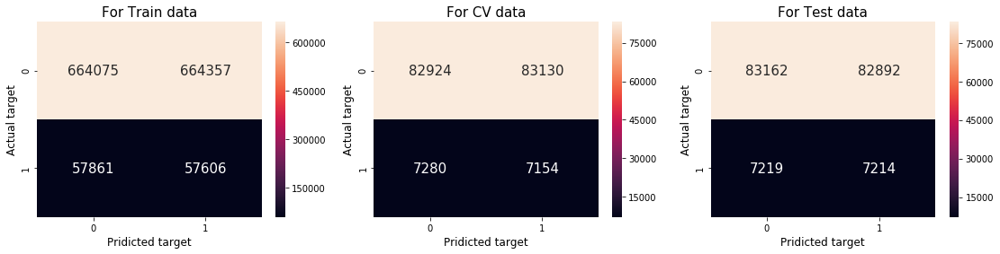

In [0]:
plot_confusion_matrix(X_train, X_cv, X_test)

                                        *************** for 'male' identity ***************


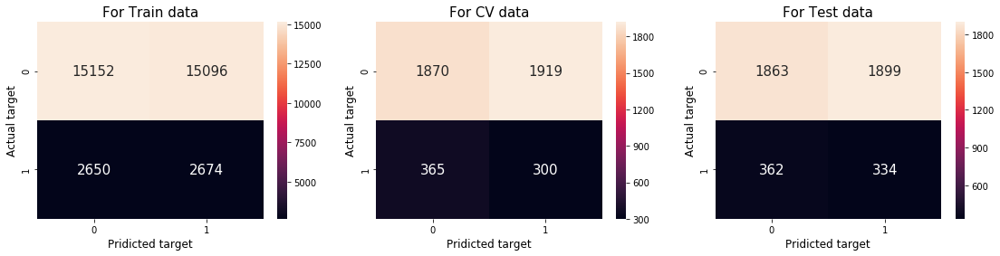




                                        *************** for 'female' identity ***************


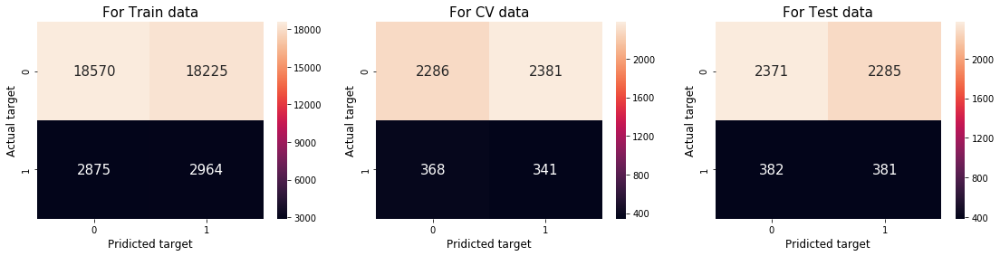




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


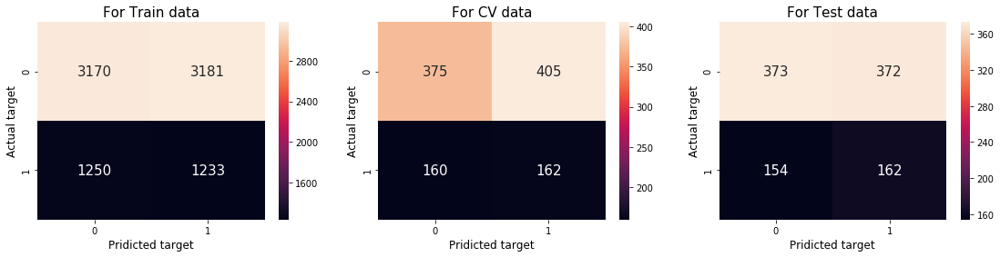




                                        *************** for 'christian' identity ***************


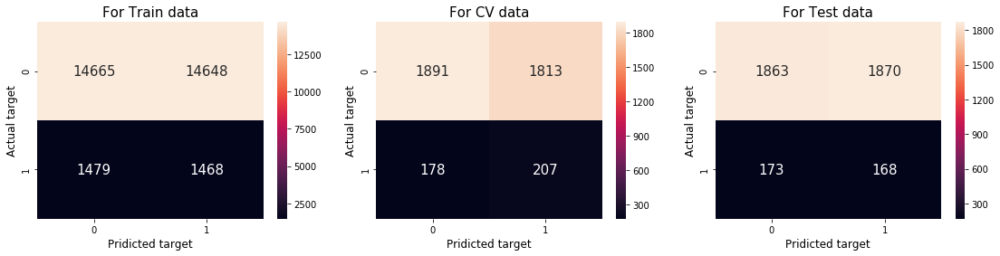




                                        *************** for 'jewish' identity ***************


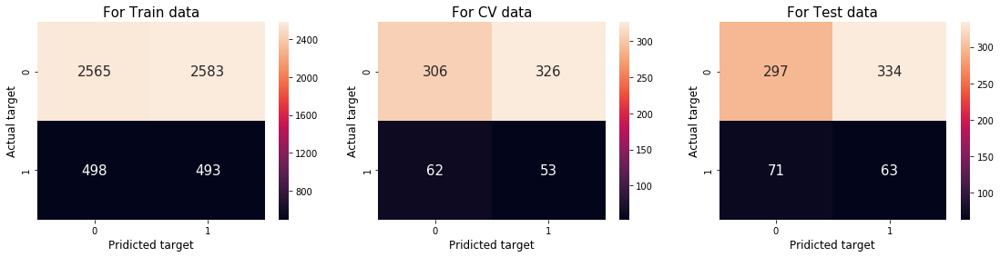




                                        *************** for 'muslim' identity ***************


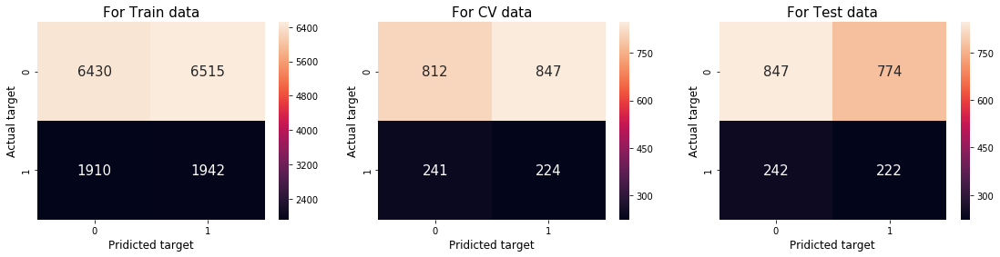




                                        *************** for 'black' identity ***************


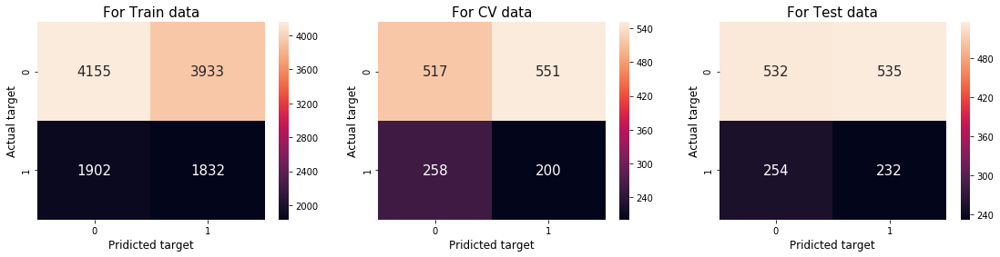




                                        *************** for 'white' identity ***************


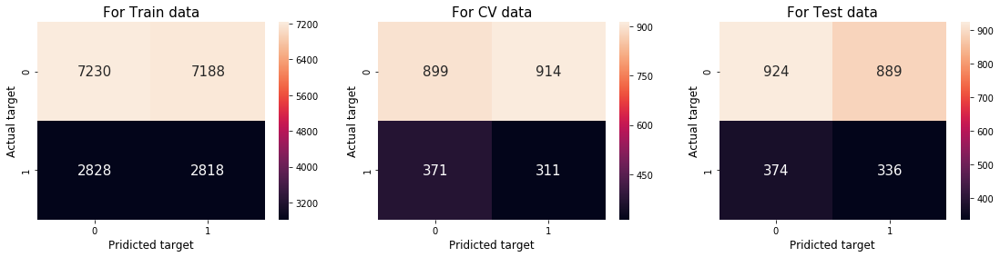




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


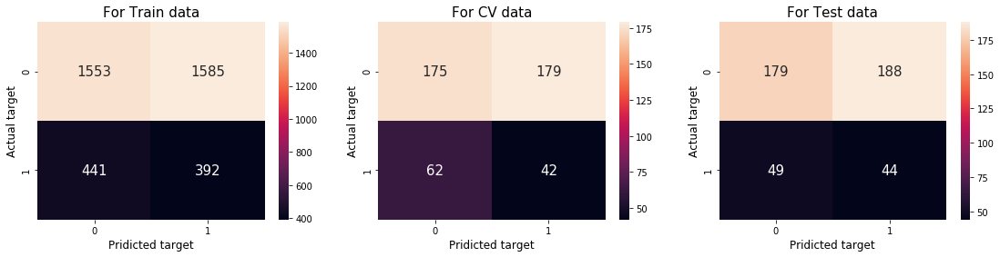

In [0]:
plot_confusion_for_each_identity(X_train, X_cv, X_test, subgroups)

## **4.3 Vectorizer Selction & Vectorization** 

### **4.3.1 Vectorizer Selection**

* In this section I'll decide which two vectorization will be used for model training.
* I'm trainng Logistric Regression with **BoW** and **TF-IDF**.
* I'll use uni-gram and bi-gram for **BoW & TF-IDF**.
* Here, I'm deciding which vectorization method can be used for other models, so I'm taking a sample of data to train. I'll take only **250k** (much less than whole train data and greater than CV and test data).

In [0]:
# sample 250k datapoints from train data and 50k datapoints from CV and test data.
# use train_test_split for this
sample_x_train, _, smaple_y_train, _ = model_selection.train_test_split(X_train, y_train,
                                                                        train_size = 250000/len(X_train),
                                                                        stratify = y_train)
print("Number of datapoints in sampled train data: {:,}".format(sample_x_train.shape[0]))

Number of datapoints in sampled train data: 250,000


In [0]:
vectorizer_table =  PrettyTable()
vectorizer_table.field_names = ["Vectoirzer", "n-gram", "train metric (AUC)",
                               "CV metric (AUC)", "test metric (AUC)"]

#### **4.3.1.1 BoW**

> https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

##### **4.3.1.1.1 Uni-gram**

In [0]:
bow_vectorizer = CountVectorizer(min_df = 1, max_features = 10000)
bow_train = bow_vectorizer.fit_transform(sample_x_train["comment_text"].values)
bow_cv = bow_vectorizer.transform(X_cv["comment_text"].values) 
bow_test = bow_vectorizer.transform(X_test["comment_text"].values)

print("Shape of featurized\nTrain data: {}\nCV data: {}\nTest data: {}\n".format(bow_train.shape,
                                                                               bow_cv.shape,
                                                                               bow_test.shape))
# training the model
tic = time.time()
print("Training the model...")
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
log_reg = SGDClassifier(loss = "log")
log_reg.fit(bow_train, smaple_y_train)
print("Done!\nTime taken to train the model: {:.4f} seconds.\n".format(time.time() - tic))

# prediction
sample_x_train["pred_target"] = log_reg.predict(bow_train)
X_cv["pred_target"] = log_reg.predict(bow_cv)
X_test["pred_target"] = log_reg.predict(bow_test)

# Evaluation
final_train_auc, _ = return_final_metric(sample_x_train, subgroups, actual_label, pred_label, verbose = False)
final_cv_auc, _ = return_final_metric(X_cv, subgroups, actual_label, pred_label, verbose = False)
final_test_auc, _ = return_final_metric(X_test, subgroups, actual_label, pred_label, verbose = False)

print("Final metric for:\nTrain: {:.5f}\nCV: {:.5f}\nTest: {:.5f}".format(final_train_auc,
                                                               final_cv_auc,
                                                               final_test_auc))

vectorizer_table.add_row(["BoW", "uni-gram", final_train_auc, final_cv_auc, final_test_auc])
print("\nTotal time taken to run this cell: {:.4f} seconds".format(time.time() - tic))

Shape of featurized
Train data: (250000, 10000)
CV data: (180488, 10000)
Test data: (180487, 10000)

Training the model...
Done!
Time taken to train the model: 1.2219 seconds.

Final metric for:
Train: 0.64592
CV: 0.63042
Test: 0.63276

Total time taken to run this cell: 4.2439 seconds


##### **4.3.1.1.2 Bi-gram**

In [0]:
bow_vectorizer = CountVectorizer(ngram_range = (1,2), min_df = 1, max_features = 10000)
bow_vectorizer.fit(sample_x_train["comment_text"].values)
bow_train = bow_vectorizer.fit_transform(sample_x_train["comment_text"].values)
bow_cv = bow_vectorizer.transform(X_cv["comment_text"].values) 
bow_test = bow_vectorizer.transform(X_test["comment_text"].values)

print("Shape of featurized\nTrain data: {}\nCV data: {}\nTest data: {}".format(bow_train.shape,
                                                                               bow_cv.shape,
                                                                               bow_test.shape))
#training the model
tic = time.time()
log_reg = SGDClassifier(loss = "log")
print("\nTraning the model..")
log_reg.fit(bow_train, smaple_y_train)
print("Done!\nTime taken to trian the model: {:.4f} seconds\n".format(time.time() - tic))

#predicton
sample_x_train["pred_target"] = log_reg.predict(bow_train)
X_cv["pred_target"] = log_reg.predict(bow_cv)
X_test["pred_target"] = log_reg.predict(bow_test)

# Evaluation
final_train_auc, _ = return_final_metric(sample_x_train, subgroups, actual_label, pred_label, verbose = False)
final_cv_auc, _ = return_final_metric(X_cv, subgroups, actual_label, pred_label, verbose = False)
final_test_auc, _ = return_final_metric(X_test, subgroups, actual_label, pred_label, verbose = False)

print("Final metric for:\nTrain: {:.5f}\nCV: {:.5f}\nTest: {:.5f}".format(final_train_auc,
                                                               final_cv_auc,
                                                               final_test_auc))

vectorizer_table.add_row(["BoW", "bi-gram", final_train_auc, final_cv_auc, final_test_auc])

Shape of featurized
Train data: (250000, 10000)
CV data: (180488, 10000)
Test data: (180487, 10000)

Traning the model..
Done!
Time taken to trian the model: 1.2684 seconds

Final metric for:
Train: 0.64705
CV: 0.63104
Test: 0.63460


#### **4.3.1.2 TF-IDF**

>https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html#sklearn-feature-extraction-text-tfidfvectorizer

##### **4.3.1.2.1 Uni-gram**

In [0]:
tfidf_vectorizer = TfidfVectorizer(min_df = 1, max_features = 10000)
tfidf_vectorizer.fit(sample_x_train["comment_text"].values)
tfidf_train = tfidf_vectorizer.fit_transform(sample_x_train["comment_text"].values)
tfidf_cv = tfidf_vectorizer.transform(X_cv["comment_text"].values) 
tfidf_test = tfidf_vectorizer.transform(X_test["comment_text"].values)

print("Shape of featurized\nTrain data: {}\nCV data: {}\nTest data: {}\n".format(tfidf_train.shape,
                                                                               tfidf_cv.shape,
                                                                               tfidf_test.shape))
# training the model
tic = time.time()
print("Training the model...")
log_reg = SGDClassifier(loss = "log")
log_reg.fit(tfidf_train, smaple_y_train)
print("Done!\nTime taken to train the model: {:.4f} seconds.\n".format(time.time() - tic))

# prediction
sample_x_train["pred_target"] = log_reg.predict(tfidf_train)
X_cv["pred_target"] = log_reg.predict(tfidf_cv)
X_test["pred_target"] = log_reg.predict(tfidf_test)

# Evaluation
final_train_auc, _ = return_final_metric(sample_x_train, subgroups, actual_label, pred_label, verbose = False)
final_cv_auc, _ = return_final_metric(X_cv, subgroups, actual_label, pred_label, verbose = False)
final_test_auc, _ = return_final_metric(X_test, subgroups, actual_label, pred_label, verbose = False)

print("Final metric for:\nTrain: {:.5f}\nCV: {:.5f}\nTest: {:.5f}".format(final_train_auc,
                                                               final_cv_auc,
                                                               final_test_auc))

vectorizer_table.add_row(["tfidf", "uni-gram", final_train_auc, final_cv_auc, final_test_auc])
print("\nTotal time taken to run this cell: {:.4f} seconds".format(time.time() - tic))

Shape of featurized
Train data: (250000, 10000)
CV data: (180488, 10000)
Test data: (180487, 10000)

Training the model...
Done!
Time taken to train the model: 0.8147 seconds.

Final metric for:
Train: 0.51453
CV: 0.51464
Test: 0.51589

Total time taken to run this cell: 3.6817 seconds


##### **4.3.1.2.2 Bi-gram**

In [0]:
tfidf_vectorizer = TfidfVectorizer(ngram_range = (1,2), min_df = 1, max_features = 10000)
tfidf_vectorizer.fit(sample_x_train["comment_text"].values)
tfidf_train = tfidf_vectorizer.fit_transform(sample_x_train["comment_text"].values)
tfidf_cv = tfidf_vectorizer.transform(X_cv["comment_text"].values) 
tfidf_test = tfidf_vectorizer.transform(X_test["comment_text"].values)

print("Shape of featurized\nTrain data: {}\nCV data: {}\nTest data: {}".format(tfidf_train.shape,
                                                                               tfidf_cv.shape,
                                                                               tfidf_test.shape))
#training the model
tic = time.time()
log_reg = SGDClassifier(loss = "log")
print("\nTraning the model..")
log_reg.fit(tfidf_train, smaple_y_train)
print("Done!\nTime taken to trian the model: {:.4f} seconds\n".format(time.time() - tic))

#predicton
sample_x_train["pred_target"] = log_reg.predict(tfidf_train)
X_cv["pred_target"] = log_reg.predict(tfidf_cv)
X_test["pred_target"] = log_reg.predict(tfidf_test)

# Evaluation
final_train_auc, _ = return_final_metric(sample_x_train, subgroups, actual_label, pred_label, verbose = False)
final_cv_auc, _ = return_final_metric(X_cv, subgroups, actual_label, pred_label, verbose = False)
final_test_auc, _ = return_final_metric(X_test, subgroups, actual_label, pred_label, verbose = False)

print("Final metric for:\nTrain: {:.5f}\nCV: {:.5f}\nTest: {:.5f}".format(final_train_auc,
                                                               final_cv_auc,
                                                               final_test_auc))

vectorizer_table.add_row(["tfidf", "bi-gram", final_train_auc, final_cv_auc, final_test_auc])

Shape of featurized
Train data: (250000, 10000)
CV data: (180488, 10000)
Test data: (180487, 10000)

Traning the model..
Done!
Time taken to trian the model: 0.8504 seconds

Final metric for:
Train: 0.51291
CV: 0.51322
Test: 0.51483


**Vectorization Selection**

In [0]:
print(vectorizer_table)

+------------+----------+--------------------+--------------------+--------------------+
| Vectoirzer |  n-gram  | train metric (AUC) |  CV metric (AUC)   | test metric (AUC)  |
+------------+----------+--------------------+--------------------+--------------------+
|    BoW     | uni-gram | 0.6459154301713715 | 0.630415484294899  | 0.6327642771807498 |
|    BoW     | bi-gram  | 0.647054649321607  | 0.6310365406348617 | 0.6345957265700635 |
|   tfidf    | uni-gram | 0.5145335528626117 | 0.5146434157951665 | 0.5158885728097784 |
|   tfidf    | bi-gram  | 0.5129062976854873 | 0.5132181614353201 | 0.5148331117470422 |
+------------+----------+--------------------+--------------------+--------------------+


* From above model we can see that **BoW** is perfroming better than **TF-IDF**.
* So I'll train my models with **BoW** (**uni-gram & bi-gram**) and **avg-W2V**.

### **4.3.2 Vectorization**

* **Vectorize the `comment_text` feature**

#### **4.3.2.1 BoW** 

##### **4.3.2.1.1 Uni-gram**

In [0]:
processed_data_path = "/content/drive/My Drive/Colab Notebooks/\
Datasets/Personal Case Study/Jigsaw Unintended Bias in Toxicity Classification/Dataset/Processed Dataset/"

In [0]:
if os.path.isfile(processed_data_path+"BoW/uni_bow_train.pkl"):
    print("loading data from dirve...")
    with open(processed_data_path+ "BoW/" + "uni_bow_train.pkl", "rb") as f:
        uni_bow_train = pickle.load(f)
    with open(processed_data_path+ "BoW/" + "uni_bow_cv.pkl", "rb") as f:
        uni_bow_cv = pickle.load(f)
    with open(processed_data_path+ "BoW/" + "uni_bow_test.pkl", "rb") as f:
        uni_bow_test = pickle.load(f)
else:
    print("Processed data in not in disk. So let's make this...")

    uni_bow_vectorizer = CountVectorizer(min_df = 1, max_features = 10000)
    uni_bow_train = uni_bow_vectorizer.fit_transform(X_train["comment_text"].values)
    uni_bow_cv = uni_bow_vectorizer.transform(X_cv["comment_text"].values) 
    uni_bow_test = uni_bow_vectorizer.transform(X_test["comment_text"].values)

    print("saving the files...")

    with open(processed_data_path+ "BoW/" + "uni_bow_train.pkl", "wb") as f:
        pickle.dump(uni_bow_train, f)
    with open(processed_data_path+ "BoW/" + "uni_bow_cv.pkl", "wb") as f:
        pickle.dump(uni_bow_cv, f)
    with open(processed_data_path+ "BoW/" + "uni_bow_test.pkl", "wb") as f:
        pickle.dump(uni_bow_test, f)

print("Shape of featurized\nTrain data: {}\nCV data: {}\nTest data: {}\n".format(uni_bow_train.shape,
                                                                               uni_bow_cv.shape,
                                                                               uni_bow_test.shape))

loading data from dirve...
Shape of featurized
Train data: (1443899, 10000)
CV data: (180488, 10000)
Test data: (180487, 10000)



##### **4.3.2.1.2 Bi-gram**

In [0]:
if os.path.isfile(processed_data_path+"BoW/bi_bow_train.pkl"):
    print("loading data from dirve...")
    with open(processed_data_path+ "BoW/" + "bi_bow_train.pkl", "rb") as f:
        bi_bow_train = pickle.load(f)
    with open(processed_data_path+ "BoW/" + "bi_bow_cv.pkl", "rb") as f:
        bi_bow_cv = pickle.load(f)
    with open(processed_data_path+ "BoW/" + "bi_bow_test.pkl", "rb") as f:
        bi_bow_test = pickle.load(f)
else:
    print("Vectorize data in not in disk. Let's make it...")
    bi_bow_vectorizer = CountVectorizer(ngram_range=(1,2), min_df = 1, max_features = 10000)
    bi_bow_train = bi_bow_vectorizer.fit_transform(X_train["comment_text"].values)
    bi_bow_cv = bi_bow_vectorizer.transform(X_cv["comment_text"].values) 
    bi_bow_test = bi_bow_vectorizer.transform(X_test["comment_text"].values)

    # saving the files:
    with open(processed_data_path+ "BoW/" + "bi_bow_train.pkl", "wb") as f:
        pickle.dump(bi_bow_train, f)
    with open(processed_data_path+ "BoW/" + "bi_bow_cv.pkl", "wb") as f:
        pickle.dump(bi_bow_cv, f)
    with open(processed_data_path+ "BoW/" + "bi_bow_test.pkl", "wb") as f:
        pickle.dump(bi_bow_test, f)

print("Shape of featurized\nTrain data: {}\nCV data: {}\nTest data: {}\n".format(bi_bow_train.shape,
                                                                               bi_bow_cv.shape,
                                                                               bi_bow_test.shape))

loading data from dirve...
Shape of featurized
Train data: (1443899, 10000)
CV data: (180488, 10000)
Test data: (180487, 10000)



#### **4.3.2.2 W2V (pre-trained model)**

> https://nlp.stanford.edu/projects/glove/

> This pre-trained model can be downloaded from this [link](http://nlp.stanford.edu/data/glove.6B.zip).

* There are 25, 50, 100 and 200 dimensional representation of each word and I'll use 200-demensional model only.

In [19]:
# https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
file_name = "/content/drive/My Drive/Colab Notebooks/Datasets/Personal Case Study/Glove Vector/glove.6B.200d.txt"
print("Loading the W2V model...")
tic = time.time()
with open(file_name, 'r') as f:
    w2v_loaded_dict = {}
    for line in f:
        values = line.split()
        word = values[0]
        vector = [float(i) for i in values[1:]]
        w2v_loaded_dict[word] = vector

glove_words = w2v_loaded_dict.keys()
print("Done!\nTime taken to laod the mdoel: {:.4f} seconds".format(time.time() - tic))
print("\n{:,} words loaded from the model.".format(len(w2v_loaded_dict)))

Loading the W2V model...
Done!
Time taken to laod the mdoel: 24.2244 seconds

400,000 words loaded from the model.


**Avg-W2V**

In [0]:
def w2v_vectorization(corpus, glove_words_list):
    vectorized_data = []
    count_word = 0
    for sen in corpus:
        vector = np.zeros(200) #loading 50-dimensional data
        for word in sen.split():
            if word in glove_words_list:
                vector += w2v_loaded_dict[word]
                count_word += 1
            if count_word != 0:
                vector /= count_word
        vectorized_data.append(vector)
    vectorized_data = np.array(vectorized_data)
    return vectorized_data

In [0]:
if os.path.isfile(processed_data_path + "W2V/" + "w2v_x_train.pkl"):
    print("loading data from dirve...")
    with open(processed_data_path+ "W2V/" + "w2v_x_train.pkl", "rb") as f:
        w2v_x_train = pickle.load(f)
    with open(processed_data_path+ "W2V/" + "w2v_x_cv.pkl", "rb") as f:
        w2v_x_cv = pickle.load(f)
    with open(processed_data_path+ "W2V/" + "w2v_x_test.pkl", "rb") as f:
        w2v_x_test = pickle.load(f)
else:
    print("Processed W2V is not in disk. So processing...")
    tic = time.time()
    print("Vectorizing the text data..")
    w2v_x_train = w2v_vectorization(X_train["comment_text"], glove_words)
    w2v_x_cv = w2v_vectorization(X_cv["comment_text"], glove_words)
    w2v_x_test = w2v_vectorization(X_test["comment_text"], glove_words)
    print("Vectorization Done!")
    print("Time taken to vectorize the data: {:.4f} seconds.\n".format(time.time()-tic))

    # saving the files:
    print("\nSaving the file in disk...")
    with open(processed_data_path+ "W2V/" + "w2v_x_train.pkl", "wb") as f:
        pickle.dump(w2v_x_train, f)
    with open(processed_data_path+ "W2V/" + "w2v_x_cv.pkl", "wb") as f:
        pickle.dump(w2v_x_cv, f)
    with open(processed_data_path+ "W2V/" + "w2v_x_test.pkl", "wb") as f:
        pickle.dump(w2v_x_test, f)

print("Shape of featurized\nTrain data: {}\nCV data: {}\nTest data: {}\n".format(w2v_x_train.shape,
                                                                               w2v_x_cv.shape,
                                                                               w2v_x_test.shape))

loading data from dirve...
Shape of featurized
Train data: (1443899, 200)
CV data: (180488, 200)
Test data: (180487, 200)



#### **4.3.2.3 Stacking**

In [0]:
hand_craft_path = "/content/drive/My Drive/Colab Notebooks/Datasets/Personal Case Study/\
Jigsaw Unintended Bias in Toxicity Classification/Dataset/Processed Dataset/Hand Crafted Feattures/"

if os.path.isfile(hand_craft_path+"hand_crafted_train.pkl"):
    print("loadin the hand crafted data from disk..")

    with open(hand_craft_path+"hand_crafted_train.pkl", "rb") as f:
        hand_crafted_train = pickle.load(f)

    with open(hand_craft_path+"hand_crafted_cv.pkl", "rb") as f:
        hand_crafted_cv = pickle.load(f)

    with open(hand_craft_path+"hand_crafted_test.pkl", "rb") as f:
        hand_crafted_test = pickle.load(f) 

else:
    print("hand crafted data is not in disk, so create  from above cells...")

    hand_crafted_train = X_train[X_train.columns[-14:]].values
    hand_crafted_cv    = X_cv[X_train.columns[-14:]].values
    hand_crafted_test  = X_test[X_train.columns[-14:]].values

    std = StandardScaler()
    hand_crafted_train = std.fit_transform(hand_crafted_train)
    hand_crafted_cv    = std.transform(hand_crafted_cv)
    hand_crafted_test  = std.transform(hand_crafted_test)


print("Type of hand crafted data is {}\
\nShape of these data are: {}, {}, {}".format(type(hand_crafted_train),
                                              hand_crafted_train.shape,
                                              hand_crafted_cv.shape,
                                              hand_crafted_test.shape)) 

loadin the hand crafted data from disk..
Type of hand crafted data is <class 'numpy.ndarray'>
Shape of these data are: (1443899, 14), (180488, 14), (180487, 14)


**BoW**

In [0]:
from scipy.sparse import hstack

print("Stacking Uni-Gram...")
# uni-gram
train_bow_uni = hstack((uni_bow_train, hand_crafted_train)).tocsr()
cv_bow_uni = hstack((uni_bow_cv, hand_crafted_cv)).tocsr()
test_bow_uni = hstack((uni_bow_test, hand_crafted_test)).tocsr()
print("Shape of data:\n Train: {}\n CV: {}\n Test: {}".format(train_bow_uni.shape,
                                                              cv_bow_uni.shape,
                                                              test_bow_uni.shape))

print("\nStacking Bi-Gram...")
# bi-gram
train_bow_bi = hstack((bi_bow_train, hand_crafted_train)).tocsr()
cv_bow_bi = hstack((bi_bow_cv, hand_crafted_cv)).tocsr()
test_bow_bi = hstack((bi_bow_test, hand_crafted_test)).tocsr()
print("Shape of data:\n Train: {}\n CV: {}\n Test: {}".format(train_bow_bi.shape,
                                                              cv_bow_bi.shape,
                                                              test_bow_bi.shape))

Stacking Uni-Gram...
Shape of data:
 Train: (1443899, 10014)
 CV: (180488, 10014)
 Test: (180487, 10014)

Stacking Bi-Gram...
Shape of data:
 Train: (1443899, 10014)
 CV: (180488, 10014)
 Test: (180487, 10014)


**W2V**

In [0]:
print("\nStacking W2V...")
# bi-gram
train_w2v = np.hstack((w2v_x_train, hand_crafted_train))
cv_w2v = np.hstack((w2v_x_cv, hand_crafted_cv))
test_w2v = np.hstack((w2v_x_test, hand_crafted_test))
print("Shape of data:\n Train: {}\n CV: {}\n Test: {}".format(train_w2v.shape,
                                                              cv_w2v.shape,
                                                              test_w2v.shape))


Stacking W2V...
Shape of data:
 Train: (1443899, 214)
 CV: (180488, 214)
 Test: (180487, 214)


## **4.4 Classical ML Models**

In [0]:
model_path = '/content/drive/My Drive/Colab Notebooks/Datasets/Personal Case Study/\
Jigsaw Unintended Bias in Toxicity Classification/Models/'

In [0]:
model_perf =  PrettyTable()
model_perf.field_names = ["Model Name", "Vectorizer", "n-gram", "train metric (AUC)",
                               "CV metric (AUC)", "test metric (AUC)"]

### **4.4.1 Logistic Regression**

#### **4.4.1.1 Uni-gram**

Tunning the parameter...
Tunning Done!
Time taken to tune: 1,762.842390537262
best value of hyper parameter 'alpha' = 0.1.



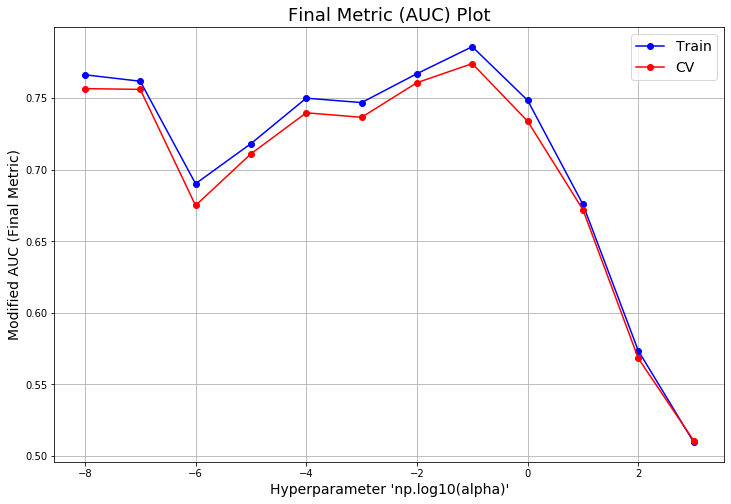



Training the best model...
Saving the model in path...


In [0]:
# tunning, training tunned model and saving it
best_model = return_best_model(X_train, X_cv, train_bow_uni,y_train, cv_bow_uni,
                 subgroups, actual_label, pred_label,
                 model_name = "log_reg", path = model_path, gram = 1)

Final metric for:
Train: 0.78595
CV: 0.77413
Test: 0.77033


Ploting Confusion matrix for whole data....



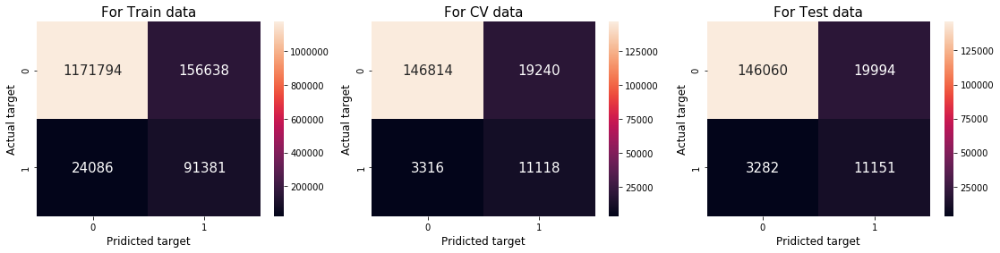



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


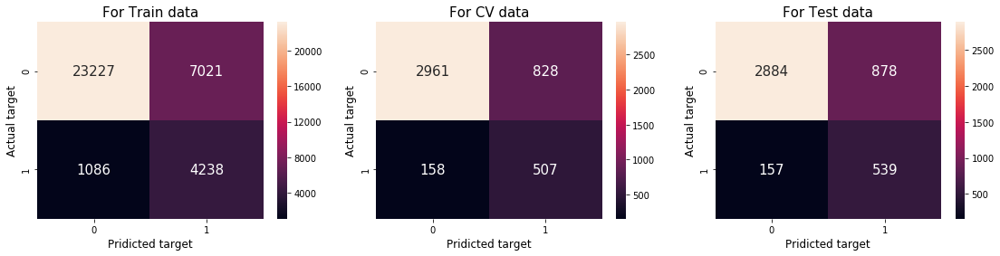




                                        *************** for 'female' identity ***************


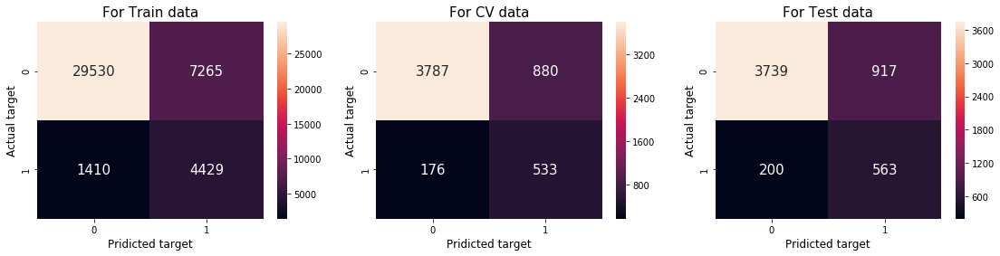




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


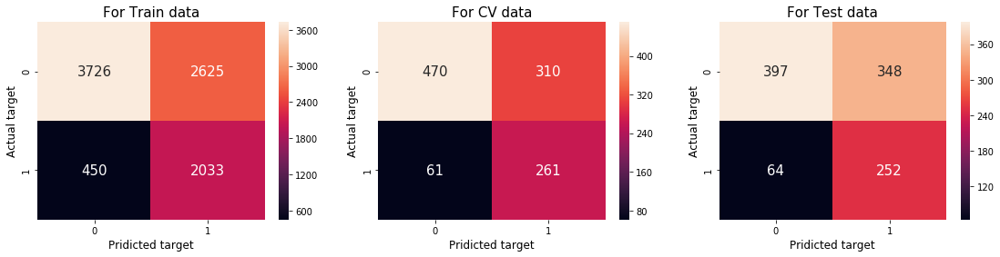




                                        *************** for 'christian' identity ***************


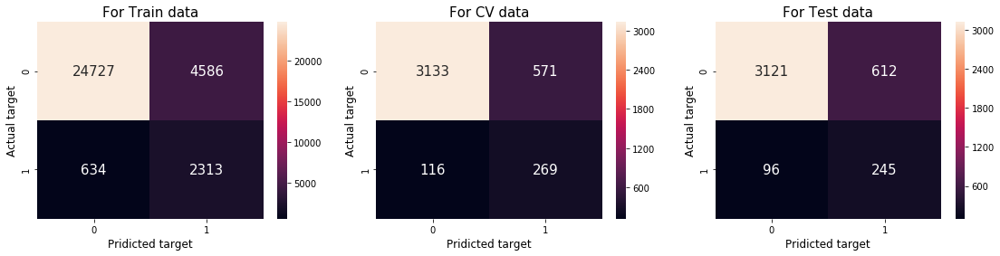




                                        *************** for 'jewish' identity ***************


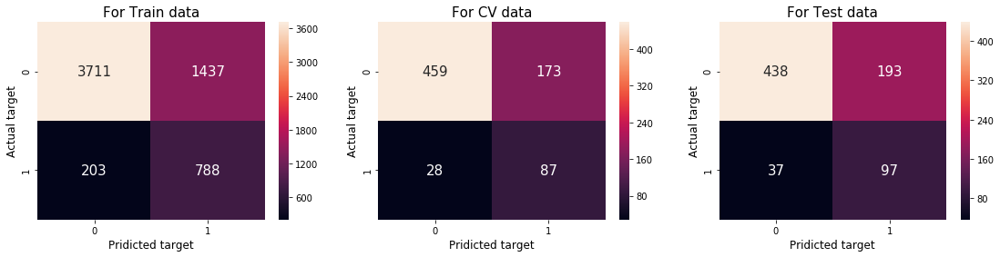




                                        *************** for 'muslim' identity ***************


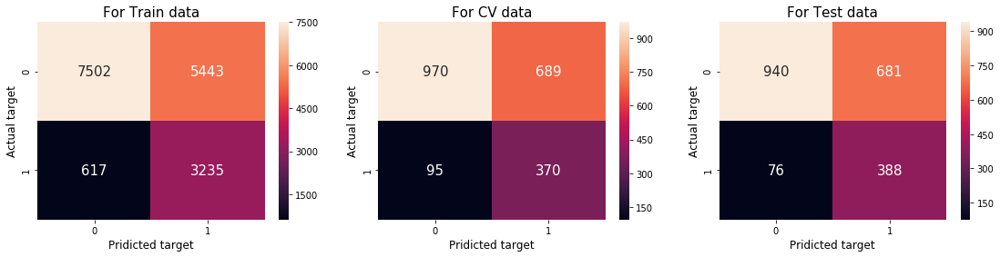




                                        *************** for 'black' identity ***************


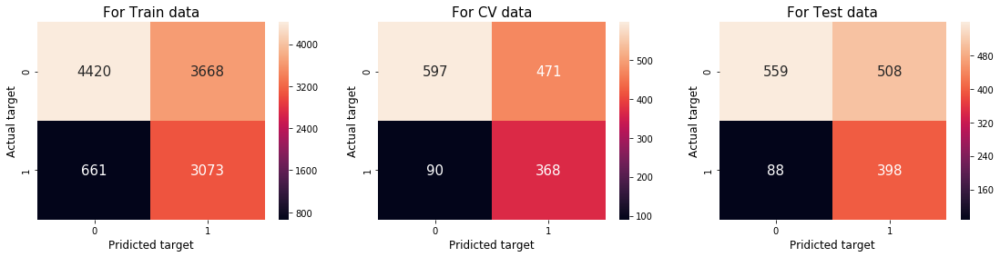




                                        *************** for 'white' identity ***************


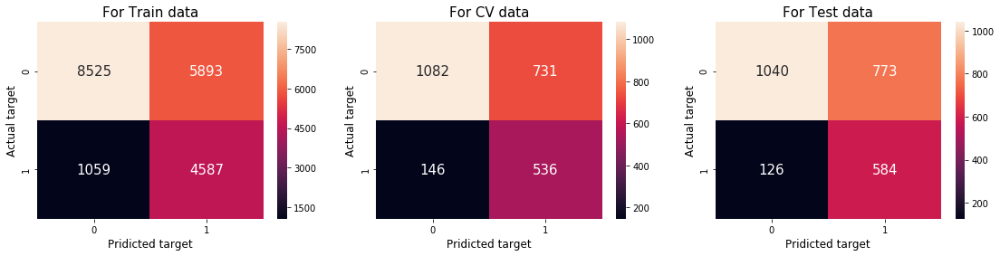




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


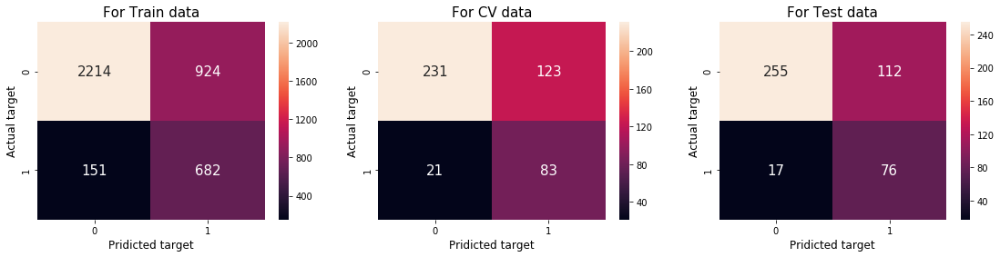

In [0]:
if os.path.isfile(model_path+"log_reg1.pkl"):
    with open(model_path+"log_reg1.pkl", 'rb') as f:
        best_model = pickle.load(f)
    tr, cv, te = report_model(best_model, X_train, X_cv, X_test,
                            train_bow_uni, cv_bow_uni, test_bow_uni, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["Logistic Regression", "BoW", "uni-gram",
                        tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")

#### **4.4.1.2 Bi-gram**

Tunning the parameter...
Tunning Done!
Time taken to tune: 2,027.254150390625
best value of hyper parameter 'alpha' = 0.1.



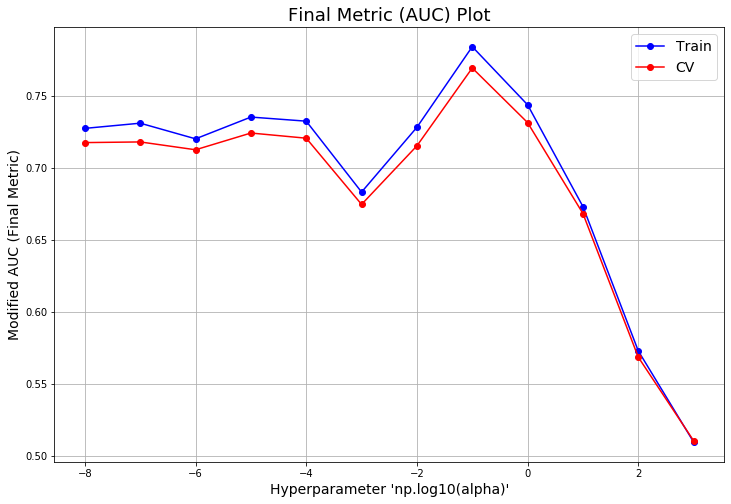



Training the best model...
Saving the model in path...


In [0]:
# tunning, training tunned model and saving it
best_model = return_best_model(X_train, X_cv, train_bow_bi, y_train, cv_bow_bi,
                 subgroups, actual_label, pred_label,
                 model_name="log_reg", path = model_path, gram = 2)

Final metric for:
Train: 0.78434
CV: 0.76955
Test: 0.76800


Ploting Confusion matrix for whole data....



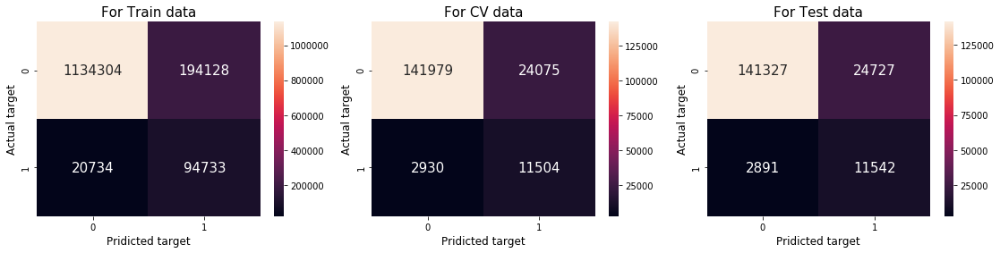



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


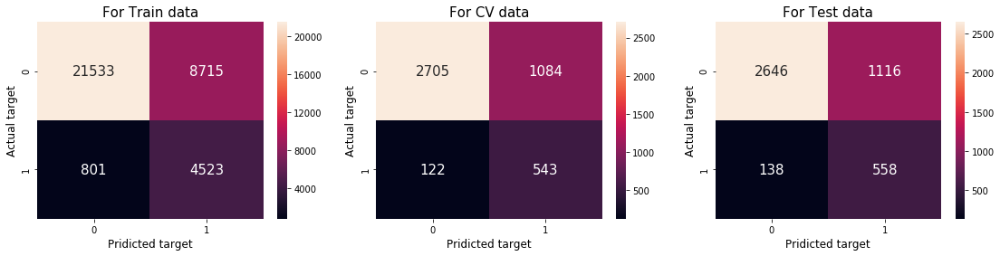




                                        *************** for 'female' identity ***************


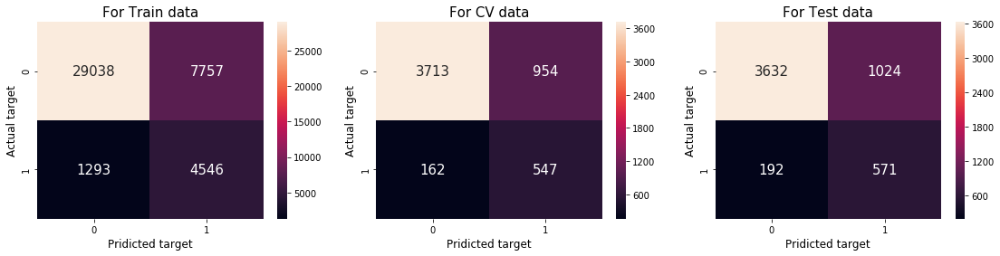




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


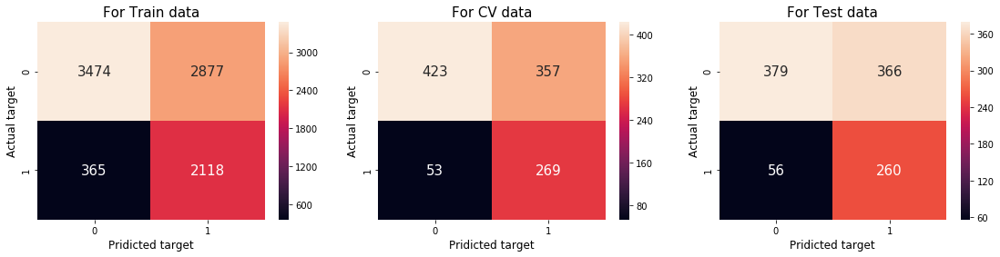




                                        *************** for 'christian' identity ***************


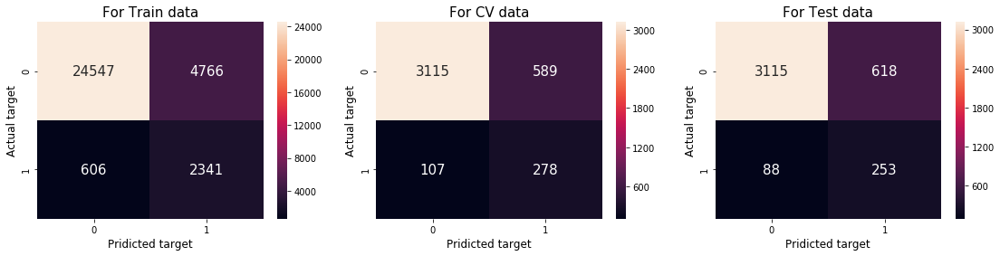




                                        *************** for 'jewish' identity ***************


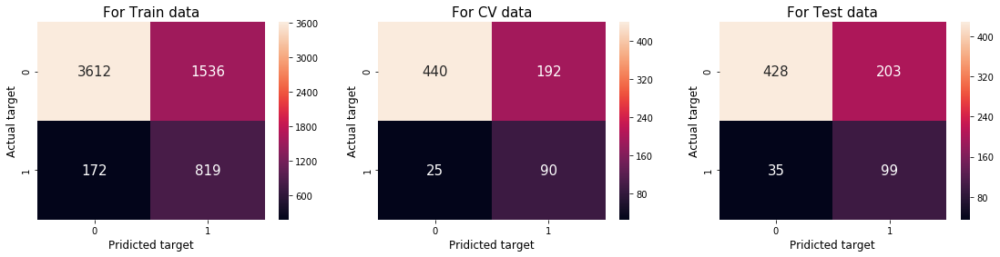




                                        *************** for 'muslim' identity ***************


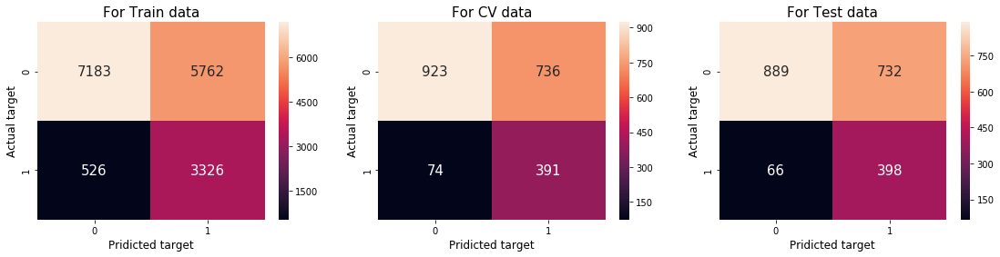




                                        *************** for 'black' identity ***************


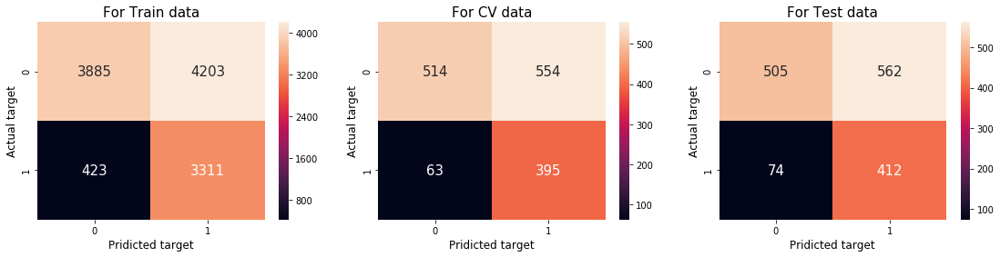




                                        *************** for 'white' identity ***************


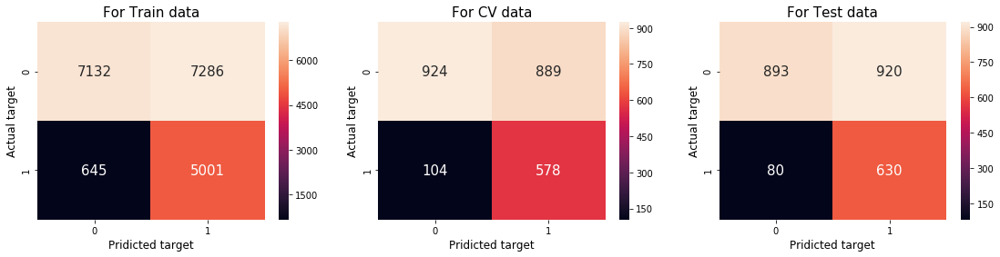




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


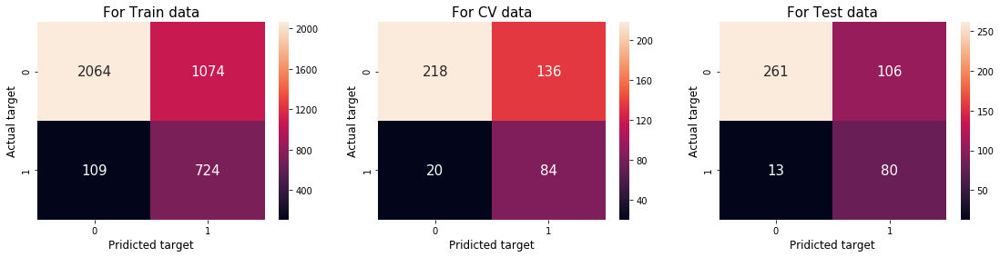

In [0]:
if os.path.isfile(model_path+"log_reg2.pkl"):
    with open(model_path+"log_reg2.pkl", 'rb') as f:
        best_model = pickle.load(f)

    tr, cv, te = report_model(best_model, X_train, X_cv, X_test,
                            train_bow_bi, cv_bow_bi, test_bow_bi, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["Logistic Regression", "BoW", "bi-gram",
                        tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")

#### **4.4.1.2 W2V**

Tunning the parameter...
Tunning Done!
Time taken to tune: 3,043.2785816192627
best value of hyper parameter 'alpha' = 10.



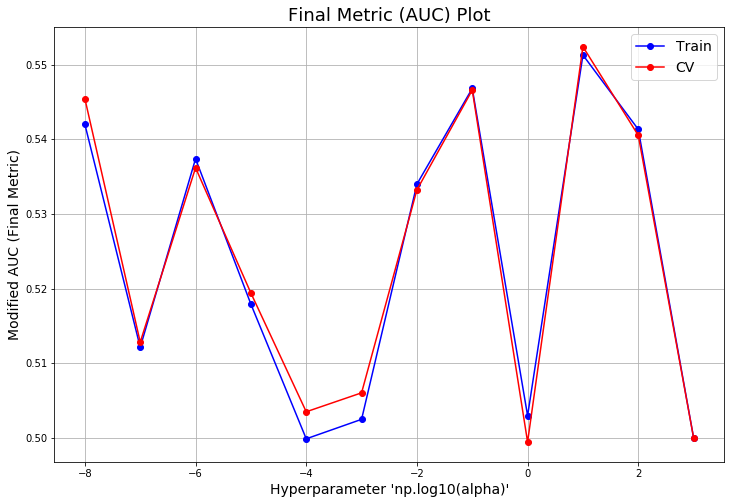



Training the best model...
Saving the model in path...


In [0]:
# tunning, training tunned model and saving it
best_model = return_best_model(X_train, X_cv, train_w2v, y_train, cv_w2v,
                 subgroups, actual_label, pred_label,
                 model_name="log_reg", path = model_path, gram = 3)

Final metric for:
Train: 0.55127
CV: 0.55239
Test: 0.55050


Ploting Confusion matrix for whole data....



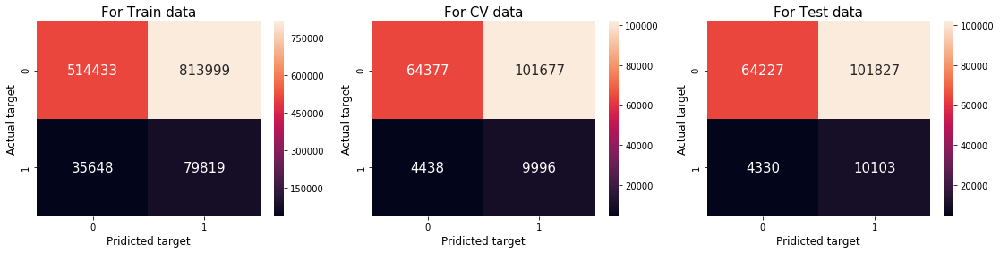



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


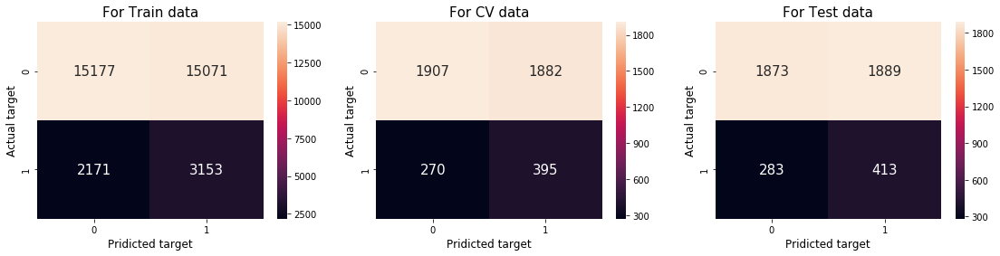




                                        *************** for 'female' identity ***************


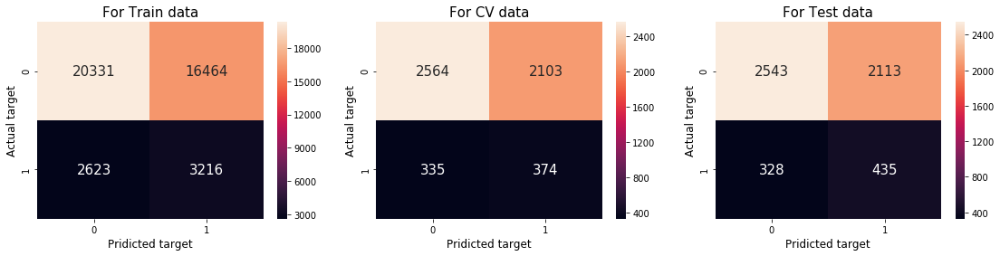




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


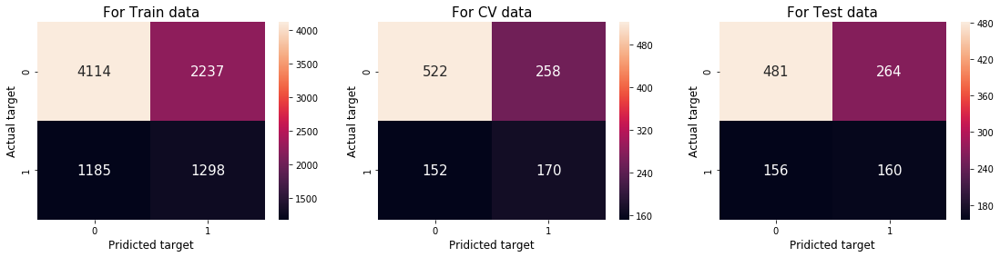




                                        *************** for 'christian' identity ***************


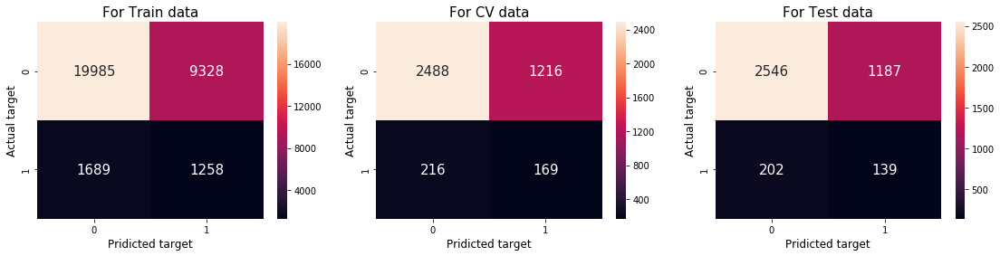




                                        *************** for 'jewish' identity ***************


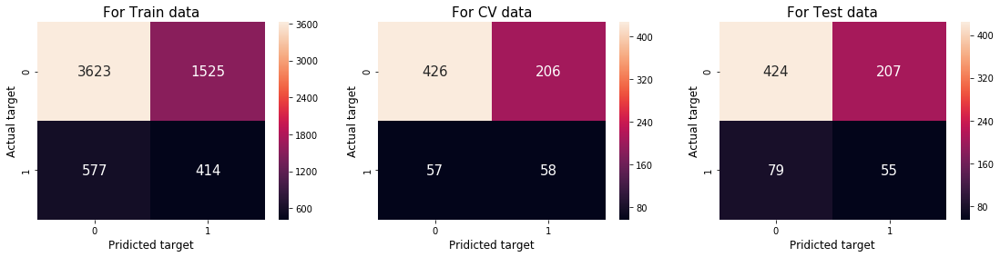




                                        *************** for 'muslim' identity ***************


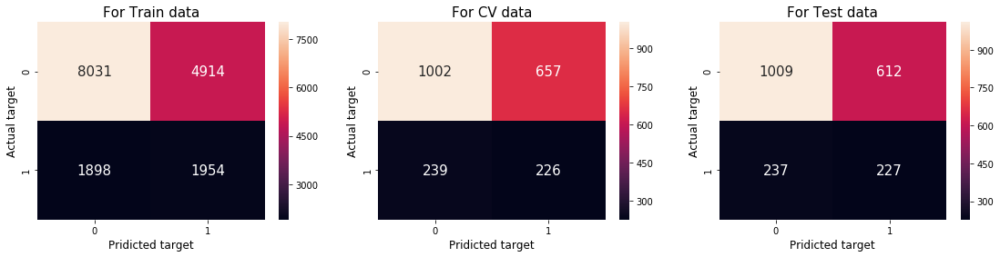




                                        *************** for 'black' identity ***************


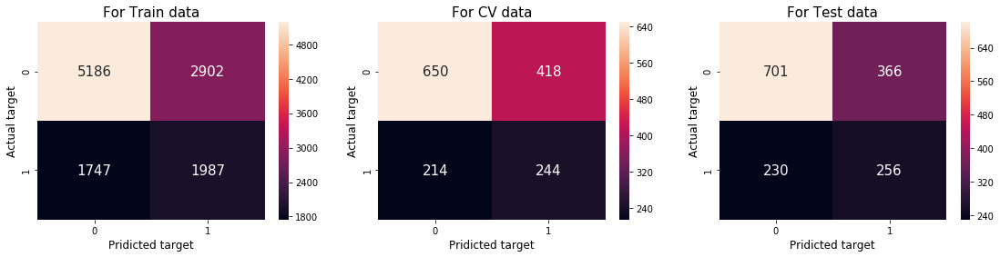




                                        *************** for 'white' identity ***************


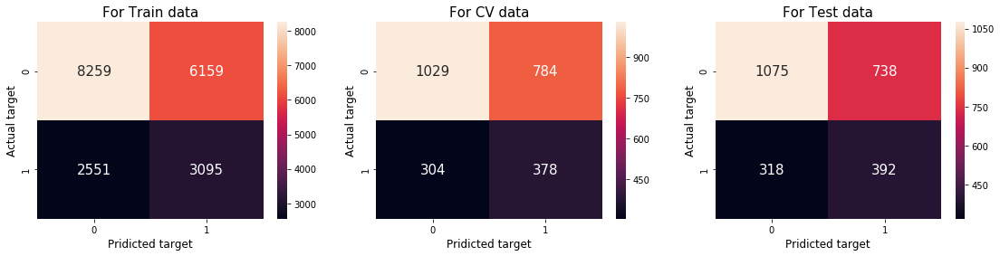




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


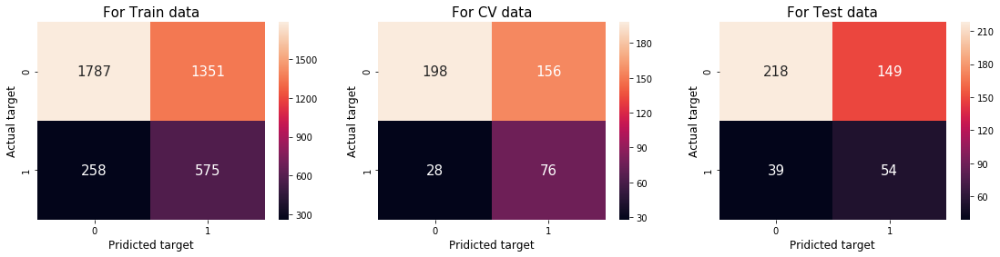

In [0]:
if os.path.isfile(model_path+"log_reg3.pkl"):
    with open(model_path+"log_reg3.pkl", 'rb') as f:
        best_model = pickle.load(f)

    tr, cv, te = report_model(best_model, X_train, X_cv, X_test,
                            train_w2v, cv_w2v, test_w2v, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["Logistic Regression", "avg-W2V", "None",
                        tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")


### **4.4.2 Decision Tree**

#### **4.4.2.1 Uni-gram**

Tunning the parameter...
Tunning Done!
Time taken to tune: 7,685.227672815323
best value of hyper parameter max_depth = 75.



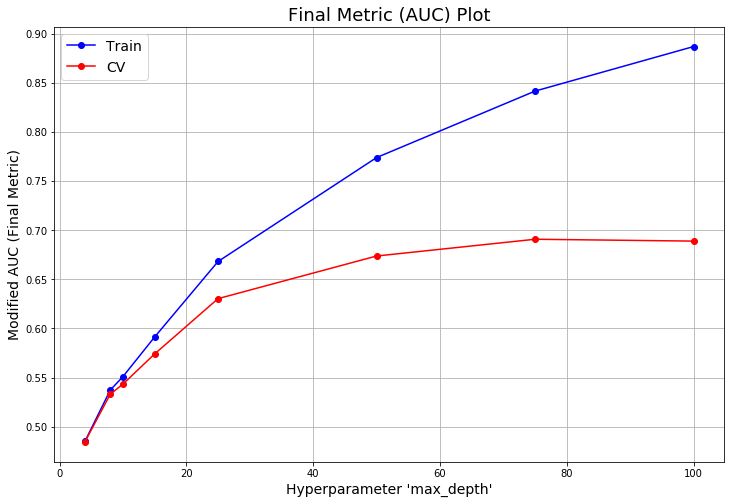



Training the best model...
Saving the model in path...


In [0]:
# tunning, training tunned model and saving it
best_model = return_best_model(X_train, X_cv, train_bow_uni, y_train, cv_bow_uni,
                 subgroups, actual_label, pred_label,
                 model_name = "DT", path = model_path, gram = 1)

Final metric for:
Train: 0.84150
CV: 0.69074
Test: 0.69232


Ploting Confusion matrix for whole data....



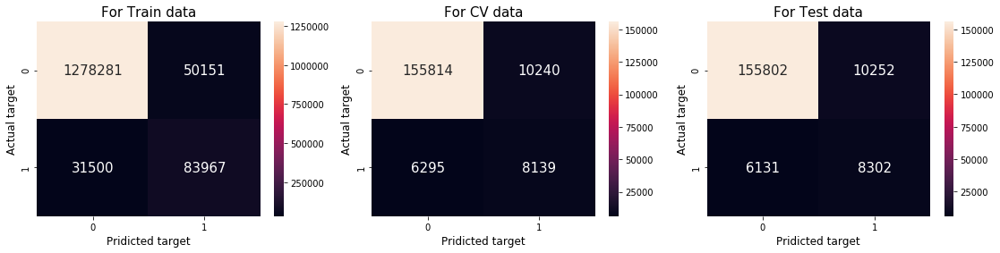



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


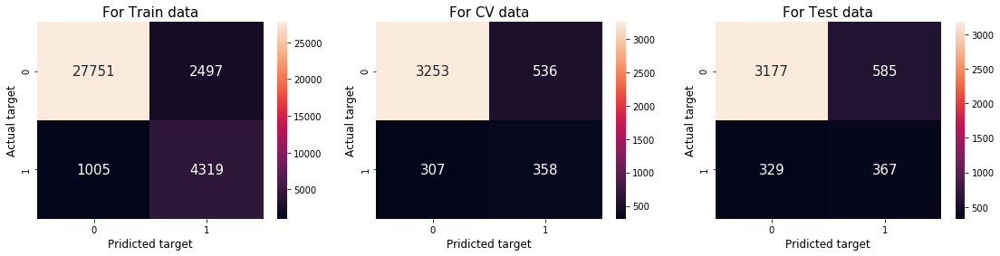




                                        *************** for 'female' identity ***************


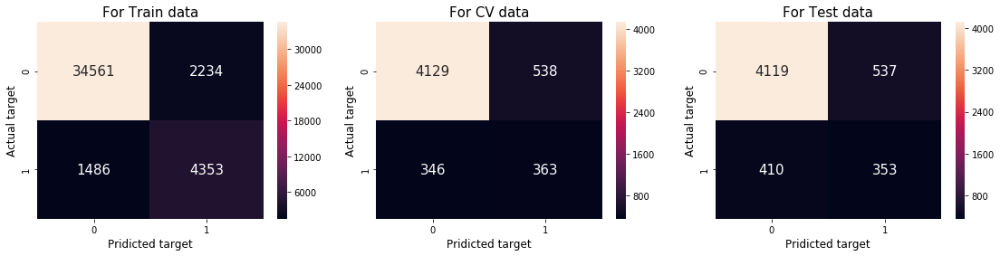




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


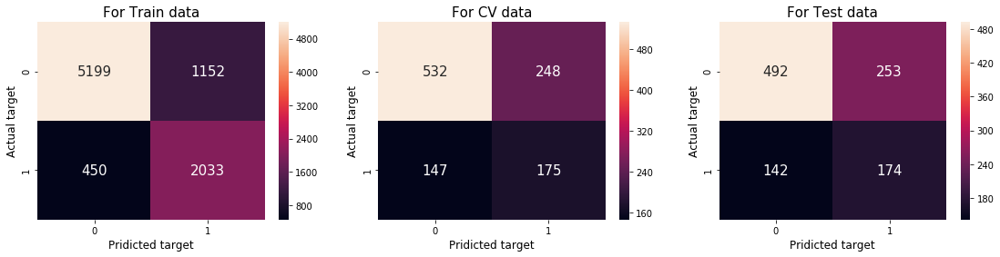




                                        *************** for 'christian' identity ***************


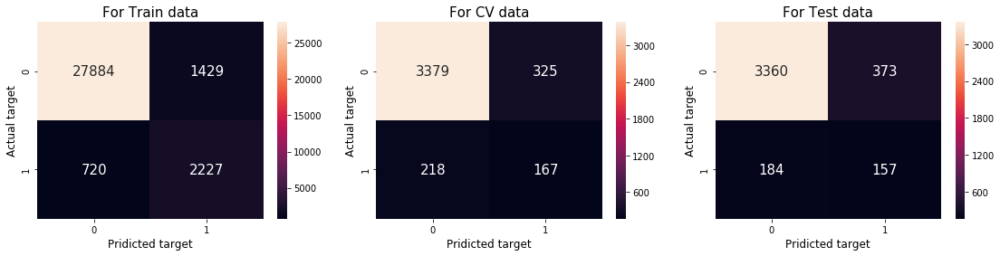




                                        *************** for 'jewish' identity ***************


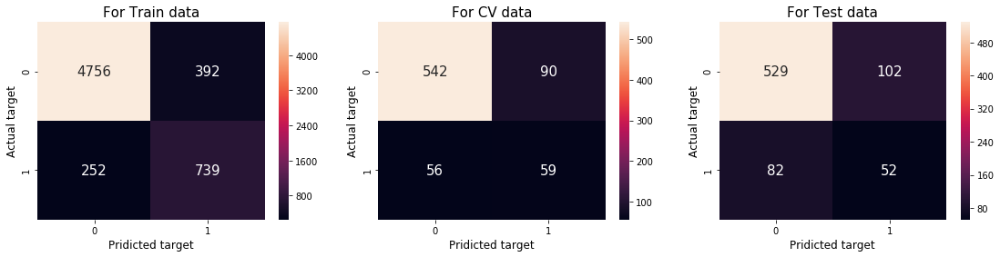




                                        *************** for 'muslim' identity ***************


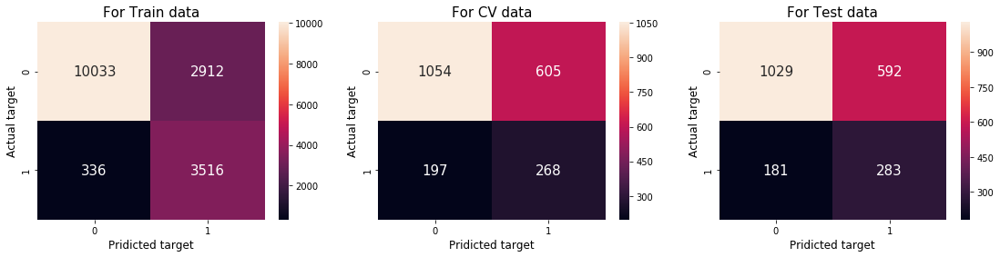




                                        *************** for 'black' identity ***************


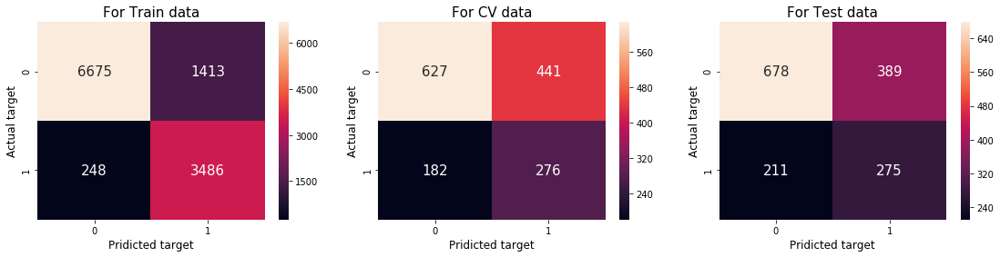




                                        *************** for 'white' identity ***************


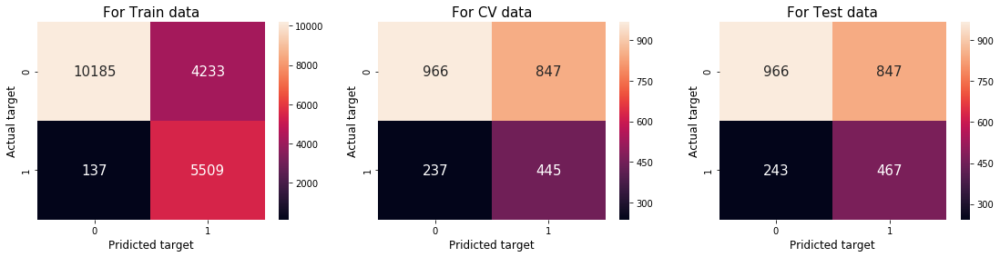




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


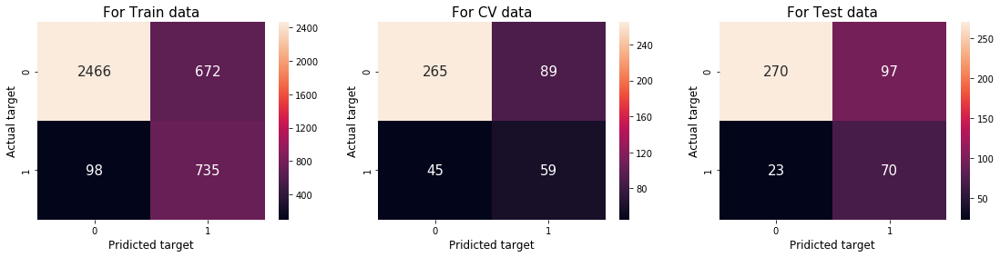

In [0]:
if os.path.isfile(model_path+"DT1.pkl"):
    with open(model_path+"DT1.pkl", 'rb') as f:
        best_model = pickle.load(f)

    tr, cv, te = report_model(best_model, X_train, X_cv, X_test,
                            train_bow_uni, cv_bow_uni, test_bow_uni, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["Decision Tree", "BoW", "uni-gram", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")


#### **4.4.2.2 Bi-gram**

Tunning the parameter...
Tunning Done!
Time taken to tune: 8,882.09530711174
best value of hyper parameter max_depth = 75.



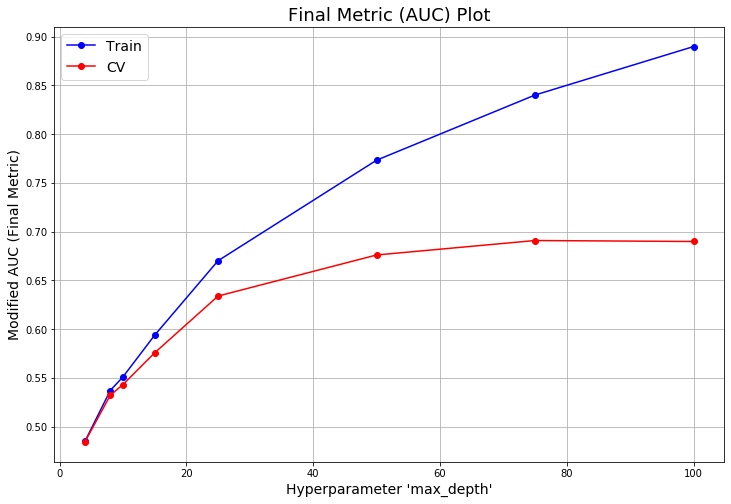



Training the best model...
Saving the model in path...


In [0]:
# tunning, training tunned model and saving it
best_model = return_best_model(X_train, X_cv, train_bow_bi, y_train, cv_bow_bi,
                 subgroups, actual_label, pred_label,
                 model_name = "DT", path = model_path, gram = 2)

Final metric for:
Train: 0.84006
CV: 0.69094
Test: 0.69371


Ploting Confusion matrix for whole data....



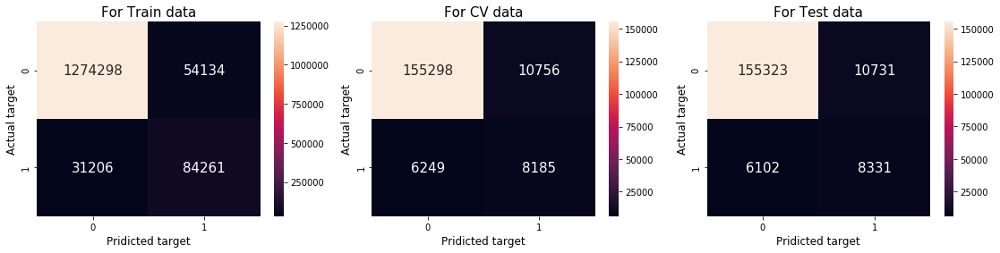



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


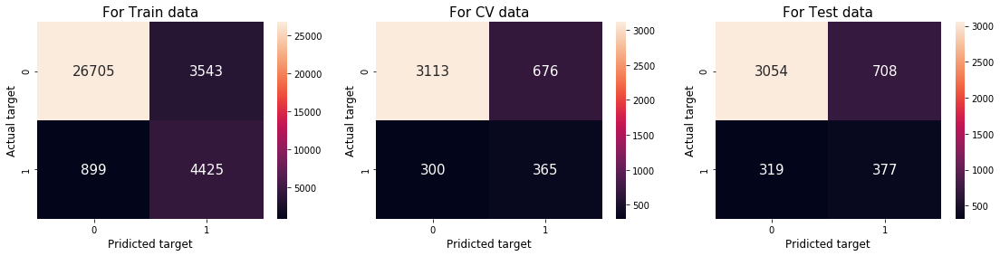




                                        *************** for 'female' identity ***************


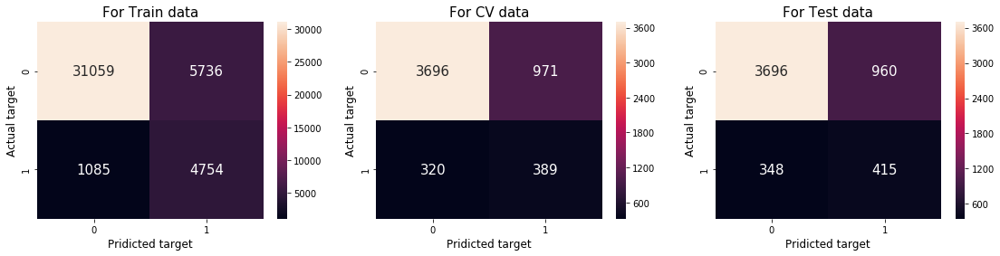




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


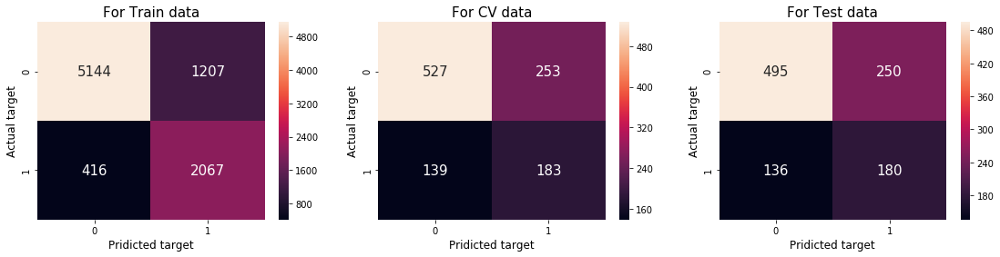




                                        *************** for 'christian' identity ***************


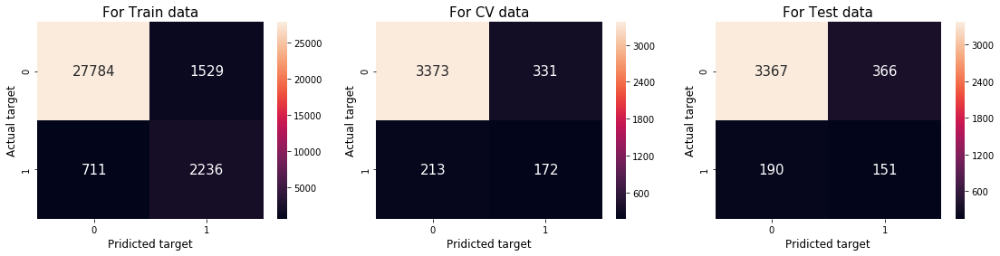




                                        *************** for 'jewish' identity ***************


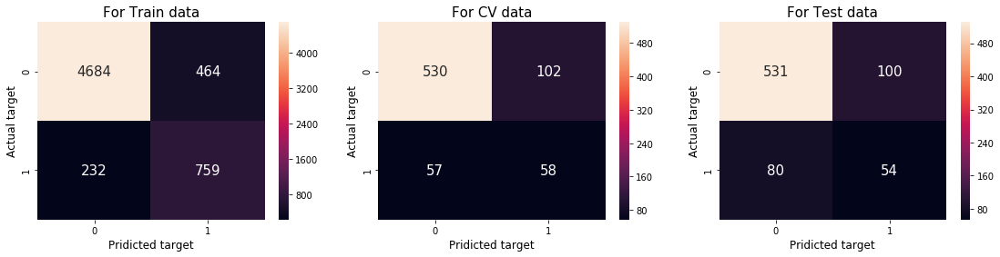




                                        *************** for 'muslim' identity ***************


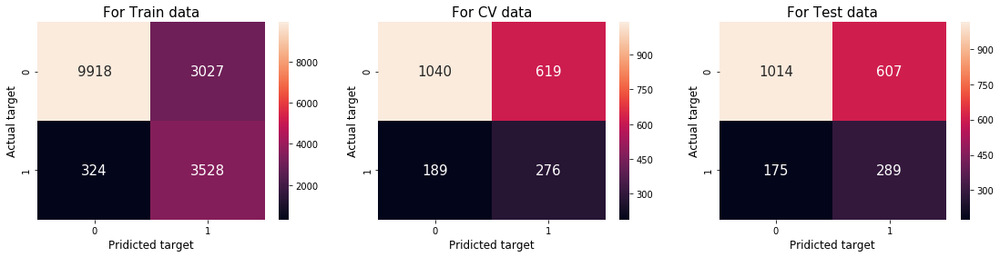




                                        *************** for 'black' identity ***************


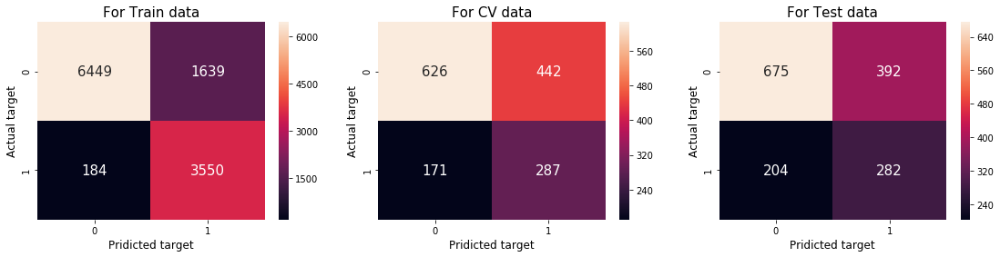




                                        *************** for 'white' identity ***************


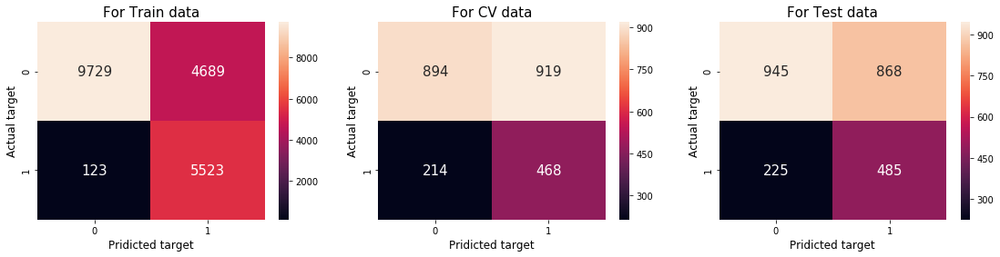




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


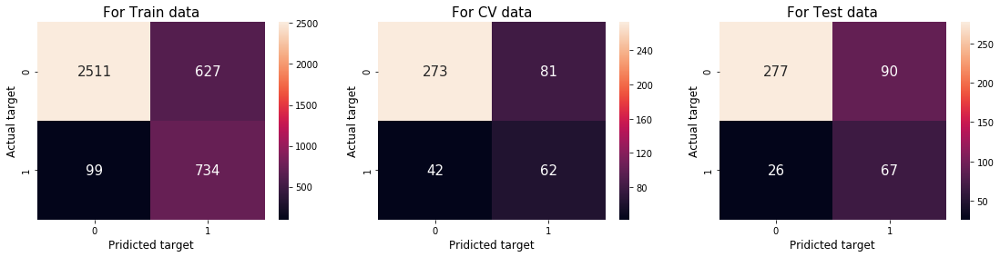

In [0]:
if os.path.isfile(model_path+"DT2.pkl"):
    with open(model_path+"DT2.pkl", 'rb') as f:
        best_model = pickle.load(f)

    tr, cv, te = report_model(best_model, X_train, X_cv, X_test,
                            train_bow_bi, cv_bow_bi, test_bow_bi, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["Decision Tree", "BoW", "bi-gram", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")


#### **4.4.2.3 W2V**

Tunning the parameter...
Tunning Done!
Time taken to tune: 6,851.53262925148
best value of hyper parameter max_depth = 15.



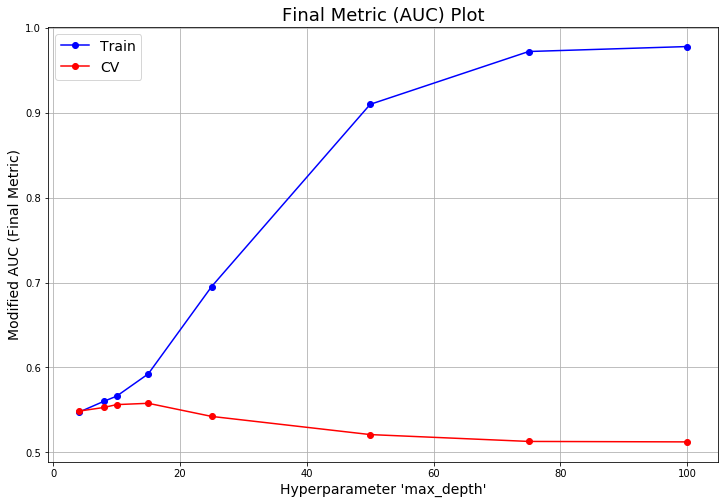



Training the best model...
Saving the model in path...


In [0]:
# tunning, training tunned model and saving it
best_model = return_best_model(X_train, X_cv, train_w2v, y_train, cv_w2v,
                 subgroups, actual_label, pred_label,
                 model_name="DT", path = model_path, gram = 3)

Final metric for:
Train: 0.59235
CV: 0.55768
Test: 0.55252


Ploting Confusion matrix for whole data....



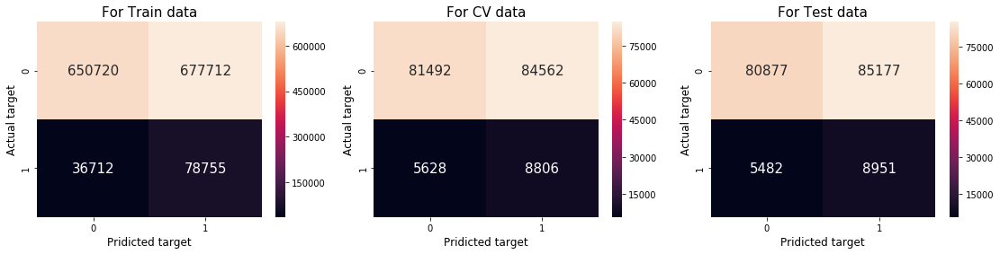



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


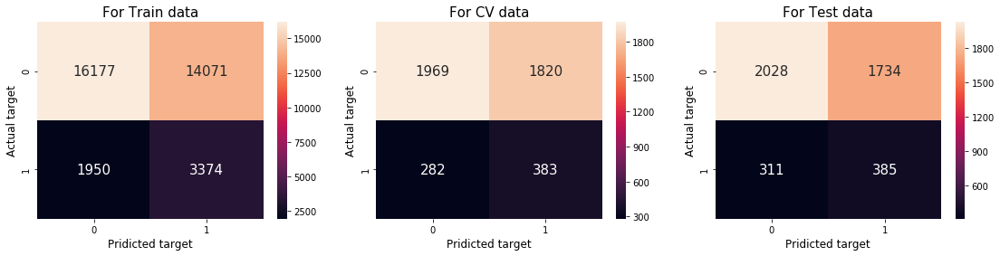




                                        *************** for 'female' identity ***************


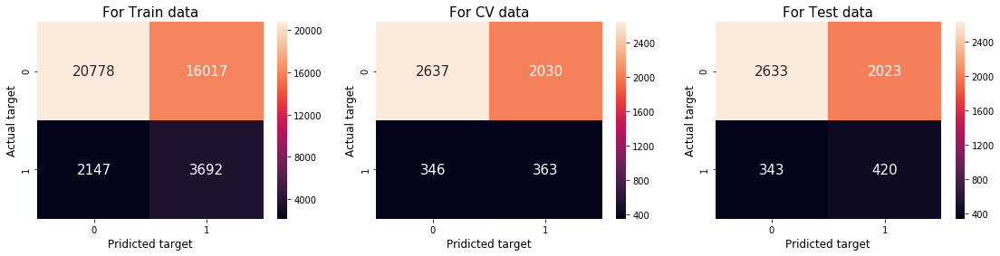




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


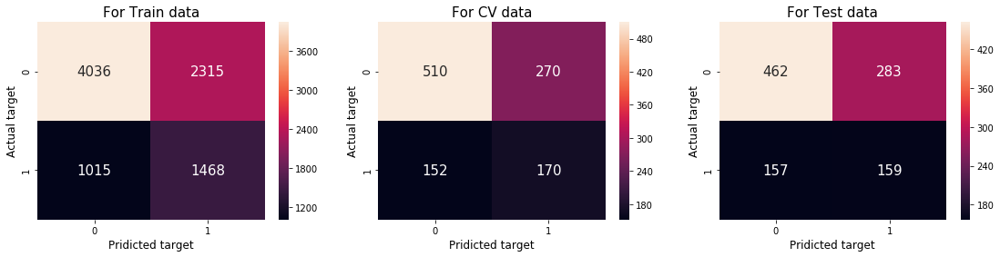




                                        *************** for 'christian' identity ***************


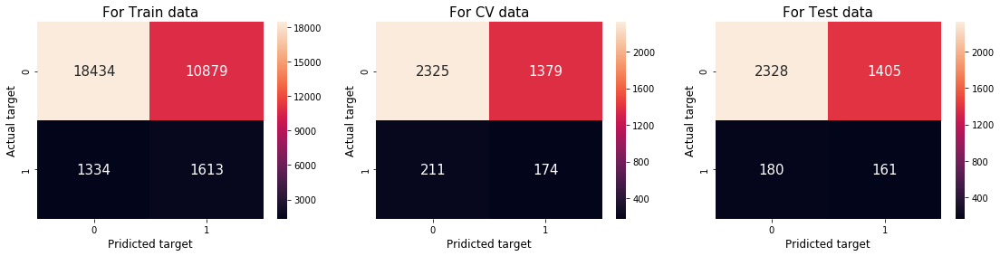




                                        *************** for 'jewish' identity ***************


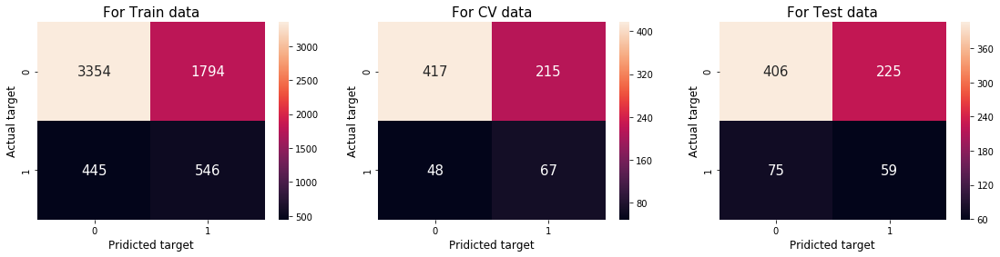




                                        *************** for 'muslim' identity ***************


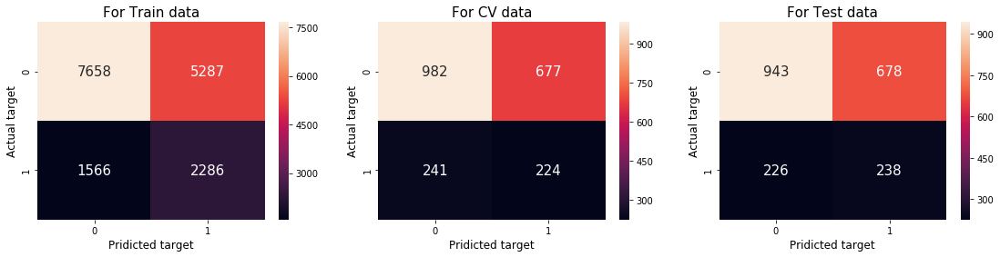




                                        *************** for 'black' identity ***************


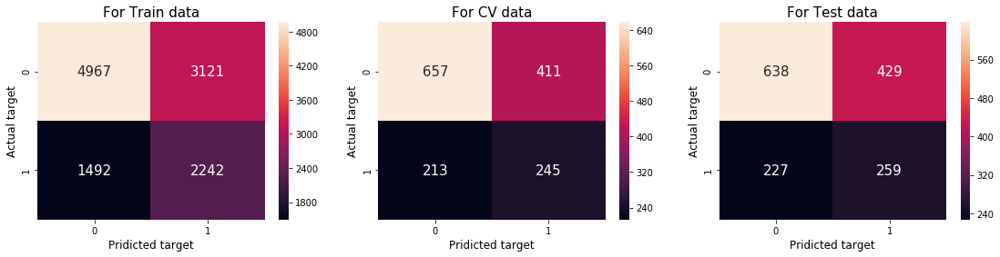




                                        *************** for 'white' identity ***************


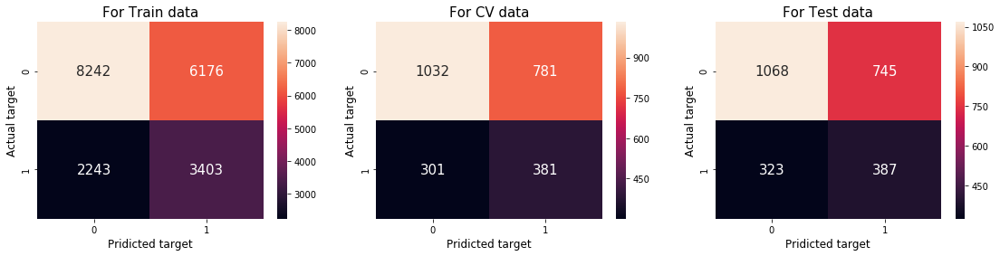




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


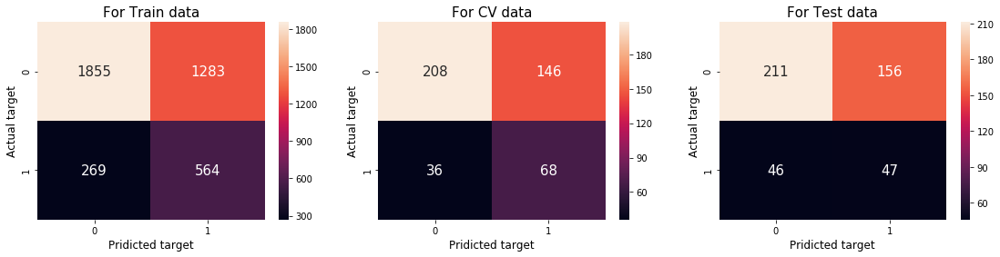

In [0]:
if os.path.isfile(model_path+"DT3.pkl"):
    with open(model_path+"DT3.pkl", 'rb') as f:
        best_model = pickle.load(f)

    tr, cv, te = report_model(best_model, X_train, X_cv, X_test,
                            train_w2v, cv_w2v, test_w2v, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["Decision Tree", "W2V", "None", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")


### **4.4.3 GBDT**

#### **4.4.3.1 Uni-gram**

In [0]:
# tunning, training tunned model and saving it
best_model = return_best_model(X_train, X_cv, train_bow_uni, y_train, cv_bow_uni,
                 subgroups, actual_label, pred_label,
                 model_name = "GBDT", path = model_path, gram = 1)

Tunning the parameters...


Tunning for depth = 2 and n_estimators = 50,             final train AUC = 0.56611 and CV AUC = 0.56429
Tunning for depth = 2 and n_estimators = 100,             final train AUC = 0.63380 and CV AUC = 0.63606
Tunning for depth = 2 and n_estimators = 200,             final train AUC = 0.67559 and CV AUC = 0.68081
Tunning for depth = 2 and n_estimators = 400,             final train AUC = 0.70938 and CV AUC = 0.70827
Tunning for depth = 2 and n_estimators = 500,             final train AUC = 0.72204 and CV AUC = 0.71743
Tunning for depth = 2 and n_estimators = 800,             final train AUC = 0.73963 and CV AUC = 0.73378
Tunning for depth = 2 and n_estimators = 1000,             final train AUC = 0.74733 and CV AUC = 0.74167


Tunning for depth = 5 and n_estimators = 50,             final train AUC = 0.66057 and CV AUC = 0.65993
Tunning for depth = 5 and n_estimators = 100,             final train AUC = 0.69263 and CV AUC = 0.69092
Tunning for depth = 5 and 

Final metric for:
Train: 0.81048
CV: 0.78390
Test: 0.78525


Ploting Confusion matrix for whole data....



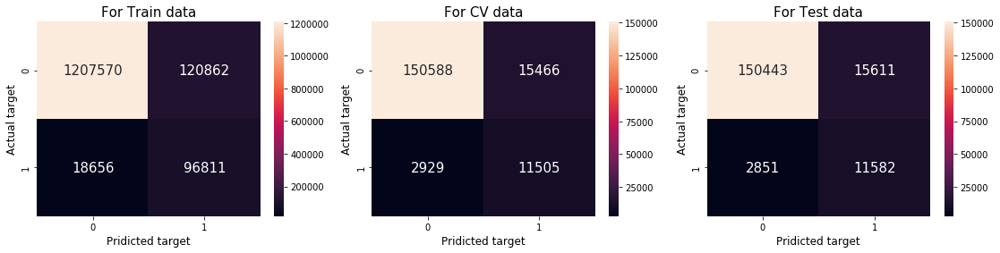



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


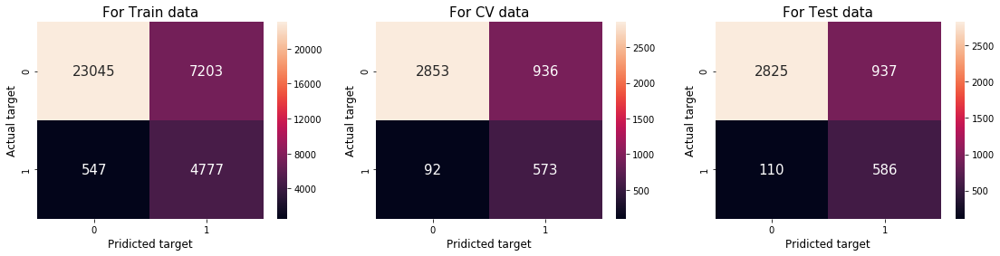




                                        *************** for 'female' identity ***************


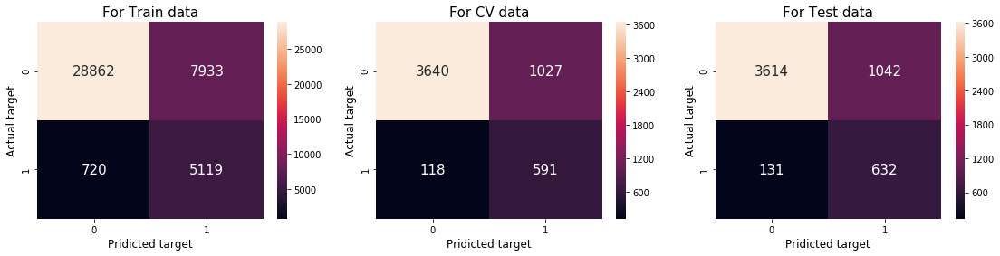




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


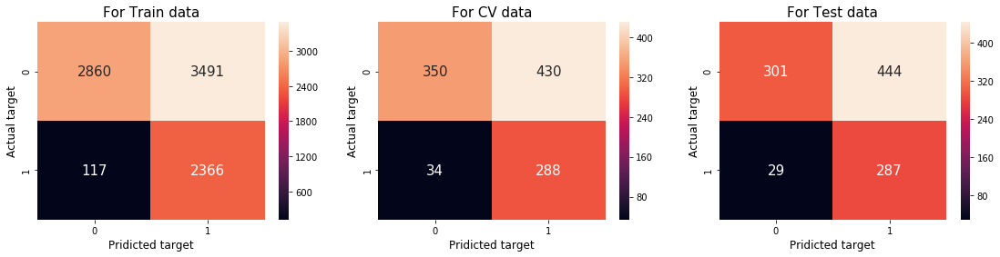




                                        *************** for 'christian' identity ***************


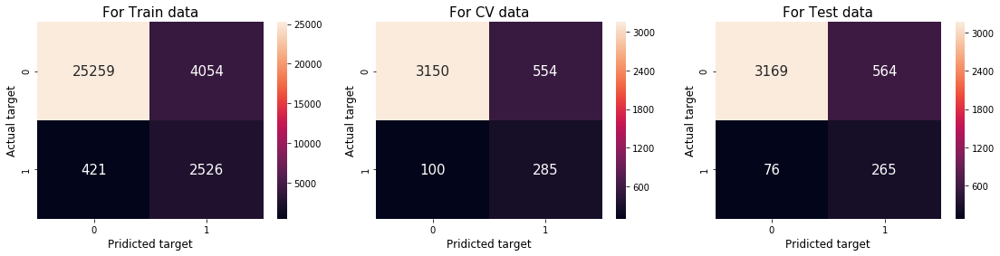




                                        *************** for 'jewish' identity ***************


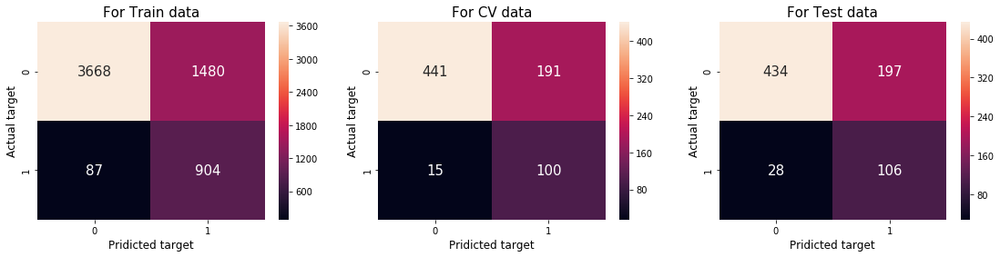




                                        *************** for 'muslim' identity ***************


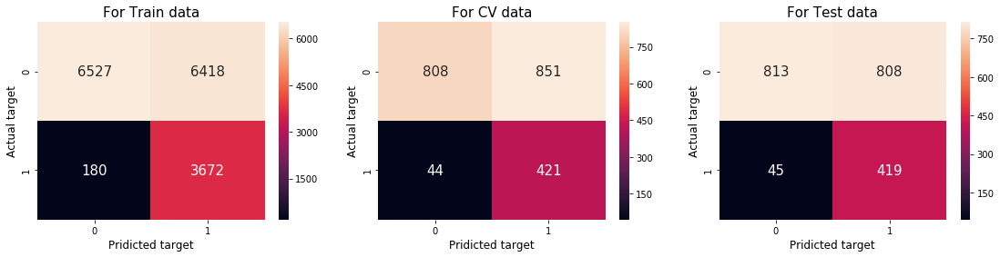




                                        *************** for 'black' identity ***************


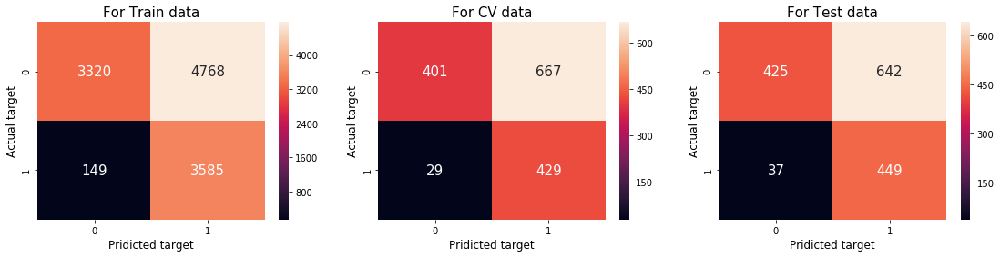




                                        *************** for 'white' identity ***************


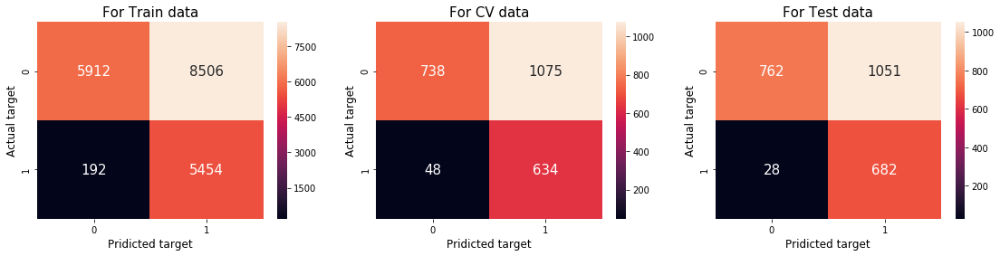




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


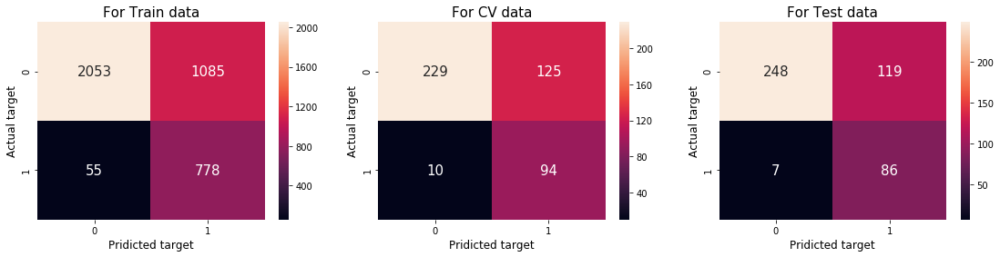

In [0]:
train_bow_uni = train_bow_uni.astype("float64")
cv_bow_uni    = cv_bow_uni.astype("float64")
test_bow_uni  = test_bow_uni.astype("float64")

if os.path.isfile(model_path+"GBDT1.pkl"):
    with open(model_path+"GBDT1.pkl", 'rb') as f:
        best_model = pickle.load(f)

    tr, cv, te = report_model(best_model, X_train, X_cv, X_test,
                            train_bow_uni, cv_bow_uni, test_bow_uni, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["GBDT", "BoW", "uni-gram", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")

#### **4.4.3.2 Bi-gram**

In [0]:
# tunning, training tunned model and saving it
best_model = return_best_model(X_train, X_cv, train_bow_bi,y_train, cv_bow_bi,
                 subgroups, actual_label, pred_label,
                 model_name="GBDT", path = model_path, gram = 2)

Tunning the parameters...


Tunning the parameters...


Tunning for depth = 2 and n_estimators = 50,             final train AUC = 0.56612 and CV AUC = 0.56429
Tunning for depth = 2 and n_estimators = 50,             final train AUC = 0.56612 and CV AUC = 0.56429
Tunning for depth = 2 and n_estimators = 100,             final train AUC = 0.62016 and CV AUC = 0.62045
Tunning for depth = 2 and n_estimators = 100,             final train AUC = 0.62016 and CV AUC = 0.62045
Tunning for depth = 2 and n_estimators = 200,             final train AUC = 0.67489 and CV AUC = 0.68065
Tunning for depth = 2 and n_estimators = 200,             final train AUC = 0.67489 and CV AUC = 0.68065
Tunning for depth = 2 and n_estimators = 400,             final train AUC = 0.70932 and CV AUC = 0.70742
Tunning for depth = 2 and n_estimators = 400,             final train AUC = 0.70932 and CV AUC = 0.70742
Tunning for depth = 2 and n_estimators = 500,             final train AUC = 0.72124 and CV AUC = 0.71762
T

Final metric for:
Train: 0.80574
CV: 0.77709
Test: 0.77863


Ploting Confusion matrix for whole data....



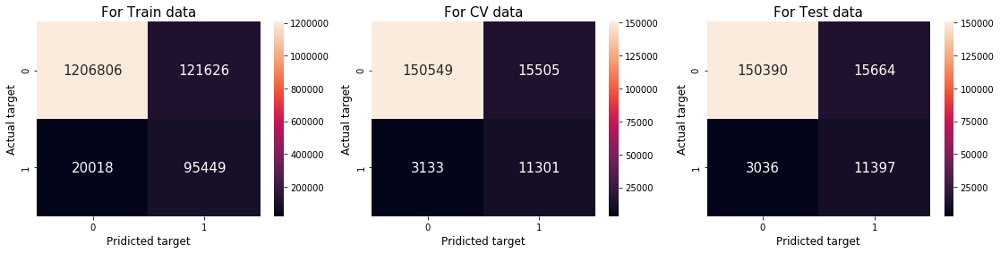



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


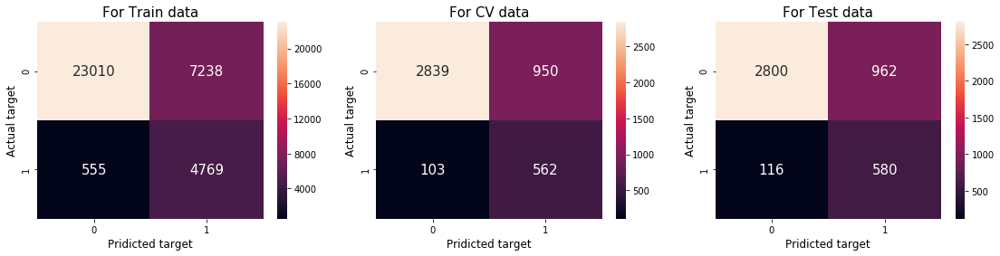




                                        *************** for 'female' identity ***************


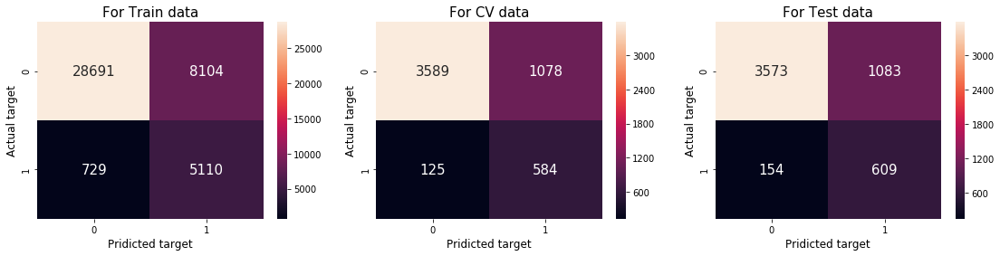




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


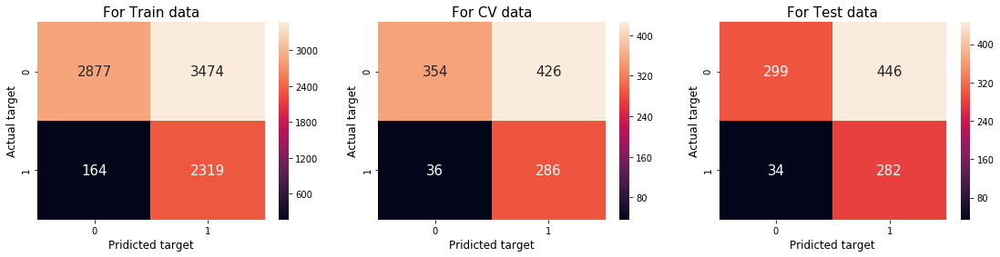




                                        *************** for 'christian' identity ***************


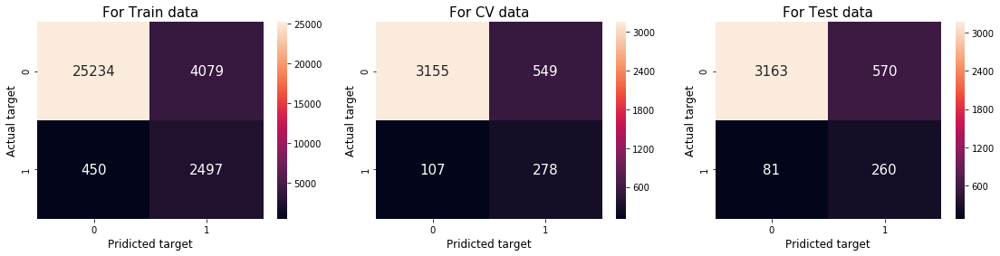




                                        *************** for 'jewish' identity ***************


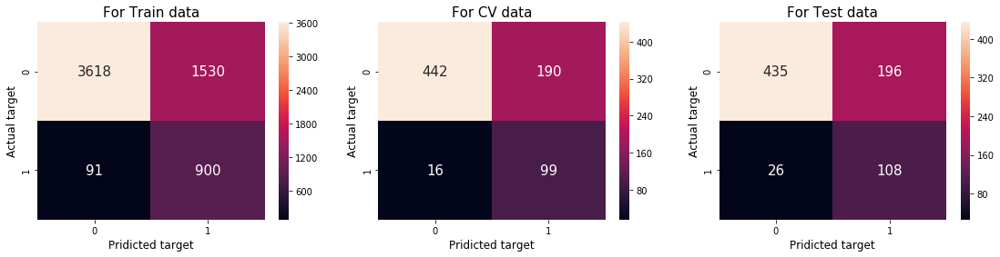




                                        *************** for 'muslim' identity ***************


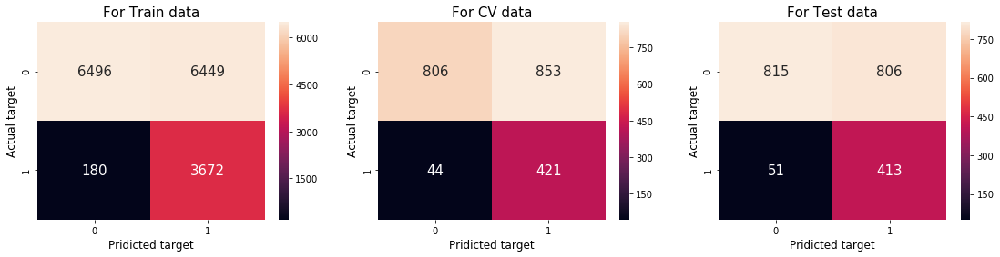




                                        *************** for 'black' identity ***************


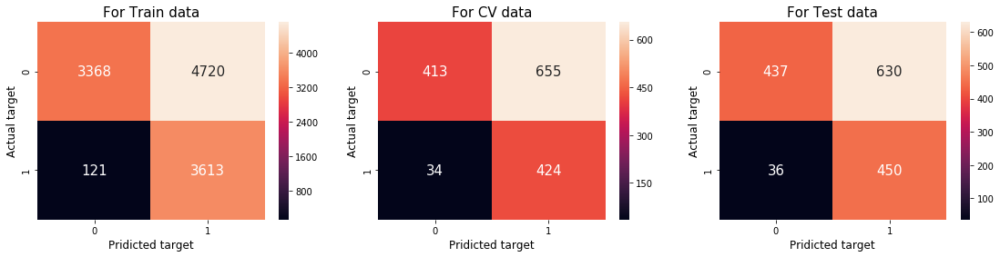




                                        *************** for 'white' identity ***************


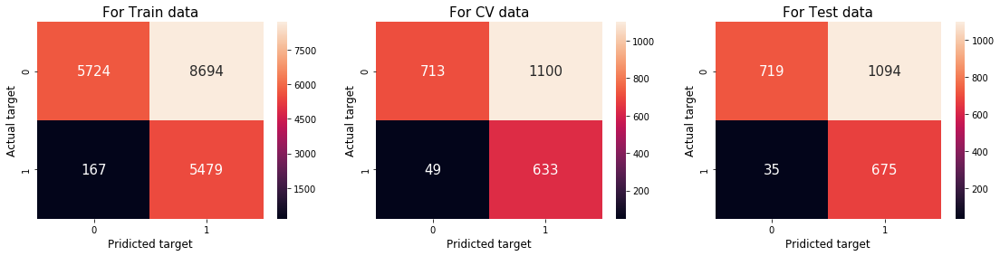




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


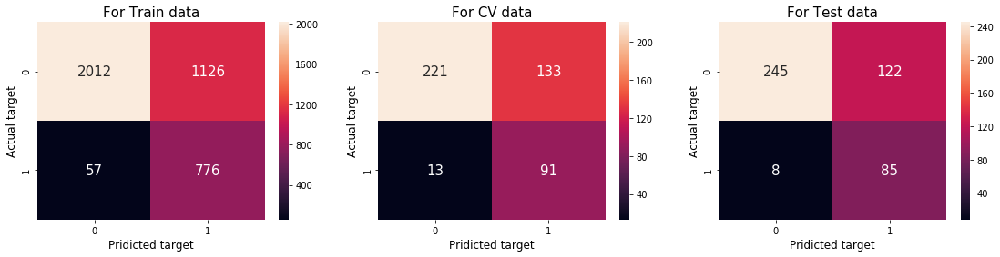

In [0]:
train_bow_bi = train_bow_bi.astype("float64")
cv_bow_bi    = cv_bow_bi.astype("float64")
test_bow_bi  = test_bow_bi.astype("float64")

if os.path.isfile(model_path+"GBDT2.pkl"):
    with open(model_path+"GBDT2.pkl", 'rb') as f:
        best_model = pickle.load(f)

    tr, cv, te = report_model(best_model, X_train, X_cv, X_test,
                            train_bow_bi, cv_bow_bi, test_bow_bi, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["GBDT", "BoW", "bi-gram", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")

* After tunning the **GBDT** model using brute-search, I found that that **RandomizedSearchCV** is yielding same result as **brute-search**. **RandomizedSearchCV** is much faster than brute-seacrh.
* So I'm going to use **RandomizedSearchCV** for **RF** models to tune the hyper-parameters.
* Adding these hand crafted features is not improving the result, so I'm not goiing to consider it for **RF**.

### **4.4.4 Random Forest**

#### **4.4.4.1 Uni-gram**

In [0]:
# tunning, training tunned model and saving it
best_model = return_best_model(X_train, X_cv, uni_bow_train,y_train, uni_bow_cv,
                 subgroups, actual_label, pred_label,
                 model_name = "RF", path = model_path, gram = 1)

Tunning the parameters...
Done!
Time take to tune the parameter: 4007.5189 seconds.

Best parameters of tunned model is:
 {'n_estimators': 1000, 'max_depth': 15}

Best score of of tunned model is: 0.8809020852991463

Best model is:
 RandomForestClassifier(bootstrap=True, class_weight={0: 115467, 1: 1328432},
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=1000, n_jobs=-1, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)


Training the best model...
Saving the model in path...


Final metric for:
Train: 0.70019
CV: 0.69051
Test: 0.69256


Ploting Confusion matrix for whole data....



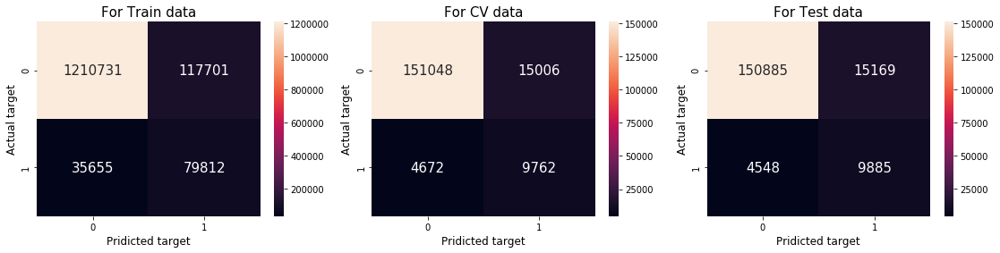



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


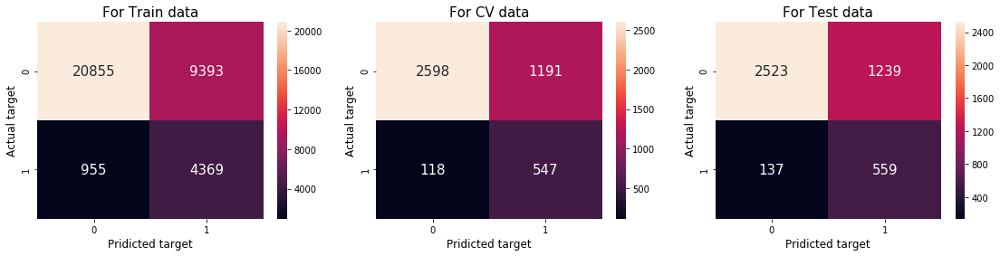




                                        *************** for 'female' identity ***************


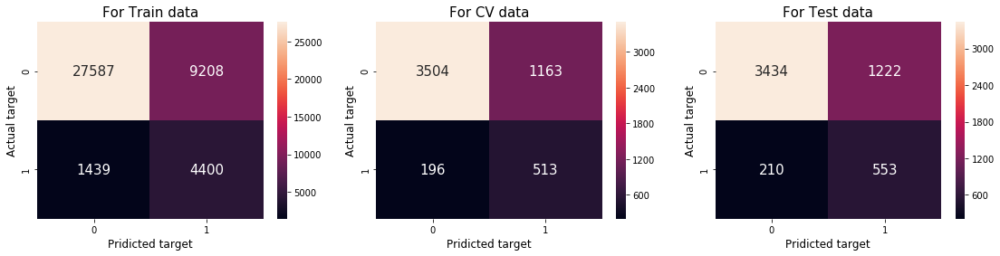




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


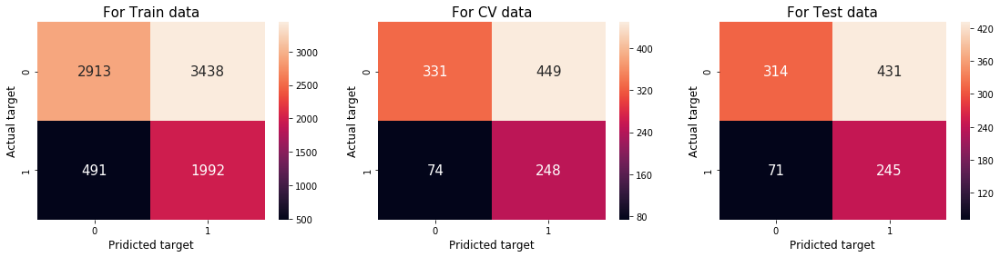




                                        *************** for 'christian' identity ***************


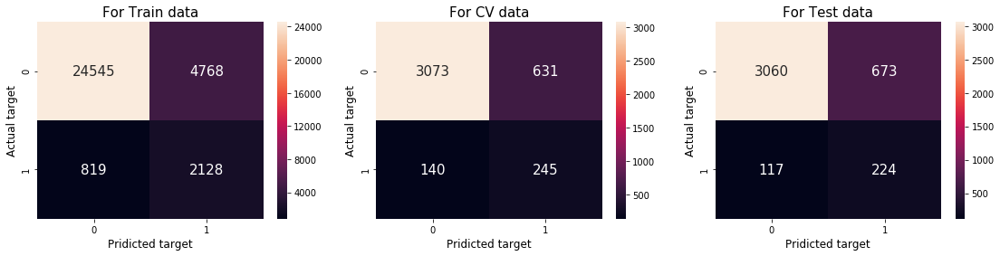




                                        *************** for 'jewish' identity ***************


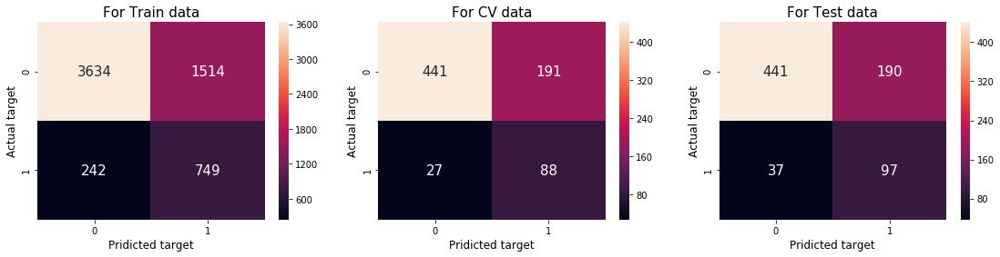




                                        *************** for 'muslim' identity ***************


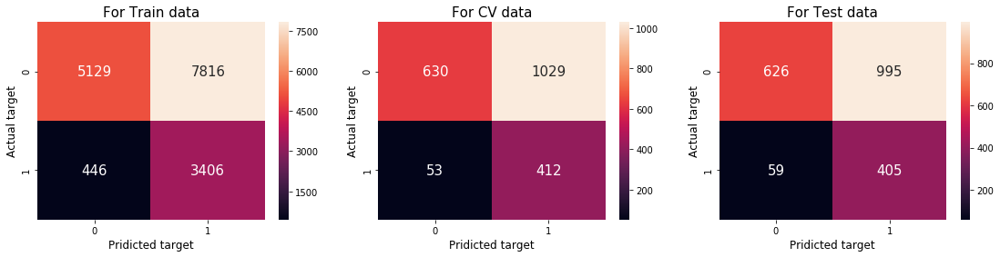




                                        *************** for 'black' identity ***************


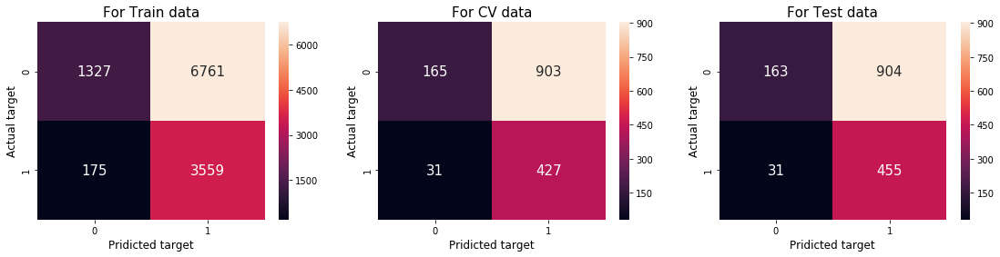




                                        *************** for 'white' identity ***************


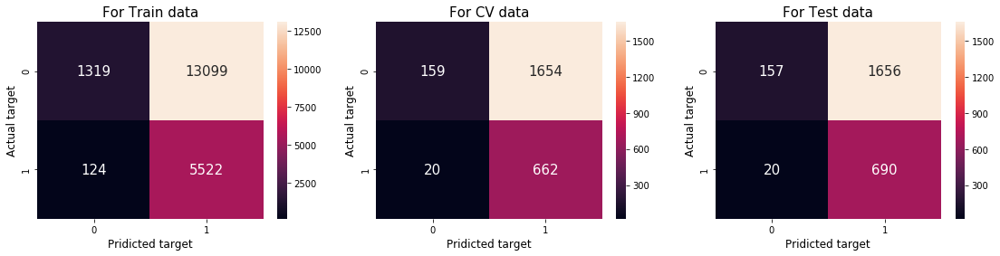




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


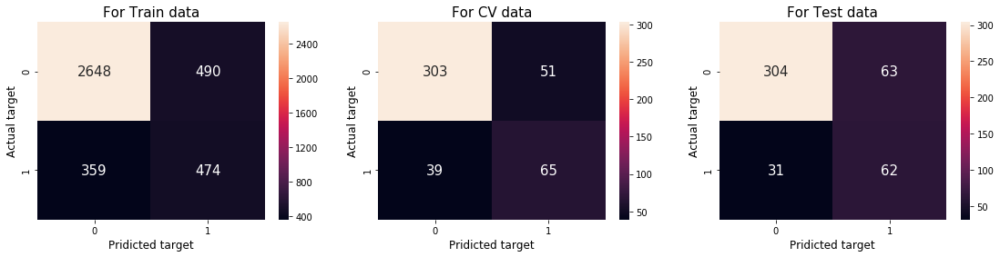

In [0]:
if os.path.isfile(model_path+"RF1.pkl"):
    with open(model_path+"RF1.pkl", 'rb') as f:
        best_model = pickle.load(f)

    tr, cv, te = report_model(best_model, X_train, X_cv, X_test,
                            uni_bow_train, uni_bow_cv, uni_bow_test, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["Random Forest", "BoW", "uni-gram", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")

#### **4.4.4.2 Bi-gram**

In [0]:
# tunning, training tunned model and saving it
best_model = return_best_model(X_train, X_cv, bi_bow_train,y_train, bi_bow_cv,
                 subgroups, actual_label, pred_label,
                 model_name="RF", path = model_path, gram = 2)

Tunning the parameters...
Done!
Time take to tune the parameter: 6796.0871 seconds.

Best parameters of tunned model is:
 {'n_estimators': 1000, 'max_depth': 20}

Best score of of tunned model is: 0.8802530726644575

Best model is:
 RandomForestClassifier(bootstrap=True, class_weight={0: 115467, 1: 1328432},
                       criterion='gini', max_depth=20, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=1000, n_jobs=-1, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)


Training the best model...
Tunning the parameters...
Done!
Time take to tune the parameter: 6796.0871 seconds.

Best parameters of tunned model is:
 {'n_estimators': 1000, 'max_depth': 20}

Best score of of tunned model is: 0.8802530726644575

Best model is:
 

Final metric for:
Train: 0.71693
CV: 0.69959
Test: 0.70062


Ploting Confusion matrix for whole data....



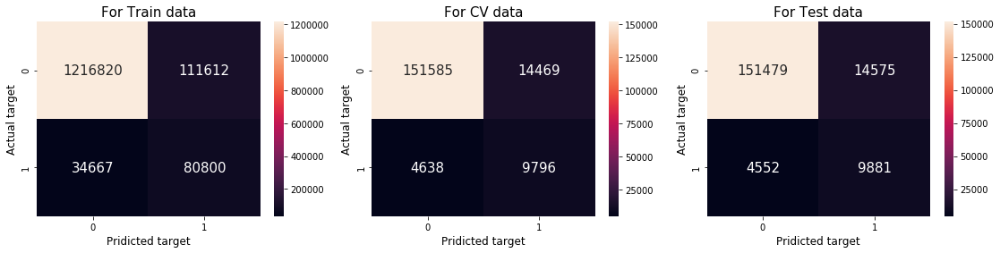



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


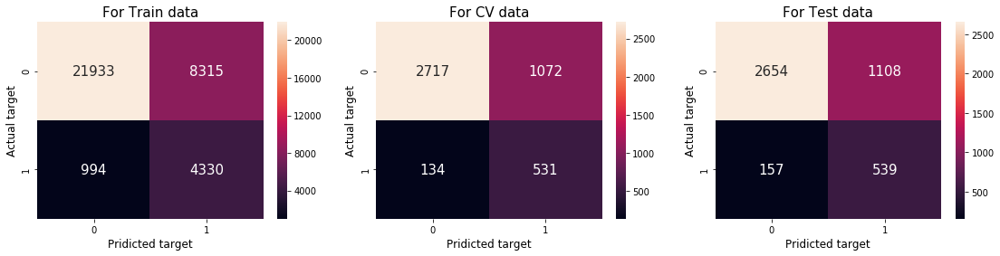




                                        *************** for 'female' identity ***************


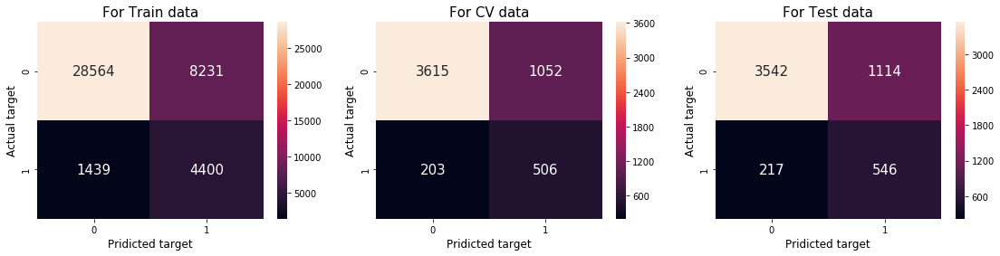




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


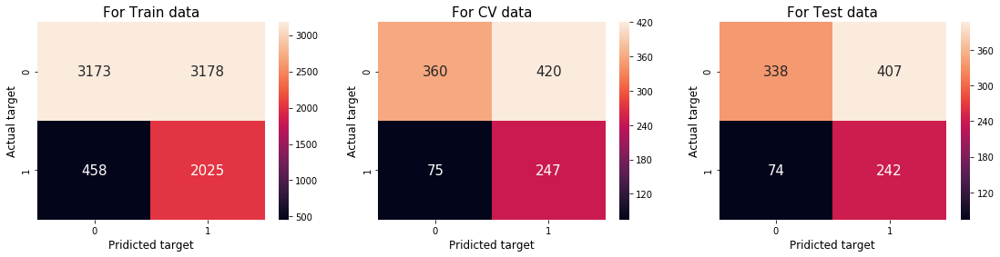




                                        *************** for 'christian' identity ***************


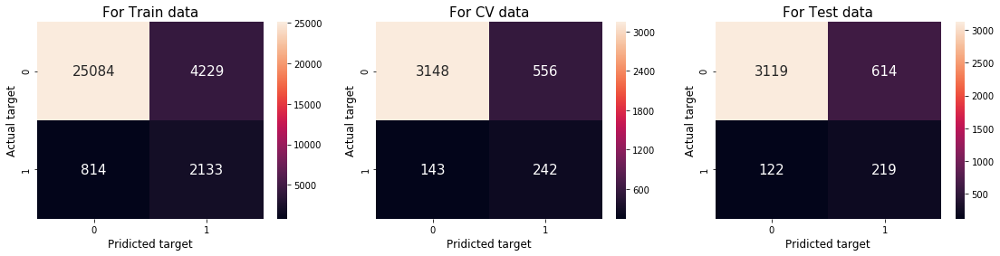




                                        *************** for 'jewish' identity ***************


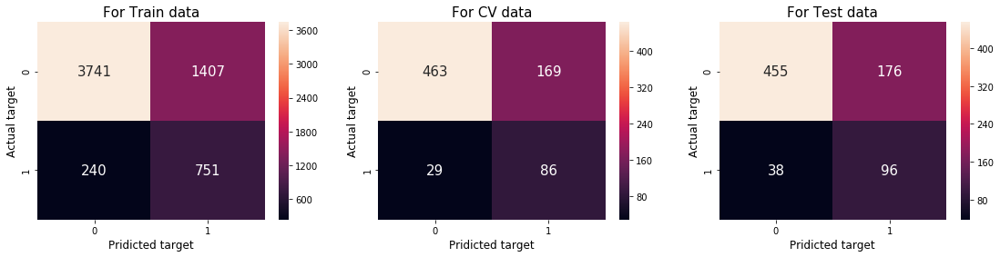




                                        *************** for 'muslim' identity ***************


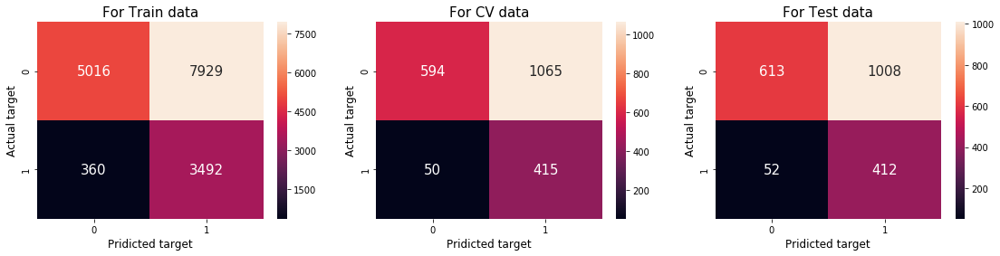




                                        *************** for 'black' identity ***************


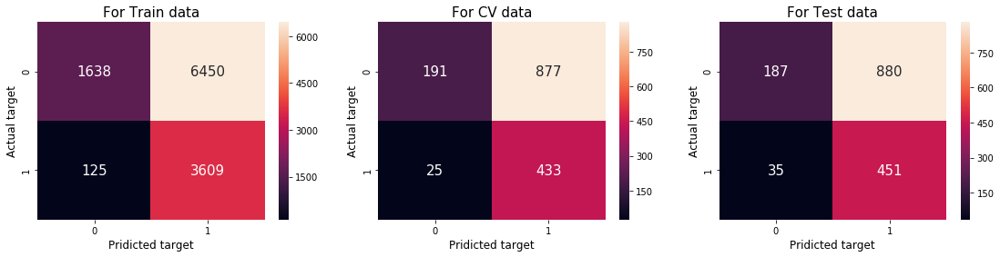




                                        *************** for 'white' identity ***************


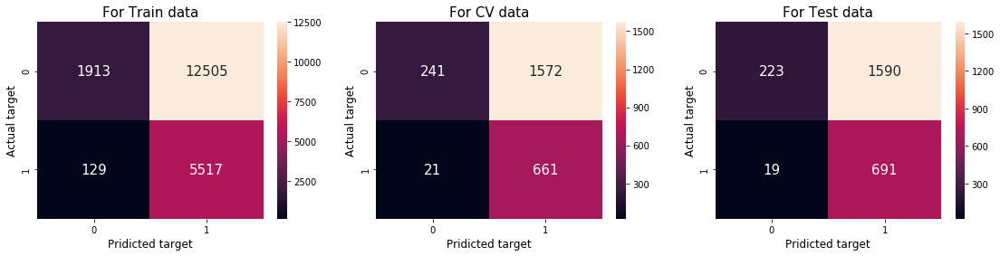




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


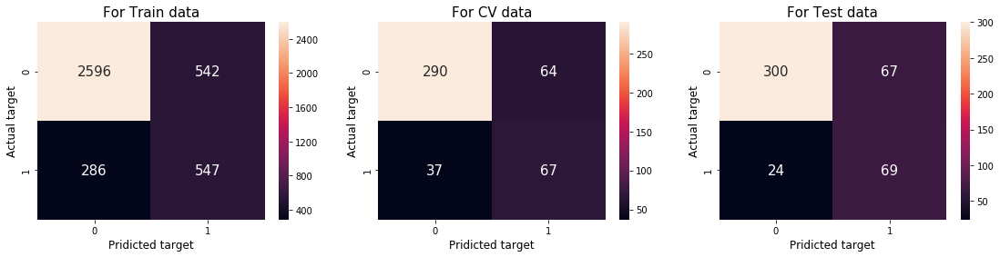

In [0]:
if os.path.isfile(model_path+"RF2.pkl"):
    with open(model_path+"RF2.pkl", 'rb') as f:
        best_model = pickle.load(f)

    tr, cv, te = report_model(best_model, X_train, X_cv, X_test,
                            bi_bow_train, bi_bow_cv, bi_bow_test, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["Random Forest", "BoW", "bi-gram", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")


## **4.5 DL Models**

From above I can say that **BoW: uni-gram** is doing much better job than other vectorizer. So I'll train one DL model with this vector and second DL model with word embedding. 

In [3]:
# import DL libraries
import tensorflow as tf
import keras
from keras.layers import Input, Conv1D, Dense, Activation, LSTM, Reshape, add
from keras.layers import SpatialDropout1D, concatenate, CuDNNGRU,CuDNNLSTM, Bidirectional
from keras.layers import BatchNormalization, Dropout, concatenate, Embedding
from keras.layers import Flatten, MaxPooling1D, GlobalMaxPooling1D, GlobalAveragePooling1D
from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer
from keras.models import Model, load_model
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.utils import plot_model

Using TensorFlow backend.


In [0]:
n_epochs = 40
batch_size = 1024

### **4.5.1 With BoW**

In [0]:
uni_bow_train = uni_bow_train.astype("float32")
uni_bow_cv    = uni_bow_cv.astype("float32")
uni_bow_test  = uni_bow_test.astype("float32")

In [6]:
# input
bow_input = Input(shape = (uni_bow_train.shape[1], ), name = "imput_layer")

# dense layer
X = Dense(units = 64, kernel_initializer = 'he_normal', name = "dense_1")(bow_input)
X = Activation("relu", name = "dense1_layer_activation")(X)
X = Dropout(0.4, name = "dropout_1")(X)

# dense layer
X = Dense(units = 32, kernel_initializer = 'he_normal', name = "dense_2")(X)
X = BatchNormalization(name = "BN_2")(X)
X = Activation("relu", name = "dense2_layer_activation")(X)
X = Dropout(0.3, name = "dropout_2")(X)

# dense layer
X = Dense(units = 16, kernel_initializer = 'he_normal', name = "dense_3")(X)
X = BatchNormalization(name = "BN_3")(X)
X = Activation("relu", name = "dense3_layer_activation")(X)
X = Dropout(0.3, name = "dropout_3")(X)

# dense layer
X = Dense(units = 8, kernel_initializer = 'he_normal', name = "dense_4")(X)
X = BatchNormalization(name = "BN_4")(X)
X = Activation("relu", name = "dense4_layer_activation")(X)

# output layer
out = Dense(1, activation='sigmoid', name = "output_layer")(X)

model = Model(inputs = bow_input, outputs = out, name = "Model_1")
print(model.summary())    

Model: "Model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
imput_layer (InputLayer)     (None, 10000)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                640064    
_________________________________________________________________
dense1_layer_activation (Act (None, 64)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
BN_2 (BatchNormalization)    (None, 32)                128       
_________________________________________________________________
dense2_layer_activation (Act (None, 32)                0   

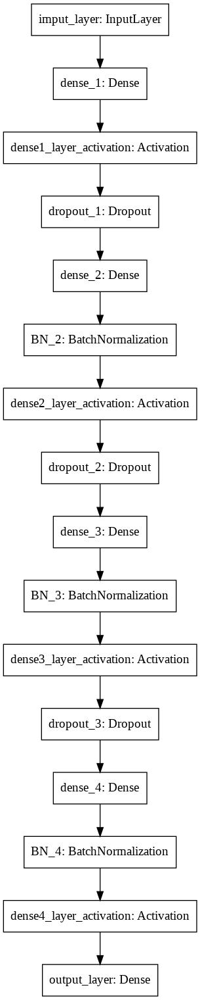

In [7]:
plot_model(model)

In [0]:
# https://machinelearningmastery.com/how-to-stop-training-deep-neural-networks-at-the-right-time-using-early-stopping/
# https://keras.io/callbacks/#earlystopping
# https://keras.io/callbacks/#modelcheckpoint
es = EarlyStopping(monitor = 'val_loss', mode = 'min', min_delta = 0.001, patience = 10, verbose = 1)
mc = ModelCheckpoint("Model_1.h5", monitor = "val_acc", mode = 'max', save_best_only = True, verbose = 1)

model.compile(loss='binary_crossentropy', optimizer = "rmsprop", metrics=['acc'])
model.fit(uni_bow_train, y_train, validation_data = (uni_bow_cv, y_cv),
          epochs = n_epochs, batch_size = batch_size, callbacks = [es, mc])

# del model
model

Train on 1443899 samples, validate on 180488 samples
Epoch 1/40
1443899/1443899 [==============================] - 45s 31us/step - loss: 0.2715 - acc: 0.9118 - val_loss: 0.1913 - val_acc: 0.9420

Epoch 00001: val_acc improved from -inf to 0.94203, saving model to Model_1.h5
Epoch 2/40
1443899/1443899 [==============================] - 45s 31us/step - loss: 0.1930 - acc: 0.9414 - val_loss: 0.1874 - val_acc: 0.9433

Epoch 00002: val_acc improved from 0.94203 to 0.94334, saving model to Model_1.h5
Epoch 3/40
1443899/1443899 [==============================] - 45s 31us/step - loss: 0.1891 - acc: 0.9427 - val_loss: 0.1901 - val_acc: 0.9430

Epoch 00003: val_acc did not improve from 0.94334
Epoch 4/40
1443899/1443899 [==============================] - 45s 31us/step - loss: 0.1870 - acc: 0.9436 - val_loss: 0.1882 - val_acc: 0.9433

Epoch 00004: val_acc did not improve from 0.94334
Epoch 5/40
1443899/1443899 [==============================] - 45s 31us/step - loss: 0.1854 - acc: 0.9444 - val_los

In [0]:
print("moving model to drive...")
!cp "/content/Model_1.h5" "/content/drive/My Drive/Colab Notebooks/Datasets/Personal Case Study/Jigsaw Unintended Bias in Toxicity Classification/Models/"

moving model to drive...


180487/180487 [==============================] - 3s 16us/step
Final metric for:
Train: 0.84092
CV: 0.80698
Test: 0.81312


Ploting Confusion matrix for whole data....



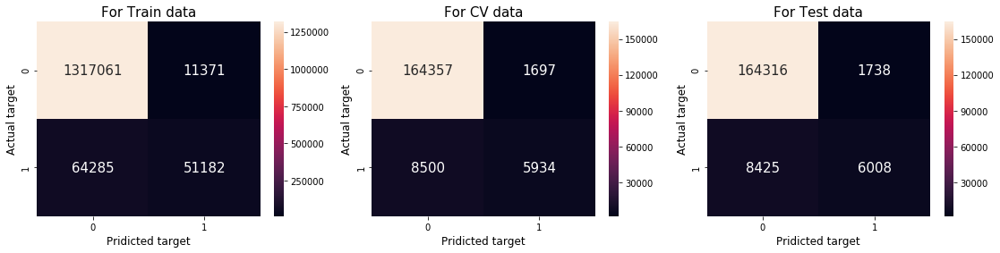



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


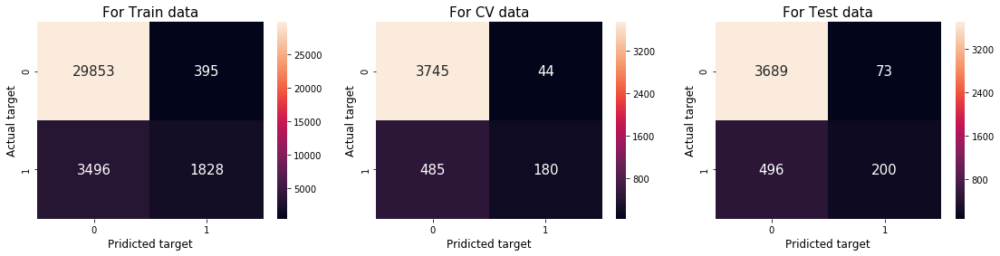




                                        *************** for 'female' identity ***************


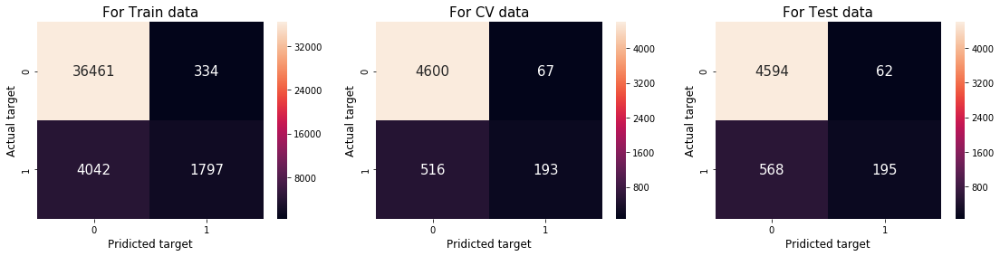




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


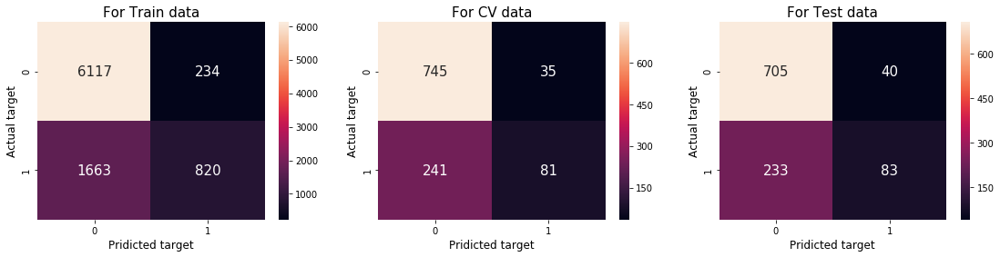




                                        *************** for 'christian' identity ***************


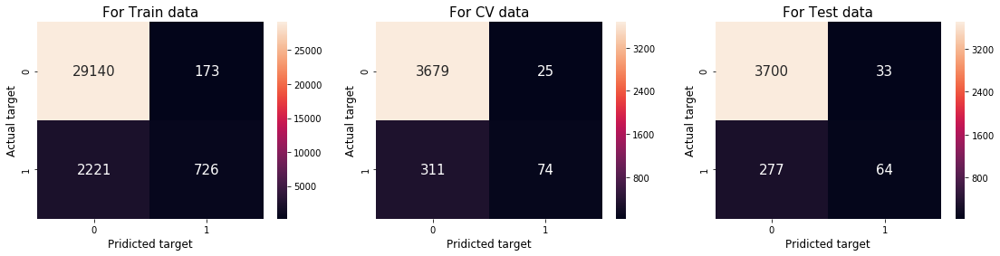




                                        *************** for 'jewish' identity ***************


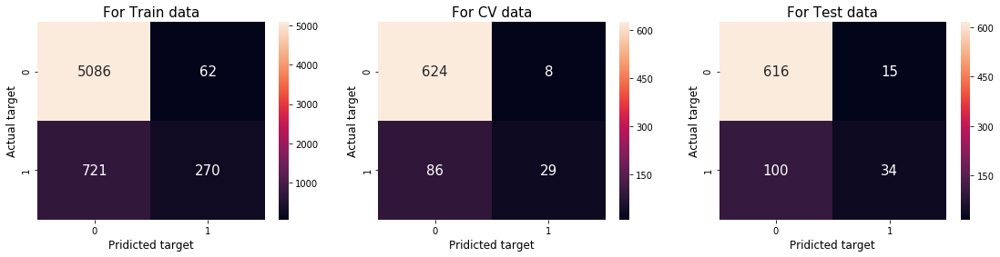




                                        *************** for 'muslim' identity ***************


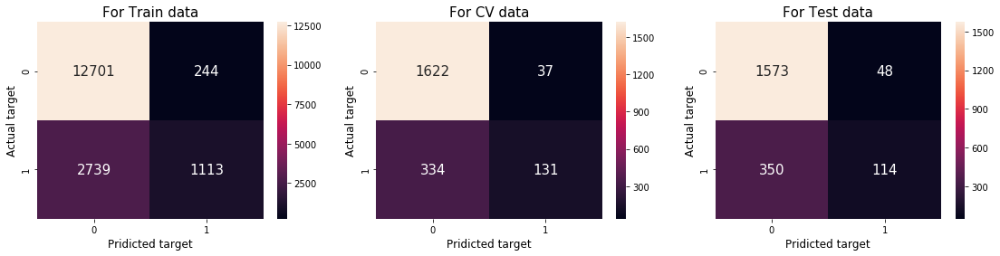




                                        *************** for 'black' identity ***************


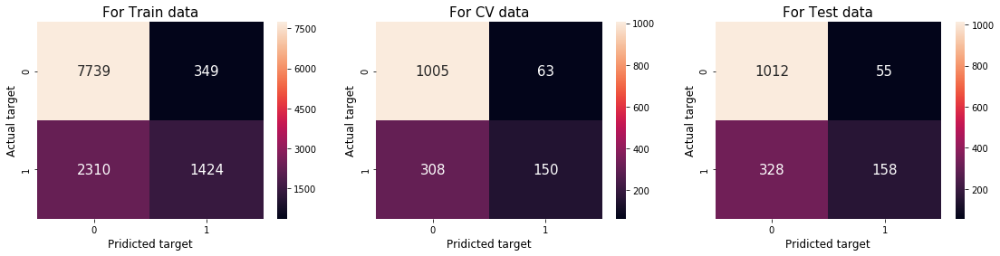




                                        *************** for 'white' identity ***************


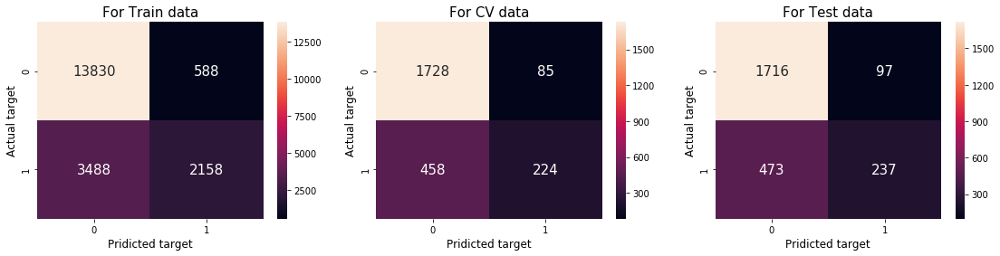




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


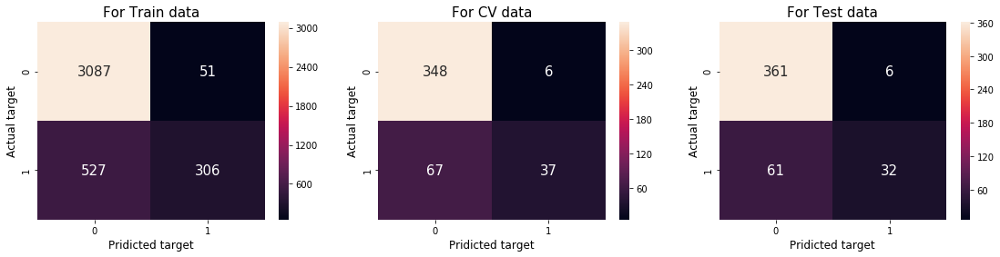

In [0]:
if os.path.isfile(model_path+"Model_1.h5"):
    best_model = load_model(model_path+"Model_1.h5")
    tr, cv, te = report_model1(best_model, X_train, X_cv, X_test,
                            uni_bow_train, uni_bow_cv, uni_bow_test, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["DL (Model-1)", "BoW", "uni-gram", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")


### **4.5.2 With Word Embedding**

**Create tikenizer**
>ref: pre-trained embedding: https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
 

In [0]:
def text_to_seq(texts, keras_tokenizer, max_len):
    """this function  return sequence of text after padding/truncating"""
    x = pad_sequences(keras_tokenizer.texts_to_sequences(texts),
                      maxlen = max_len, padding = 'post',truncating = 'post')
    return x

In [0]:
a = [len(i.split()) for i in X_train["comment_text"]]
print("maximum lenght of comment_text in train data is :", max(a))

maximum lenght of comment_text in train data is : 361


**NOTE:** But I'm taking maximum lenght of comment text = 400.

In [20]:
tokens = Tokenizer()
tokens.fit_on_texts(X_train["comment_text"].values)

max_lenght = 400

# padding the encoded data to make each datapoint of same dimension
encoded_text_train = text_to_seq(X_train["comment_text"].values, tokens, max_lenght)
encoded_text_cv    = text_to_seq(X_cv["comment_text"].values, tokens, max_lenght)
encoded_text_test  = text_to_seq(X_test["comment_text"].values, tokens, max_lenght)

print("Shape of train, cv and test {} features are: {}, {}, {}".format('comment_text',
                                                                       encoded_text_train.shape,
                                                                       encoded_text_cv.shape,
                                                                       encoded_text_test.shape))

# gettting the length of unique words in train data, and adding (+1) becasue of zeros padding and words are encoded from 1 to n
vocab_size = len(tokens.word_index) + 1
# below array will be used in Embedding layer
embedding_matrix1 = np.zeros((vocab_size, 200), dtype = 'float32')
for word, index in tokens.word_index.items():
    embedding_vector = w2v_loaded_dict.get(word)
    if embedding_vector is not None:
        embedding_matrix1[index] = embedding_vector

Shape of train, cv and test comment_text features are: (1443899, 400), (180488, 400), (180487, 400)


#### **4.5.2.1 Conv1d**

In [22]:
#clearing the graph
keras.backend.clear_session()

seq_input  = Input(shape = (max_lenght, ), name = "input_layer")
embed_text = Embedding(input_dim = vocab_size, output_dim = 200,
                            weights=[embedding_matrix1], input_length = max_lenght,
                            trainable = False, name = 'text_embedding')(seq_input)
x   = Conv1D(128, 2, activation='relu', padding='same', name = "conv_1d_1")(embed_text)
x   = MaxPooling1D(5, padding='same', name = "maxpool_1")(x)
x   = Conv1D(128, 3, activation='relu', padding='same', name = "conv_1d_2")(x)
x   = MaxPooling1D(5, padding='same', name = "maxpool_2")(x)
x   = Conv1D(128, 4, activation='relu', padding='same', name = "conv_1d_3")(x)
x   = MaxPooling1D(40, padding='same', name = "maxpool_3")(x)
x   = Flatten(name = "flatten_1")(x)
x   = Dropout(0.3, name = "dropout_1")(x)
x   = Dense(128, activation='relu', name = "dense_layer_1")(x)
out = Dense(1, activation='sigmoid', name = "output_layer")(x)

model = Model(inputs = seq_input, outputs = out, name = "Model_2")
print(model.summary())               

Model: "Model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     (None, 400)               0         
_________________________________________________________________
text_embedding (Embedding)   (None, 400, 200)          57010600  
_________________________________________________________________
conv_1d_1 (Conv1D)           (None, 400, 128)          51328     
_________________________________________________________________
maxpool_1 (MaxPooling1D)     (None, 80, 128)           0         
_________________________________________________________________
conv_1d_2 (Conv1D)           (None, 80, 128)           49280     
_________________________________________________________________
maxpool_2 (MaxPooling1D)     (None, 16, 128)           0         
_________________________________________________________________
conv_1d_3 (Conv1D)           (None, 16, 128)           6566

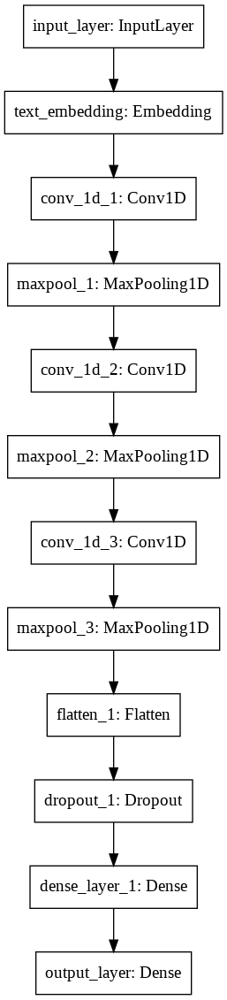

In [23]:
plot_model(model)

In [0]:
es = EarlyStopping(monitor = 'val_loss', mode = 'min', min_delta = 0.001, patience = 10, verbose = 1)
mc = ModelCheckpoint("Model_2.h5", monitor = "val_acc", mode = 'max', save_best_only = True, verbose = 1)

model.compile(loss='binary_crossentropy', optimizer = "rmsprop", metrics=['acc'])
model.fit(encoded_text_train, y_train, validation_data = (encoded_text_cv, y_cv),
          epochs = n_epochs, batch_size = batch_size, callbacks = [es, mc])

# del model
model

Train on 1443899 samples, validate on 180488 samples
Epoch 1/40
1443899/1443899 [==============================] - 79s 55us/step - loss: 0.1743 - acc: 0.9382 - val_loss: 0.1763 - val_acc: 0.9410

Epoch 00001: val_acc improved from -inf to 0.94103, saving model to Model_2.h5
Epoch 2/40
1443899/1443899 [==============================] - 79s 55us/step - loss: 0.1501 - acc: 0.9449 - val_loss: 0.1617 - val_acc: 0.9418

Epoch 00002: val_acc improved from 0.94103 to 0.94182, saving model to Model_2.h5
Epoch 3/40
1443899/1443899 [==============================] - 79s 54us/step - loss: 0.1446 - acc: 0.9463 - val_loss: 0.1660 - val_acc: 0.9421

Epoch 00003: val_acc improved from 0.94182 to 0.94215, saving model to Model_2.h5
Epoch 4/40
1443899/1443899 [==============================] - 79s 55us/step - loss: 0.1409 - acc: 0.9472 - val_loss: 0.1512 - val_acc: 0.9460

Epoch 00004: val_acc improved from 0.94215 to 0.94603, saving model to Model_2.h5
Epoch 5/40
1443899/1443899 [======================

In [0]:
print("moving model to drive...")
!cp "/content/Model_2.h5" "/content/drive/My Drive/Colab Notebooks/Datasets/Personal Case Study/Jigsaw Unintended Bias in Toxicity Classification/Models/"

moving model to drive...


180487/180487 [==============================] - 4s 21us/step
Final metric for:
Train: 0.91894
CV: 0.89070
Test: 0.89220


Ploting Confusion matrix for whole data....



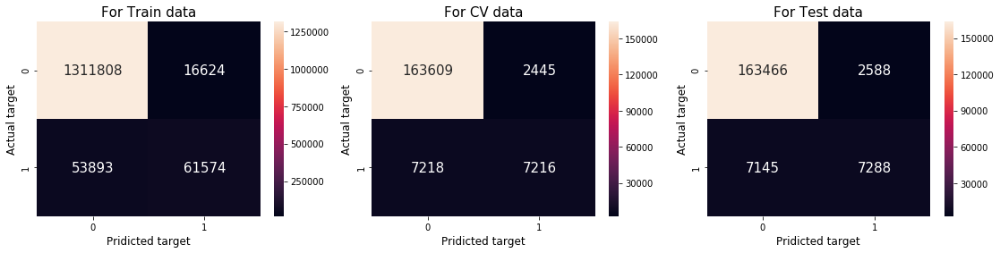



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


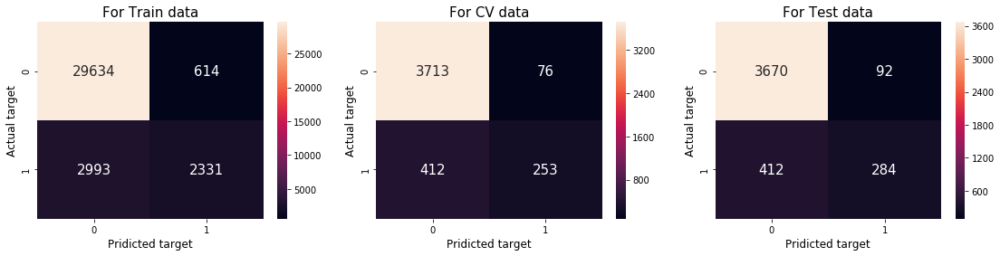




                                        *************** for 'female' identity ***************


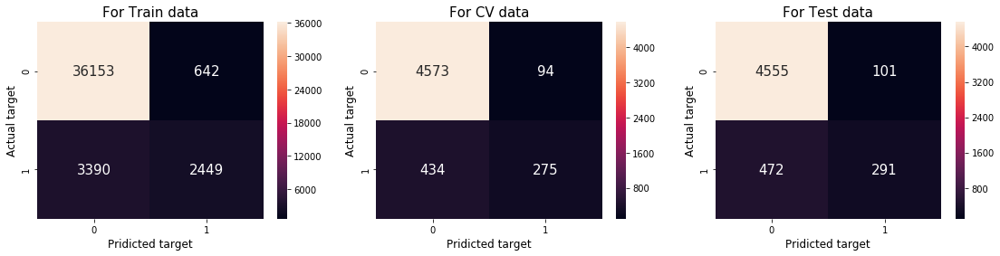




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


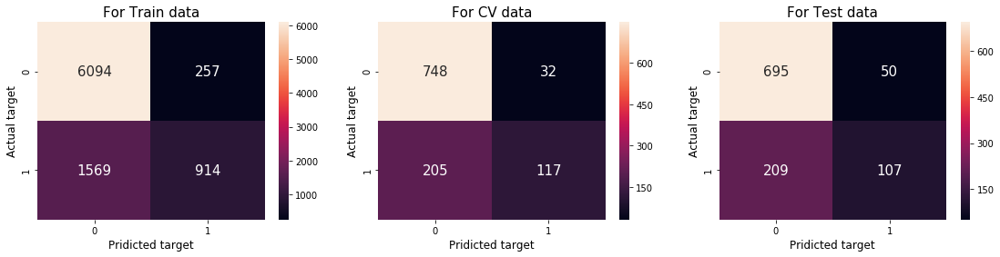




                                        *************** for 'christian' identity ***************


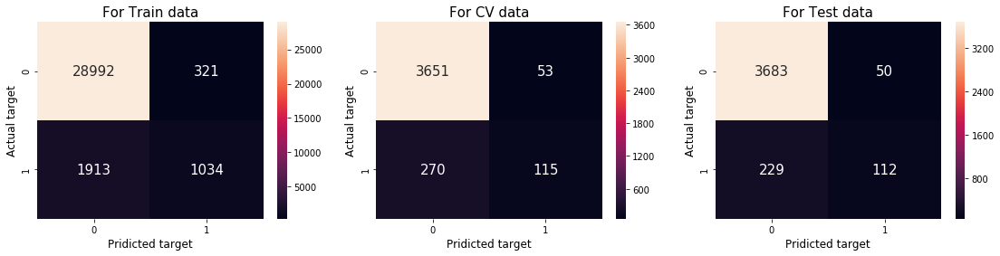




                                        *************** for 'jewish' identity ***************


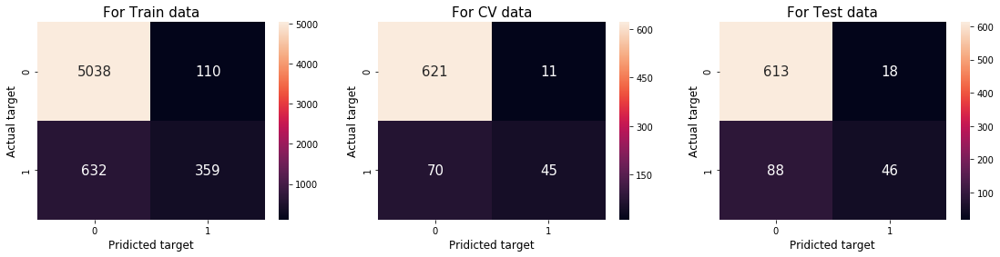




                                        *************** for 'muslim' identity ***************


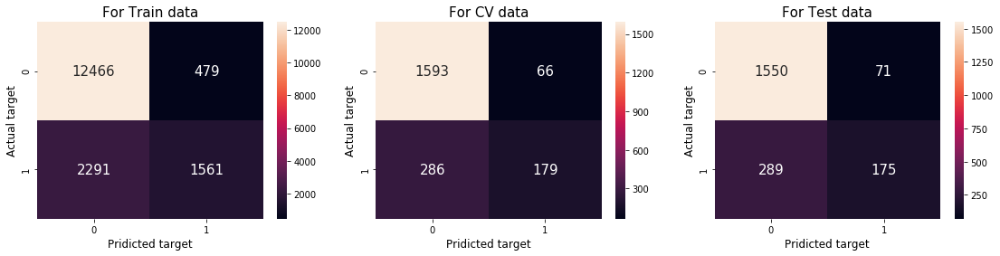




                                        *************** for 'black' identity ***************


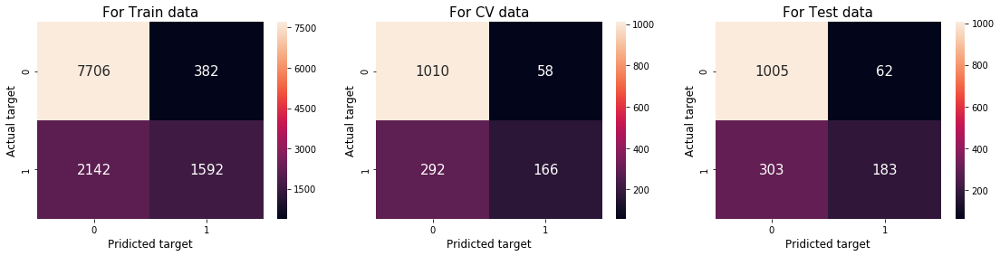




                                        *************** for 'white' identity ***************


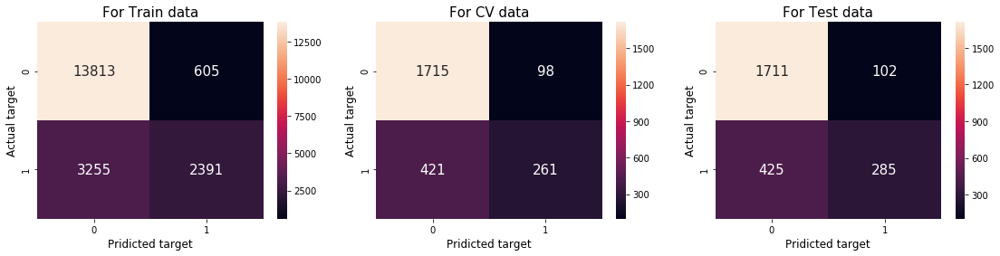




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


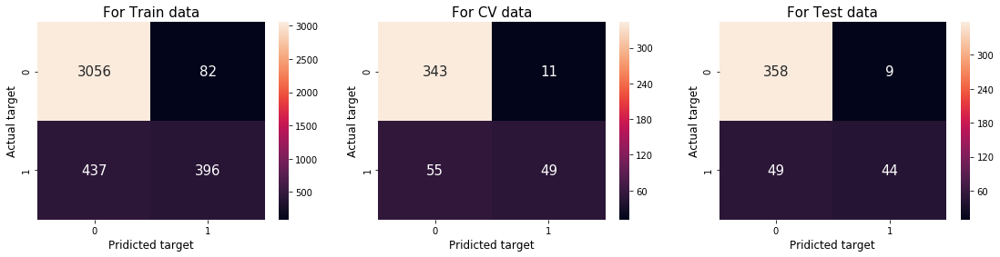

In [0]:
if os.path.isfile(model_path+"Model_2.h5"):
    best_model = load_model(model_path+"Model_2.h5")
    tr, cv, te = report_model1(best_model, X_train, X_cv, X_test,
                            encoded_text_train, encoded_text_cv, encoded_text_test, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["DL (Model-2)", "Word Embedding", "None", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")


#### **4.5.2.2 With 2-LSTM and Dense layers**

In [24]:
#clearing the graph
keras.backend.clear_session()

# input layer
seq_input  = Input(shape = (max_lenght, ), name = "input_layer")

# embedding layer
embed_text = Embedding(input_dim = vocab_size, output_dim = 200,
                            weights=[embedding_matrix1], input_length = max_lenght,
                            trainable = False, name = 'text_embedding')(seq_input)

# lstm layer
# https://github.com/keras-team/keras/issues/5222#issuecomment-276563109
X = LSTM(units = 16, dropout = 0.3, recurrent_dropout = 0.3, return_sequences=True,
         name = "lstm_layer_1")(embed_text) 

# lstm layer
X = LSTM(units = 8, dropout = 0.2, recurrent_dropout = 0.2, return_sequences=True,
            name = "lstm_layer_2")(X)

# flatten layer
X = Flatten(name = "flatten_1")(X)

# Dense layer
X = Dense(units = 32, kernel_initializer = 'he_normal', name = "dense_1")(X)
X = BatchNormalization(name = "BN_1")(X)
X = Activation("relu", name = "dense1_layer_activation")(X)
X = Dropout(0.3, name = "dropout_1")(X)

# dense layer
X = Dense(units = 16, kernel_initializer = 'he_normal', name = "dense_2")(X)
X = BatchNormalization(name = "BN_2")(X)
X = Activation("relu", name = "dense2_layer_activation")(X)
X = Dropout(0.3, name = "dropout_2")(X)

#dense layer
X = Dense(units = 8, kernel_initializer = 'he_normal', name = "dense_3")(X)
X = BatchNormalization(name = "BN_3")(X)
X = Activation("relu", name = "dense3_layer_activation")(X)

# output layer
out = Dense(units = 1, activation = "sigmoid", name = "output_layer")(X)

# model
model = Model(inputs = seq_input, outputs = out, name = "model_3")

print(model.summary())

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     (None, 400)               0         
_________________________________________________________________
text_embedding (Embedding)   (None, 400, 200)          57010600  
_________________________________________________________________
lstm_layer_1 (LSTM)          (None, 400, 16)           13888     
_________________________________________________________________
lstm_layer_2 (LSTM)          (None, 400, 8)            800       
_________________________________________________________________
flatten_1 (Flatten)          (None, 3200)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                102432    
_________________________________________________________________
BN_1 (BatchNormalization)    (None, 32)                128 

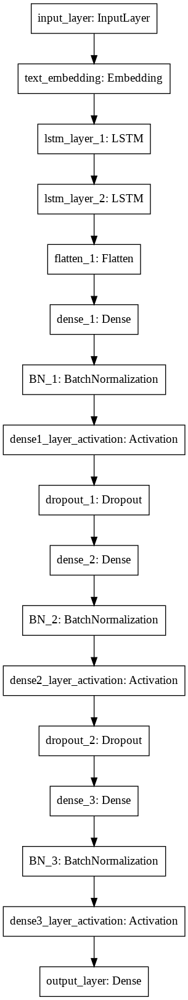

In [25]:
plot_model(model)

In [0]:
es = EarlyStopping(monitor = 'val_loss', mode = 'min', min_delta = 0.001, patience = 6, verbose = 1)
mc = ModelCheckpoint("Model_3.h5", monitor = "val_acc", mode = 'max', save_best_only = True, verbose = 1)

model.compile(loss='binary_crossentropy', optimizer = "rmsprop", metrics=['acc'])
model.fit(encoded_text_train, y_train, validation_data = (encoded_text_cv, y_cv),
          epochs = 12, batch_size = 4048, callbacks = [es, mc])

# del model
model

Train on 1443899 samples, validate on 180488 samples
Epoch 1/12
1443899/1443899 [==============================] - 706s 489us/step - loss: 0.2631 - acc: 0.9196 - val_loss: 0.1755 - val_acc: 0.9376

Epoch 00001: val_acc improved from -inf to 0.93756, saving model to Model_3.h5
Epoch 2/12
1443899/1443899 [==============================] - 711s 492us/step - loss: 0.1823 - acc: 0.9356 - val_loss: 0.1631 - val_acc: 0.9416

Epoch 00002: val_acc improved from 0.93756 to 0.94156, saving model to Model_3.h5
Epoch 3/12
1443899/1443899 [==============================] - 701s 486us/step - loss: 0.1710 - acc: 0.9387 - val_loss: 0.1581 - val_acc: 0.9428

Epoch 00003: val_acc improved from 0.94156 to 0.94285, saving model to Model_3.h5
Epoch 4/12
1443899/1443899 [==============================] - 681s 472us/step - loss: 0.1650 - acc: 0.9403 - val_loss: 0.1562 - val_acc: 0.9433

Epoch 00004: val_acc improved from 0.94285 to 0.94334, saving model to Model_3.h5
Epoch 5/12
1443899/1443899 [==============

In [0]:
print("moving model to drive...")
!cp "/content/Model_3.h5" "/content/drive/My Drive/Colab Notebooks/Datasets/Personal Case Study/Jigsaw Unintended Bias in Toxicity Classification/Models/"

moving model to drive...
moving model to drive...


180487/180487 [==============================] - 12s 66us/step
Final metric for:
Train: 0.89346
CV: 0.88878
Test: 0.88976


Ploting Confusion matrix for whole data....



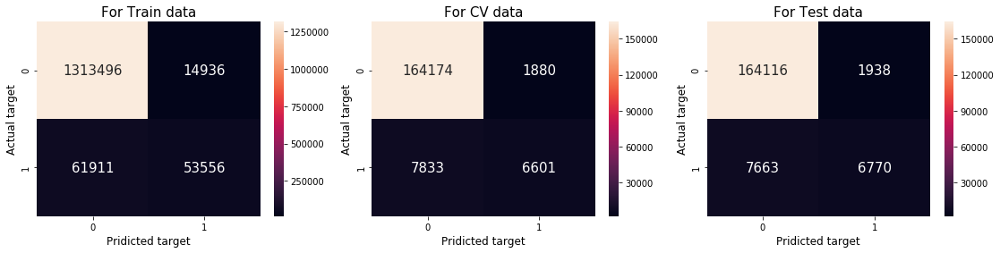



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


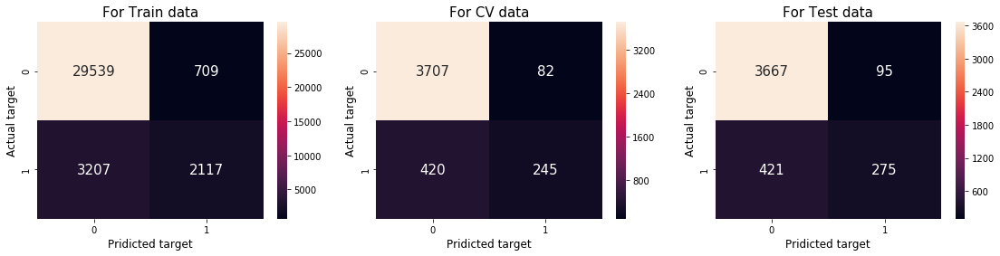




                                        *************** for 'female' identity ***************


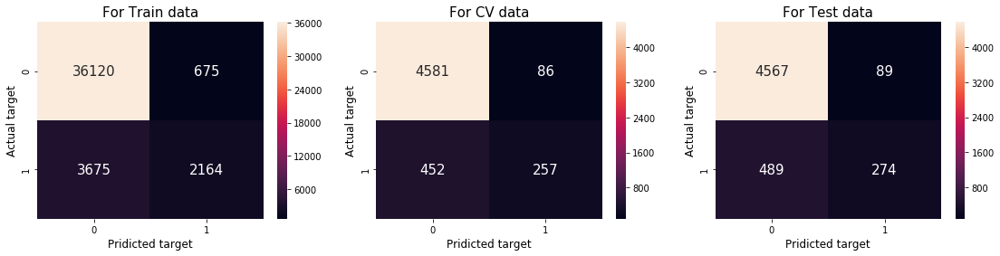




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


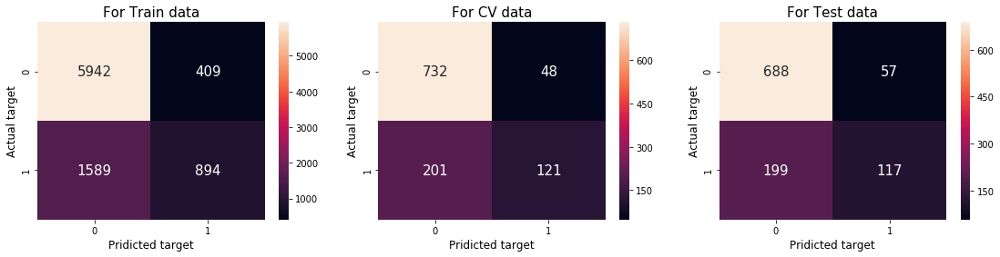




                                        *************** for 'christian' identity ***************


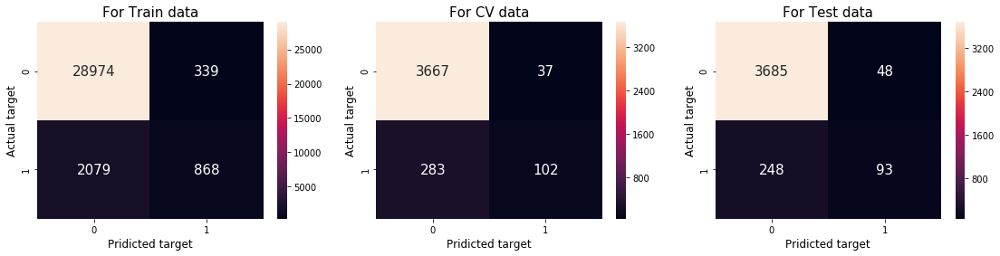




                                        *************** for 'jewish' identity ***************


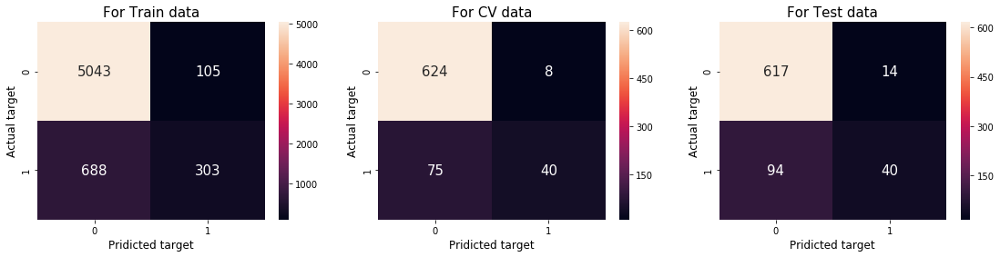




                                        *************** for 'muslim' identity ***************


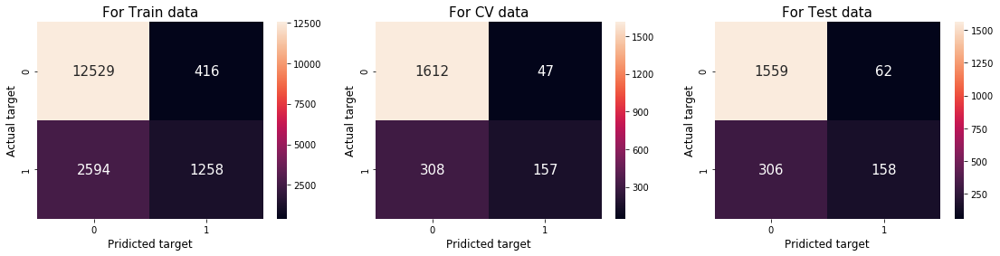




                                        *************** for 'black' identity ***************


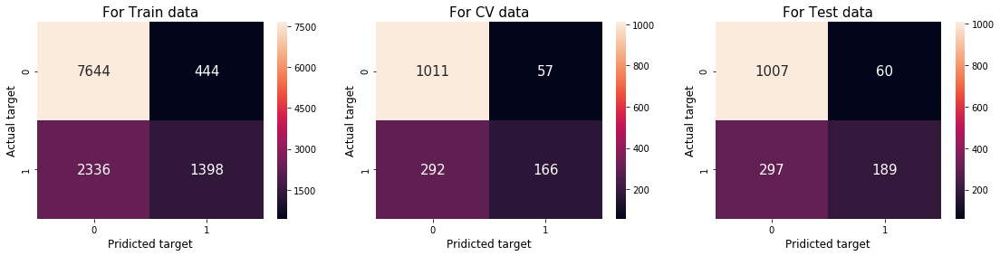




                                        *************** for 'white' identity ***************


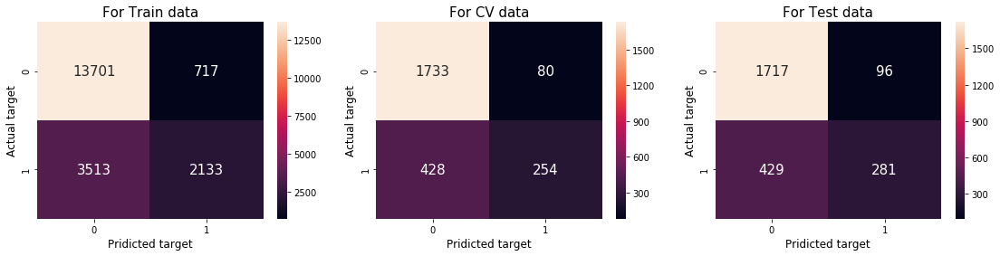




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


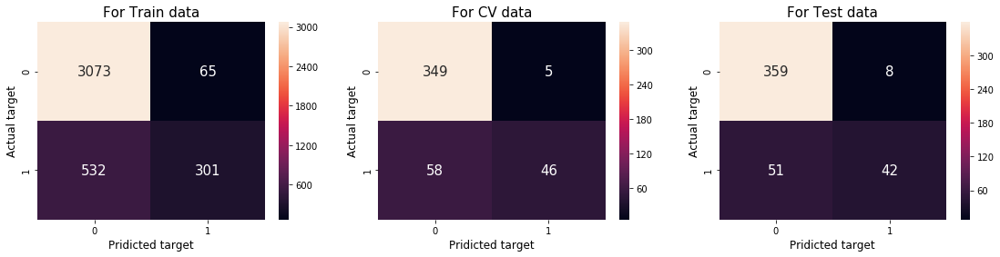

In [0]:
if os.path.isfile(model_path+"Model_3.h5"):
    best_model = load_model(model_path+"Model_3.h5")
    tr, cv, te = report_model1(best_model, X_train, X_cv, X_test,
                            encoded_text_train, encoded_text_cv, encoded_text_test, 
                            subgroups, actual_label, pred_label)
    model_perf.add_row(["DL (Model-3)", "Word Embedding", "None", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")


#### **4.5.2.3 Bidirection RNN model**

> Code Reference: https://www.theseus.fi/bitstream/handle/10024/226938/Quan_Do.pdf

In [26]:
#clearing the graph
keras.backend.clear_session()

input_s = Input(shape=(max_lenght,))
grn_s = Embedding(input_dim = vocab_size, output_dim = 200,
                  weights=[embedding_matrix1],input_length = max_lenght,
                  trainable=False)(input_s)

grn_s = Bidirectional(CuDNNGRU(128, return_sequences=True), name = "bidirectional_1")(grn_s)

grn_s = Bidirectional(CuDNNGRU(128, return_sequences=True), name = "bidirectional_2")(grn_s)

hidden = concatenate([GlobalMaxPooling1D()(grn_s),GlobalAveragePooling1D()(grn_s),], name = "concatenate_1")

hidden = add([hidden, Dense(512, activation='relu')(hidden)])

hidden = add([hidden, Dense(512, activation='relu')(hidden)])

out = Dense(1, activation='sigmoid', name = "output_layer")(hidden)

model = Model(inputs=input_s, outputs = out, name = "Model_4")
print(model.summary())

Model: "Model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 400)          0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 400, 200)     57010600    input_1[0][0]                    
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) (None, 400, 256)     253440      embedding_1[0][0]                
__________________________________________________________________________________________________
bidirectional_2 (Bidirectional) (None, 400, 256)     296448      bidirectional_1[0][0]            
____________________________________________________________________________________________

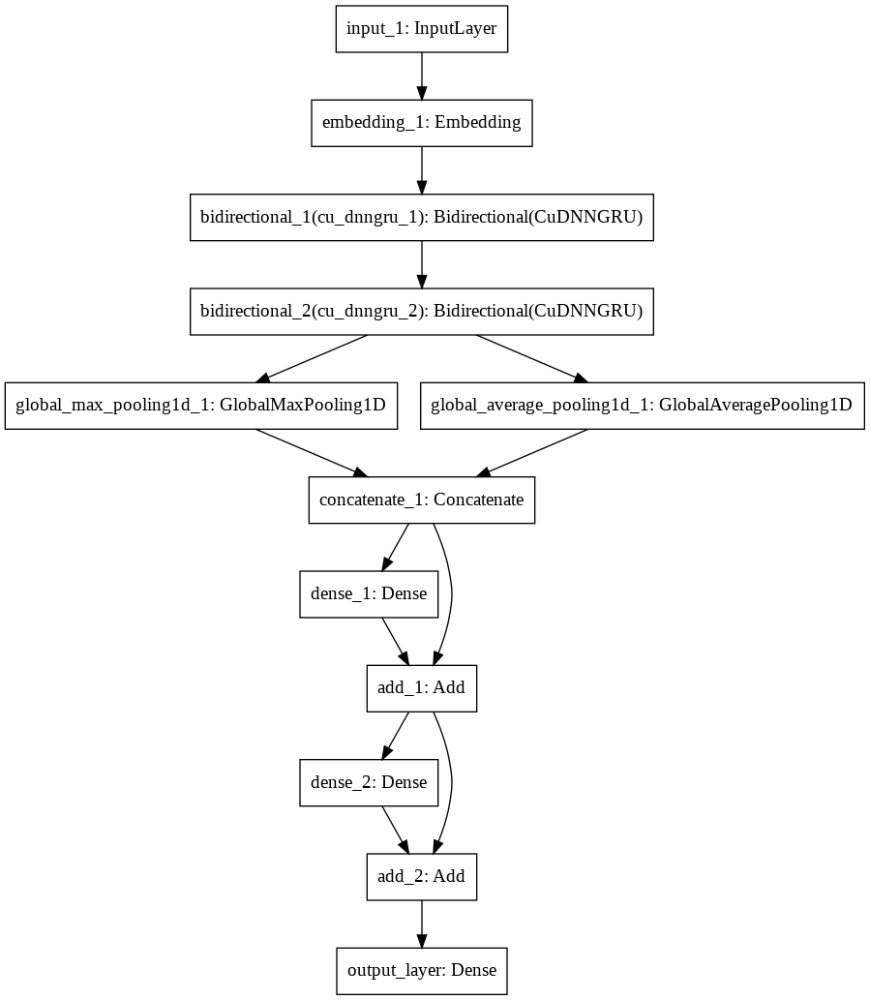

In [27]:
plot_model(model)

In [0]:
es = EarlyStopping(monitor = 'val_loss', mode = 'min', min_delta = 0.001, patience = 5, verbose = 1)
mc = ModelCheckpoint("Model_4.h5", monitor = "val_acc", mode = 'max', save_best_only = True, verbose = 1)

model.compile(loss='binary_crossentropy', optimizer = "adam", metrics=['acc'])
model.fit(encoded_text_train, y_train, validation_data = (encoded_text_cv, y_cv),
          epochs = 15, batch_size = batch_size, callbacks = [es, mc])

# del model
del model

Train on 1443899 samples, validate on 180488 samples
Epoch 1/15
1443899/1443899 [==============================] - 642s 445us/step - loss: 0.1533 - acc: 0.9441 - val_loss: 0.1443 - val_acc: 0.9459

Epoch 00001: val_acc improved from -inf to 0.94587, saving model to Model_4.h5
Epoch 2/15
1443899/1443899 [==============================] - 644s 446us/step - loss: 0.1367 - acc: 0.9485 - val_loss: 0.1387 - val_acc: 0.9480

Epoch 00002: val_acc improved from 0.94587 to 0.94804, saving model to Model_4.h5
Epoch 3/15
1001472/1443899 [===================>..........] - ETA: 3:07 - loss: 0.1303 - acc: 0.9503Train on 1443899 samples, validate on 180488 samples
Epoch 1/15
1443899/1443899 [==============================] - 642s 445us/step - loss: 0.1533 - acc: 0.9441 - val_loss: 0.1443 - val_acc: 0.9459

Epoch 00001: val_acc improved from -inf to 0.94587, saving model to Model_4.h5
Epoch 2/15
1443899/1443899 [==============================] - 644s 446us/step - loss: 0.1367 - acc: 0.9485 - val_loss: 

In [0]:
print("moving model to drive...")
!cp "/content/Model_4.h5" "/content/drive/My Drive/Colab Notebooks/Datasets/Personal Case Study/Jigsaw Unintended Bias in Toxicity Classification/Models/"

moving model to drive...
moving model to drive...
moving model to drive...
moving model to drive...


176128/180487 [============================>.] - ETA: 0sFinal metric for:
Train: 0.93077
CV: 0.89959
Test: 0.90233


Ploting Confusion matrix for whole data....



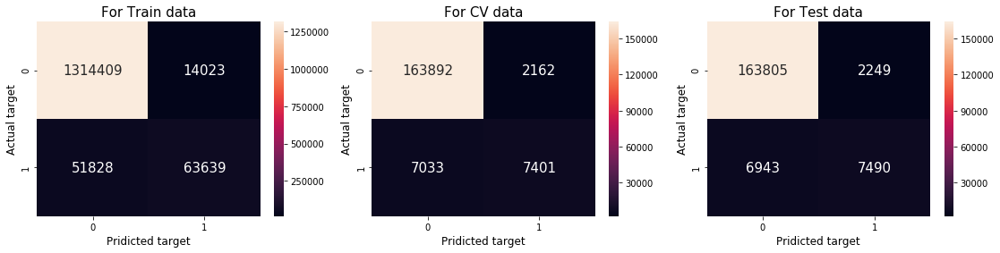



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


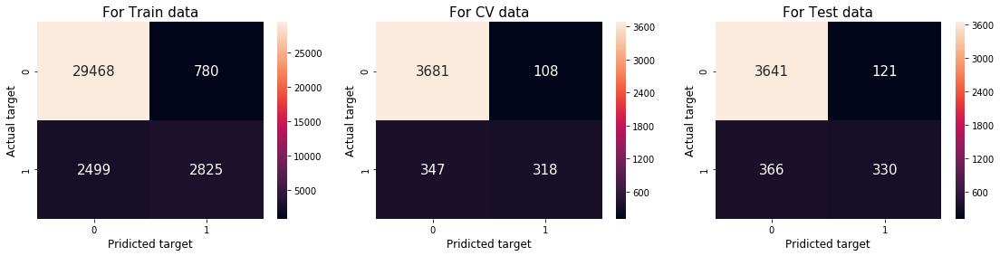




                                        *************** for 'female' identity ***************


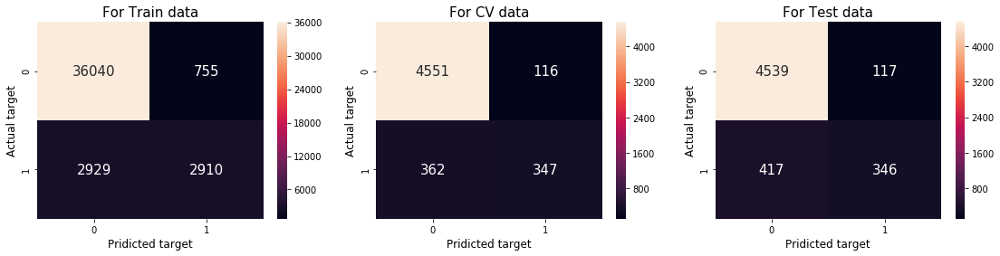




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


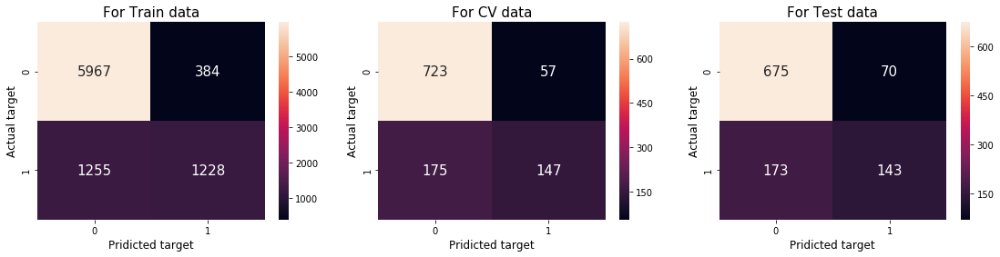




                                        *************** for 'christian' identity ***************


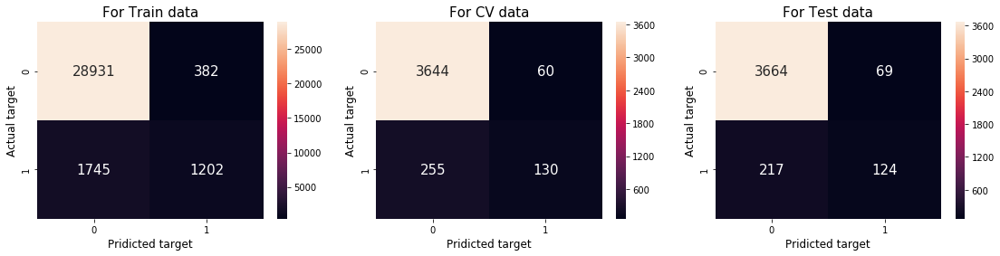




                                        *************** for 'jewish' identity ***************


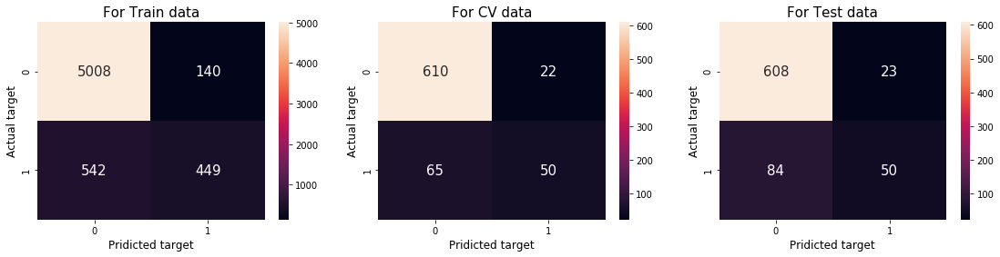




                                        *************** for 'muslim' identity ***************


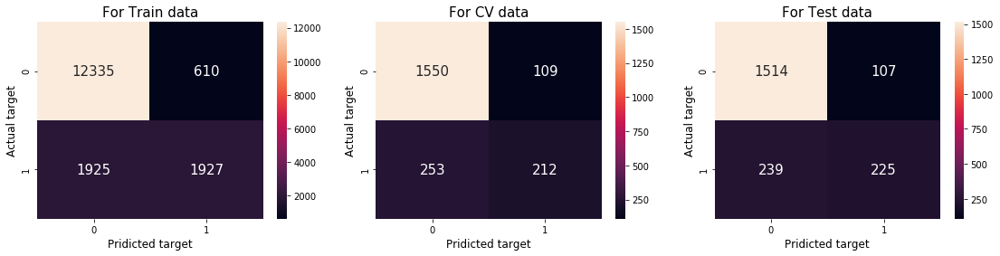




                                        *************** for 'black' identity ***************


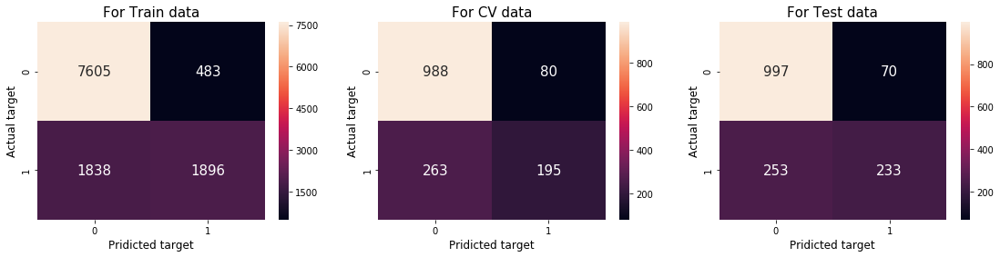




                                        *************** for 'white' identity ***************


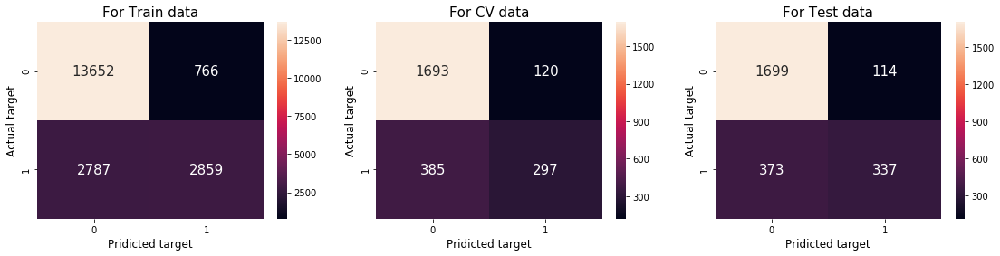




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


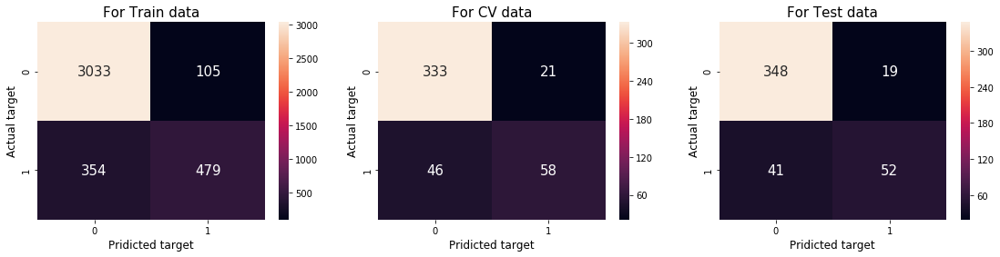

In [0]:
if os.path.isfile(model_path+"Model_4.h5"):
    best_model = load_model(model_path+"Model_4.h5")
    tr, cv, te = report_model1(best_model, X_train, X_cv, X_test,
                            encoded_text_train, encoded_text_cv, encoded_text_test, 
                            subgroups, actual_label, pred_label, batch_size = 1024)
    model_perf.add_row(["DL (Model-4)", "Word Embedding", "None", tr, cv, te])
else:
    print("Tunned model is not is not in disk. Run above cell.")


## **4.6 Stacking Few Models**

* In this section I'll stack the all three DL models along with GBDT and logistic regression (BoW-unigram).
* I'll give them wieghtage as they are performing on test dataset.

In [0]:
# laoding the DL models
print("Loading the DL models...")
model_1 = load_model(model_path+"Model_1.h5")
model_2 = load_model(model_path+"Model_2.h5")
model_3 = load_model(model_path+"Model_3.h5")
model_4 = load_model(model_path+"Model_4.h5")

print("laoding the ML models...")
with open(model_path+"GBDT1.pkl", "rb") as f:
    model_5 = pickle.load(f)
    
with open(model_path+"log_reg1.pkl", "rb") as f:
    model_6 = pickle.load(f)

Loading the DL models...
laoding the ML models...


In [0]:
# mdoel_1 prediction
print("\npredicting for model_1...\n")
y_pred_tr_1 = model_1.predict(uni_bow_train, batch_size = 8192, verbose=1)
y_pred_cv_1 = model_1.predict(uni_bow_cv, batch_size = 8192, verbose=1)
y_pred_te_1 = model_1.predict(uni_bow_test, batch_size = 8192, verbose=1)

# mdoel_2 prediction
print("\npredicting for model_2...\n")
y_pred_tr_2 = model_2.predict(encoded_text_train, batch_size = 8192, verbose=1)
y_pred_cv_2 = model_2.predict(encoded_text_cv, batch_size = 8192, verbose=1)
y_pred_te_2 = model_2.predict(encoded_text_test, batch_size = 8192, verbose=1)

# mdoel_3 prediction
print("\npredicting for model_3...\n")
y_pred_tr_3 = model_3.predict(encoded_text_train, batch_size = 8192, verbose=1)
y_pred_cv_3 = model_3.predict(encoded_text_cv, batch_size = 8192, verbose=1)
y_pred_te_3 = model_3.predict(encoded_text_test, batch_size = 8192, verbose=1)

# mdoel_4 prediction
print("\npredicting for model_3...\n")
y_pred_tr_4 = model_4.predict(encoded_text_train, batch_size = 1024, verbose=1)
y_pred_cv_4 = model_4.predict(encoded_text_cv, batch_size = 1024, verbose=1)
y_pred_te_4 = model_4.predict(encoded_text_test, batch_size = 1024, verbose=1)


# model_6 prediction
print("\npredicting for model_5...\n")
y_pred_tr_6 = model_5.predict(train_bow_uni)
y_pred_cv_6 = model_5.predict(cv_bow_uni)
y_pred_te_6 = model_5.predict(test_bow_uni)


train_bow_uni = train_bow_uni.astype("float64")
cv_bow_uni    = cv_bow_uni.astype("float64")
test_bow_uni  = test_bow_uni.astype("float64")

# model_5 prediction
print("\npredicting for model_4...\n")
y_pred_tr_5 = model_5.predict(train_bow_uni)
y_pred_cv_5 = model_5.predict(cv_bow_uni)
y_pred_te_5 = model_5.predict(test_bow_uni)

tr = [y_pred_tr_1, y_pred_tr_2, y_pred_tr_3, y_pred_tr_4, y_pred_tr_5, y_pred_tr_6]
cv = [y_pred_cv_1, y_pred_cv_2, y_pred_cv_3, y_pred_cv_4, y_pred_cv_5, y_pred_cv_6]
te = [y_pred_te_1, y_pred_te_2, y_pred_te_3, y_pred_te_4, y_pred_te_5, y_pred_te_6]

In [0]:
def report_stacked_mode():
    alphas = [2*0.81, 2.5*0.88, 4*0.89, 5.5*0.90, 1.2*0.78, 1.1*0.77]

    # define arrays of zeros to store above predicted values
    a = np.zeros((X_train.shape[0], 6))
    b = np.zeros((X_cv.shape[0], 6))
    c = np.zeros((X_test.shape[0], 6))

    # storing with wieghtage
    for i in range(6):
        a[:,i] = alphas[i] * tr[i].flatten()/sum(alphas)
        b[:,i] = alphas[i] * cv[i].flatten()/sum(alphas)
        c[:,i] = alphas[i] * te[i].flatten()/sum(alphas)

    # final prediction
    X_train["pred_target"] = np.sum(a, axis = 1)
    X_cv["pred_target"]    = np.sum(b, axis = 1)
    X_test["pred_target"]  = np.sum(c, axis = 1)

    final_train_auc, _ = return_final_metric(X_train, subgroups, actual_label, pred_label, verbose = False)
    final_cv_auc, _ = return_final_metric(X_cv, subgroups, actual_label, pred_label, verbose = False)
    final_test_auc, _ = return_final_metric(X_test, subgroups, actual_label, pred_label, verbose = False)

    print("Final metric for:\nTrain: {:.5f}\nCV: {:.5f}\nTest: {:.5f}".format(final_train_auc,
                                                                              final_cv_auc,
                                                                              final_test_auc))

    print("\n\nPloting Confusion matrix for whole data....\n")
    plot_confusion_matrix(X_train, X_cv, X_test)
    
    print("\n\nPlotting confusion matrix indentity-wise ...\n")
    plot_confusion_for_each_identity(X_train, X_cv, X_test, subgroups)

    return final_train_auc, final_cv_auc, final_test_auc

Final metric for:
Train: 0.92699
CV: 0.90330
Test: 0.90481


Ploting Confusion matrix for whole data....



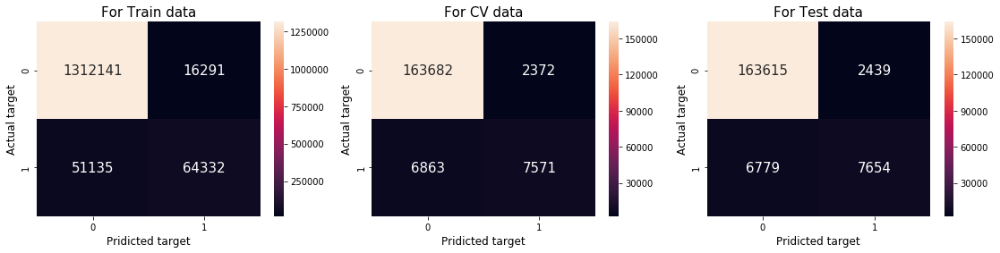



Plotting confusion matrix indentity-wise ...

                                        *************** for 'male' identity ***************


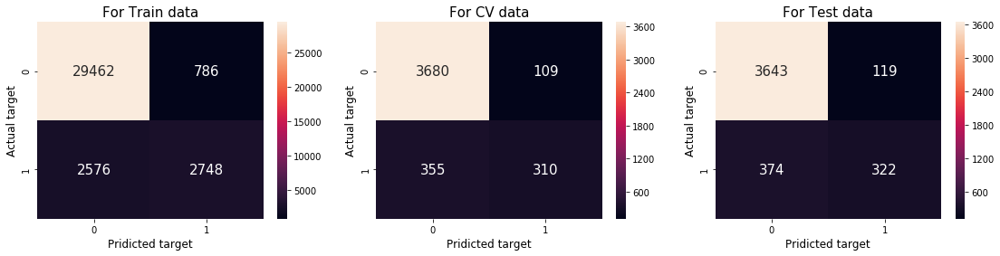




                                        *************** for 'female' identity ***************


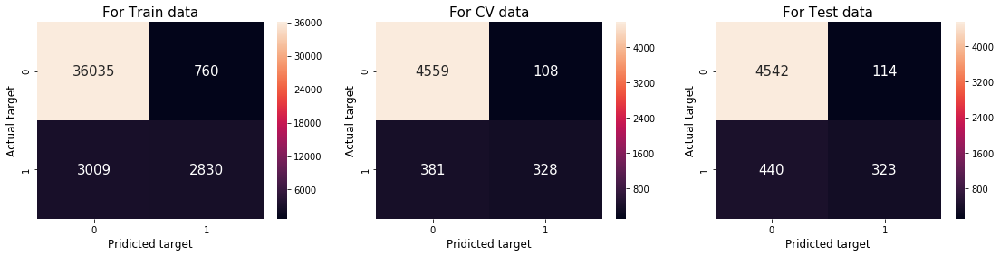




                                        *************** for 'homosexual_gay_or_lesbian' identity ***************


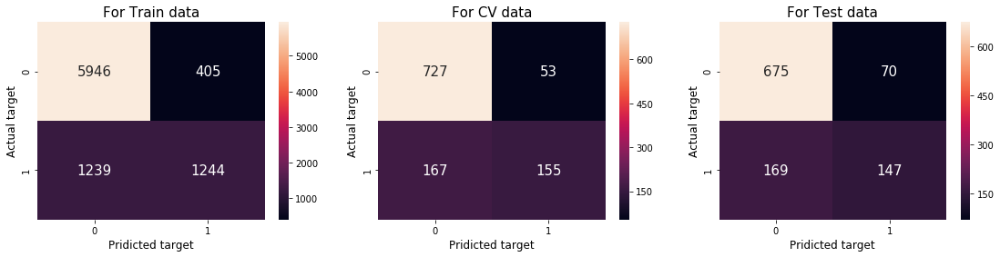




                                        *************** for 'christian' identity ***************


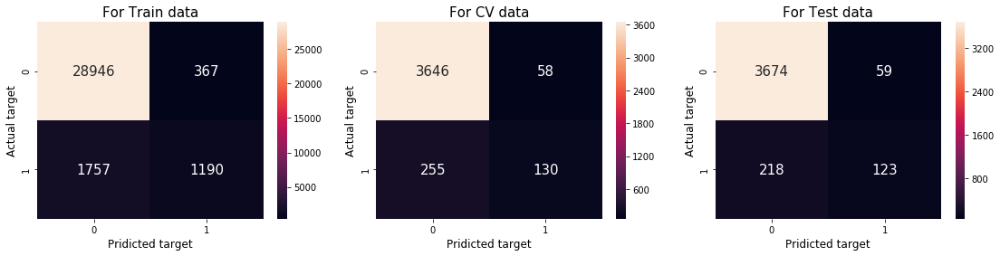




                                        *************** for 'jewish' identity ***************


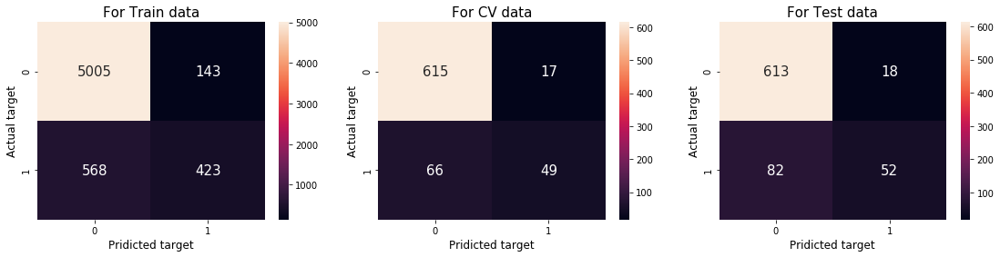




                                        *************** for 'muslim' identity ***************


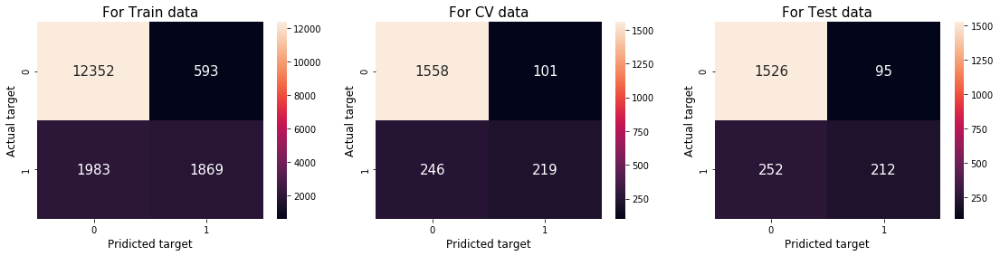




                                        *************** for 'black' identity ***************


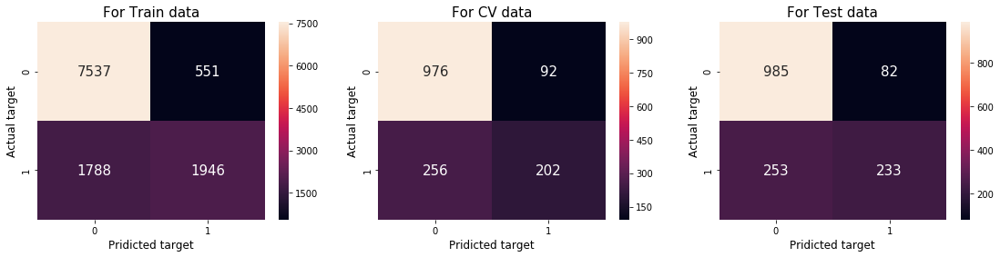




                                        *************** for 'white' identity ***************


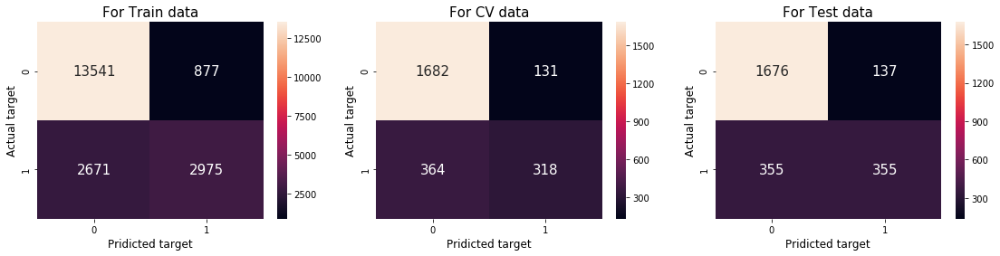




                                        *************** for 'psychiatric_or_mental_illness' identity ***************


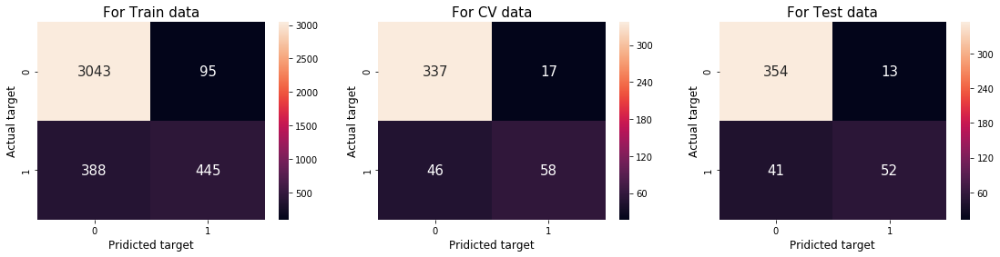

In [0]:
tr, cv, te = report_stacked_mode()
model_perf.add_row(["Stacked Models", "None", "None", tr, cv, te])

## **4.7 Test data Prediction**

In [0]:
!unzip "/content/drive/My Drive/Colab Notebooks/Datasets/Personal Case Study/Jigsaw Unintended Bias in Toxicity Classification/Dataset/Raw Dataset/test.csv.zip"

Archive:  /content/drive/My Drive/Colab Notebooks/Datasets/Personal Case Study/Jigsaw Unintended Bias in Toxicity Classification/Dataset/Raw Dataset/test.csv.zip
  inflating: test.csv                


In [0]:
df_test = pd.read_csv("/content/test.csv")

print("\nhand crafted features...")
df_test = feature(df_test)

tic = time.time()
print("\nprocessing train data...")
df_test.loc[:,"comment_text"] = df_test.apply(text_process, axis = 1)
print("Time take to process the text data: {:.2f} seconds".format(time.time()-tic))


hand crafted features...
Creating hand crafted features...
 For 'word_count' feature...
 For 'char_count' feature...
 For 'word_density' feature...
 For 'total_length' feature...
 For 'capitals' feature...
 For 'caps_vs_length' feature...
 For 'punc_count' feature...
 For 'num_exclamation_marks' feature...
 For 'exlamation_vs_punc_count' feature...
 For 'num_question_marks' feature...
 For 'question_vs_punc_count' feature...
 For 'num_symbols' feature...
 For 'num_unique_words' feature...
 For 'words_vs_unique' feature...

ALL Done!
Time take for this is 13.2976 seconds

processing train data...
Time take to process the text data: 14.71 seconds


In [0]:
uni_bow_vectorizer = CountVectorizer(min_df = 1, max_features = 10000)
uni_bow_vectorizer.fit(X_train["comment_text"].values)

std = StandardScaler()

test_hand_craft = df_test[df.columns[-14:]]

print("BoW vectorizer...")
test_uni_bow = uni_bow_vectorizer.transform(df_test["comment_text"].values)

print("\nHand crafted vectorizer...")
test_hand_crafted = std.fit_transform(test_hand_craft.values)

print("\nStacking bow and hand crafted...")
test_stacked = hstack((test_uni_bow, test_hand_crafted)).tocsr()

print("word to sequences...")
test_encoded_text = text_to_seq(df_test["comment_text"].values, tokens, max_lenght)

KeyboardInterrupt: ignored

In [0]:
# laoding the DL models
print("Loading the DL models...")
model_1 = load_model(model_path+"Model_1.h5")
model_2 = load_model(model_path+"Model_2.h5")
model_3 = load_model(model_path+"Model_3.h5")
model_4 = load_model(model_path+"Model_4.h5")

print("laoding the ML models...")
with open(model_path+"GBDT1.pkl", "rb") as f:
    model_5 = pickle.load(f)
    
with open(model_path+"log_reg1.pkl", "rb") as f:
    model_6 = pickle.load(f)

# **5 Conclusion**

In [0]:
model_perf.add_row(["Stacked Models", "None", "None", tr, cv, te])

In [0]:
model_perf.sortby = "test metric (AUC)"
model_perf.reversesort = True

In [0]:
print(model_perf)

+---------------------+----------------+----------+--------------------+--------------------+--------------------+
|      Model Name     |   Vectorizer   |  n-gram  | train metric (AUC) |  CV metric (AUC)   | test metric (AUC)  |
+---------------------+----------------+----------+--------------------+--------------------+--------------------+
|    Stacked Models   |      None      |   None   | 0.926991535536964  | 0.9033042147192603 | 0.9048129145174189 |
|     DL (Model-4)    | Word Embedding |   None   | 0.9307712404714833 | 0.8995872843166014 | 0.9023269092118973 |
|     DL (Model-2)    | Word Embedding |   None   | 0.9189363820390681 | 0.8906979392525022 | 0.8921975068933153 |
|     DL (Model-3)    | Word Embedding |   None   | 0.8934585187090411 | 0.8887789103987158 | 0.8897595856331972 |
|     DL (Model-1)    |      BoW       | uni-gram | 0.8409232074979224 | 0.8069762301763223 | 0.813117647348719  |
|         GBDT        |      BoW       | uni-gram | 0.8104819546772242 | 0.78390

**Summary**
* There was many words in senetences which does not play important role to understand them so they're removed. This is called stopword removal. Then html tags, extra spaces, special characaters are removed. After doing this basic thing data was split into **train, & test** dataset using **80-10-10**. 
* Then **BoW** was selected out of **TFIDF & BoW** because **BoW** is giving much better performance than **TFIDF**. So text data was converted into vectors using **BoW** (uni and bi -gram) and **W2V**.
* Then various models are trained using these vectors and above table shows the performace of each model.
* After trying a few models, I saw that **W2V** is not very good job and time computation using **W2V** vector was too much. So **W2V** has not been tried with **RF & GBDT** models.
* After trying various classical ML model, I saw that they're not giving good performance, So i tried some DL models. The perofmance of DL models is outstanding.
* With classical ML model (including ensemble models), I got **0.78** final AUC values and with DL model I got **0.9023**. 
* Finally I stacked the models whose perfromance are good and this gave me **0.9048** final AUC value.